## Gerekli Kütüphaneleri İndirme

In [1]:
!pip install pandas numpy matplotlib scikit-learn
!pip install yfinance
!pip install torch
!pip install mplfinance
!pip install lightgbm


## Kütüphaneleri Import Etme

In [2]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import lightgbm as lgb
from sklearn.preprocessing import MinMaxScaler
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import datetime
import mplfinance as mpf
from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor

## PyTorch LSTM - AKBNK Hissesi

[*********************100%%**********************]  1 of 1 completed


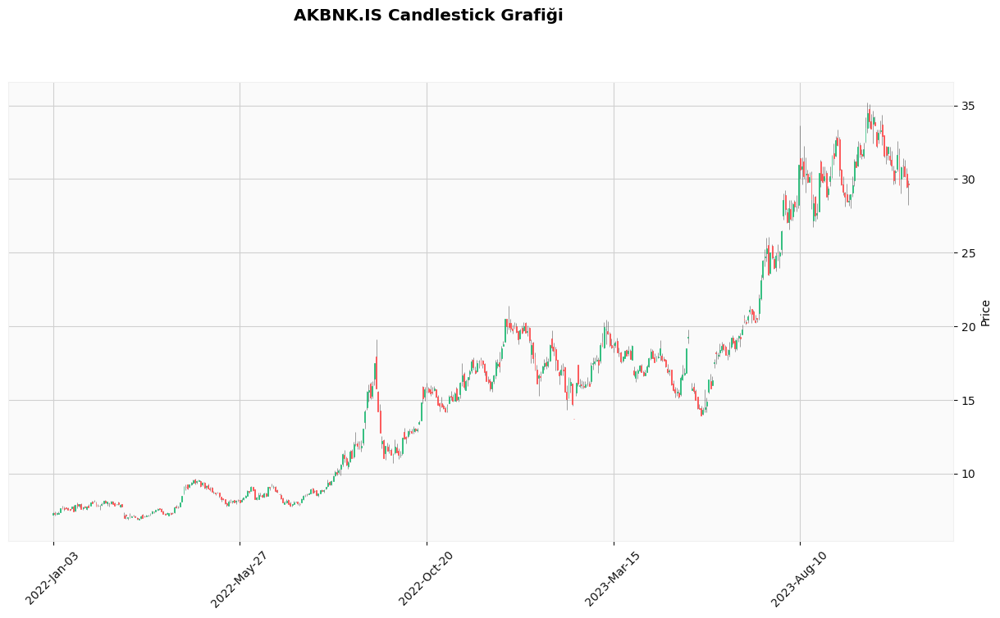

Epoch [1/100], Loss: 0.02921454794704914
Epoch [2/100], Loss: 0.02503952383995056
Epoch [3/100], Loss: 0.02128874696791172
Epoch [4/100], Loss: 0.015917662531137466
Epoch [5/100], Loss: 0.00637828791514039
Epoch [6/100], Loss: 0.0012840982526540756
Epoch [7/100], Loss: 0.0025455330032855272
Epoch [8/100], Loss: 0.0016213306225836277
Epoch [9/100], Loss: 0.0018213051371276379
Epoch [10/100], Loss: 0.002147331601008773
Epoch [11/100], Loss: 0.001434683334082365
Epoch [12/100], Loss: 0.0014401567168533802
Epoch [13/100], Loss: 0.0019328142516314983
Epoch [14/100], Loss: 0.0015597972087562084
Epoch [15/100], Loss: 0.002218139823526144
Epoch [16/100], Loss: 0.001456994446925819
Epoch [17/100], Loss: 0.0026231794618070126
Epoch [18/100], Loss: 0.000613662414252758
Epoch [19/100], Loss: 0.0011486136354506016
Epoch [20/100], Loss: 0.000577709695789963
Epoch [21/100], Loss: 0.002384698949754238
Epoch [22/100], Loss: 0.0020690769888460636
Epoch [23/100], Loss: 0.000981433899141848
Epoch [24/100]

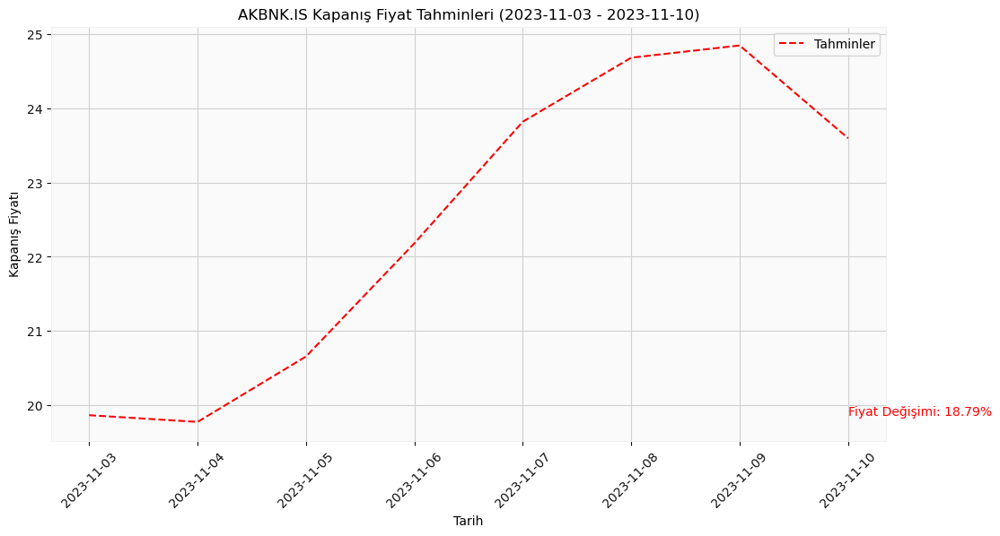

In [3]:

# Veri çekme
symbol = 'AKBNK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - ALARK Hissesi

[*********************100%%**********************]  1 of 1 completed


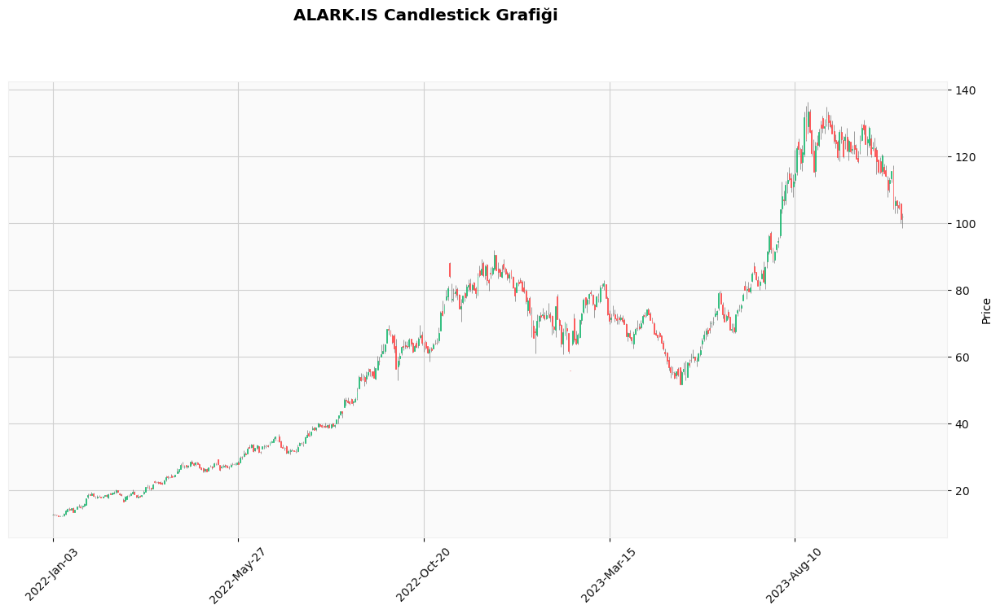

Epoch [1/100], Loss: 0.024629974737763405
Epoch [2/100], Loss: 0.035940539091825485
Epoch [3/100], Loss: 0.03404517099261284
Epoch [4/100], Loss: 0.01600988581776619
Epoch [5/100], Loss: 0.010209600441157818
Epoch [6/100], Loss: 0.0040761930868029594
Epoch [7/100], Loss: 0.004225683398544788
Epoch [8/100], Loss: 0.001207752269692719
Epoch [9/100], Loss: 0.00273328204639256
Epoch [10/100], Loss: 0.0014058564556762576
Epoch [11/100], Loss: 0.0012211878784000874
Epoch [12/100], Loss: 0.0007147452561184764
Epoch [13/100], Loss: 0.0016393562545999885
Epoch [14/100], Loss: 0.0008425362757407129
Epoch [15/100], Loss: 0.000910479633603245
Epoch [16/100], Loss: 0.0012663766974583268
Epoch [17/100], Loss: 0.001169169438071549
Epoch [18/100], Loss: 0.0007191300392150879
Epoch [19/100], Loss: 0.0009307056316174567
Epoch [20/100], Loss: 0.0009682379895821214
Epoch [21/100], Loss: 0.0008732637506909668
Epoch [22/100], Loss: 0.0007409745012409985
Epoch [23/100], Loss: 0.0005526943714357913
Epoch [24/

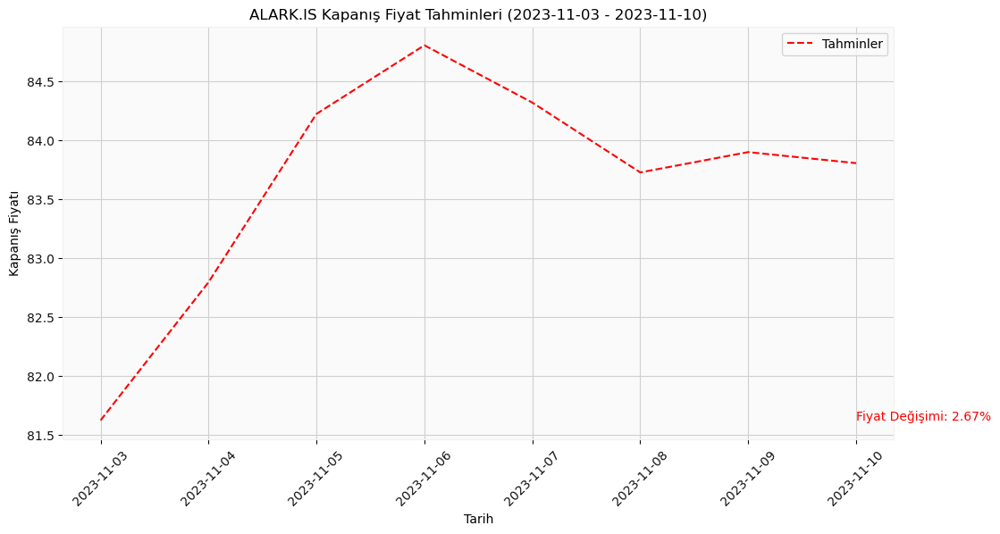

In [4]:

# Veri çekme
symbol = 'ALARK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - ARCLK Hissesi

[*********************100%%**********************]  1 of 1 completed


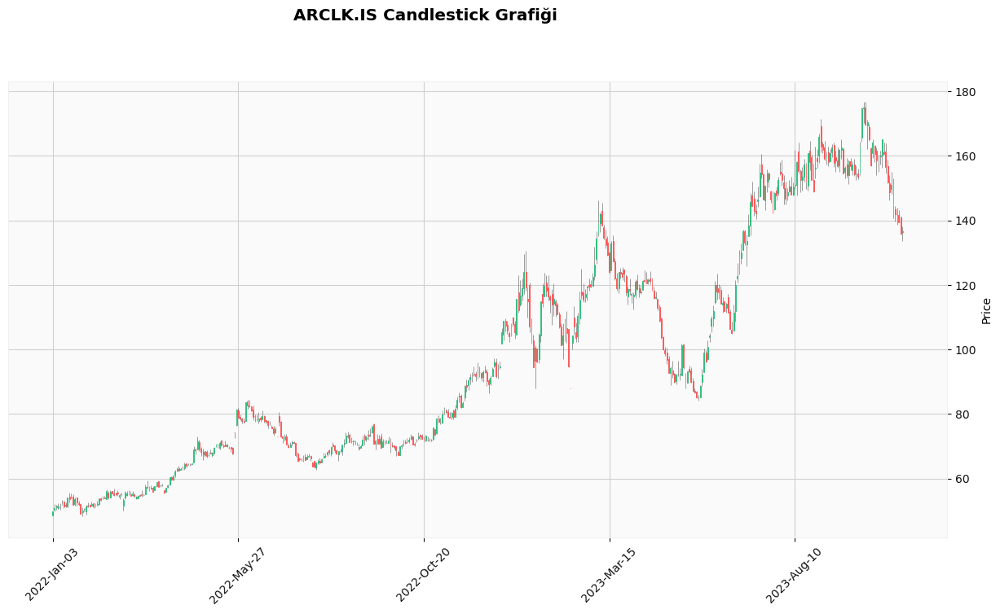

Epoch [1/100], Loss: 0.03619587793946266
Epoch [2/100], Loss: 0.017144445329904556
Epoch [3/100], Loss: 0.016534514725208282
Epoch [4/100], Loss: 0.002686677034944296
Epoch [5/100], Loss: 0.006449649576097727
Epoch [6/100], Loss: 0.00793447531759739
Epoch [7/100], Loss: 0.0029723376501351595
Epoch [8/100], Loss: 0.0038834107108414173
Epoch [9/100], Loss: 0.0023066611029207706
Epoch [10/100], Loss: 0.0016285869060084224
Epoch [11/100], Loss: 0.0033332398161292076
Epoch [12/100], Loss: 0.0015023206360638142
Epoch [13/100], Loss: 0.0025234175845980644
Epoch [14/100], Loss: 0.003056897781789303
Epoch [15/100], Loss: 0.0018035134999081492
Epoch [16/100], Loss: 0.0018859222764149308
Epoch [17/100], Loss: 0.0016411090036854148
Epoch [18/100], Loss: 0.0017860028892755508
Epoch [19/100], Loss: 0.0021661787759512663
Epoch [20/100], Loss: 0.001343845622614026
Epoch [21/100], Loss: 0.001141108339652419
Epoch [22/100], Loss: 0.00048298886395059526
Epoch [23/100], Loss: 0.0015425907913595438
Epoch [

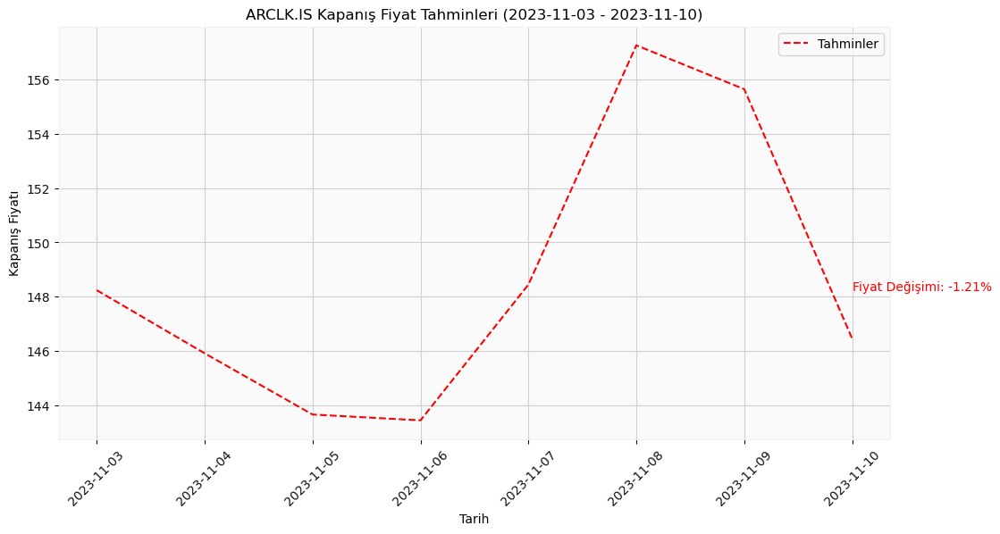

In [5]:

# Veri çekme
symbol = 'ARCLK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - ASELS Hissesi

[*********************100%%**********************]  1 of 1 completed


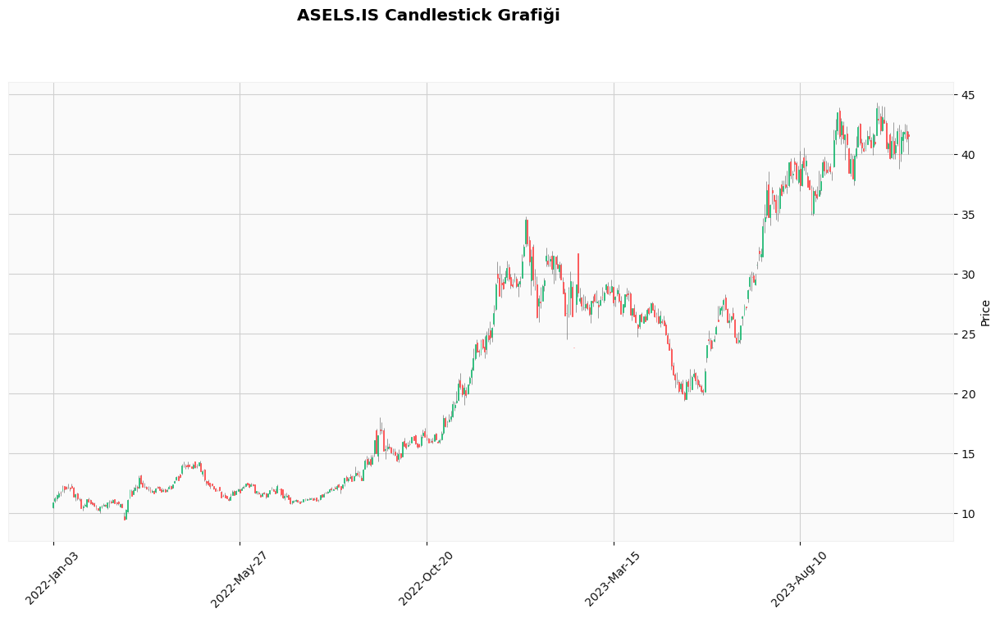

Epoch [1/100], Loss: 0.03976994380354881
Epoch [2/100], Loss: 0.03210071101784706
Epoch [3/100], Loss: 0.025709806010127068
Epoch [4/100], Loss: 0.004859438631683588
Epoch [5/100], Loss: 0.004875210579484701
Epoch [6/100], Loss: 0.004148771986365318
Epoch [7/100], Loss: 0.0046315486542880535
Epoch [8/100], Loss: 0.0009398937108926475
Epoch [9/100], Loss: 0.00314910220913589
Epoch [10/100], Loss: 0.0008739670738577843
Epoch [11/100], Loss: 0.0007710071513429284
Epoch [12/100], Loss: 0.0015584653010591865
Epoch [13/100], Loss: 0.0018213451839983463
Epoch [14/100], Loss: 0.001754219178110361
Epoch [15/100], Loss: 0.001367041957564652
Epoch [16/100], Loss: 0.0023240733426064253
Epoch [17/100], Loss: 0.0009118709713220596
Epoch [18/100], Loss: 0.0029493970796465874
Epoch [19/100], Loss: 0.000720428884960711
Epoch [20/100], Loss: 0.0015270665753632784
Epoch [21/100], Loss: 0.0027339854277670383
Epoch [22/100], Loss: 0.0006585157825611532
Epoch [23/100], Loss: 0.0016767513006925583
Epoch [24/

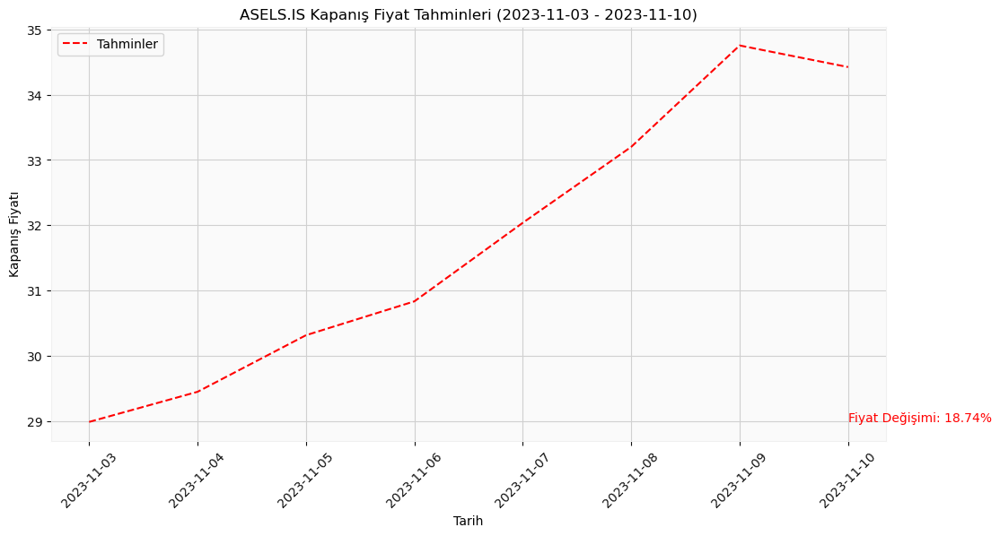

In [6]:

# Veri çekme
symbol = 'ASELS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - BIMAS Hissesi

[*********************100%%**********************]  1 of 1 completed


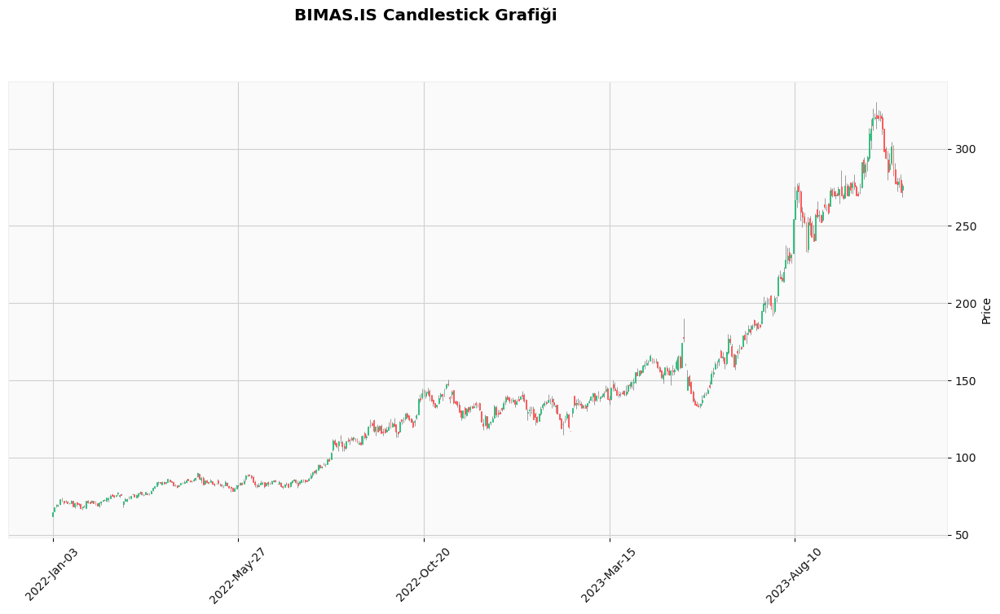

Epoch [1/100], Loss: 0.017676210030913353
Epoch [2/100], Loss: 0.013904569670557976
Epoch [3/100], Loss: 0.009366592392325401
Epoch [4/100], Loss: 0.010263990610837936
Epoch [5/100], Loss: 0.004129903391003609
Epoch [6/100], Loss: 0.0007264052401296794
Epoch [7/100], Loss: 0.0017243963666260242
Epoch [8/100], Loss: 0.001258459291420877
Epoch [9/100], Loss: 0.0006172250723466277
Epoch [10/100], Loss: 0.0005979714915156364
Epoch [11/100], Loss: 0.0005066619487479329
Epoch [12/100], Loss: 0.0002871477627195418
Epoch [13/100], Loss: 0.001219997531734407
Epoch [14/100], Loss: 0.0005220508901402354
Epoch [15/100], Loss: 0.0006395175005309284
Epoch [16/100], Loss: 0.0004034728044643998
Epoch [17/100], Loss: 0.0003277932701166719
Epoch [18/100], Loss: 0.0011441088281571865
Epoch [19/100], Loss: 0.0004493696615099907
Epoch [20/100], Loss: 0.00048802830860950053
Epoch [21/100], Loss: 0.0007883430225774646
Epoch [22/100], Loss: 0.00064328801818192
Epoch [23/100], Loss: 0.0010491108987480402
Epoch

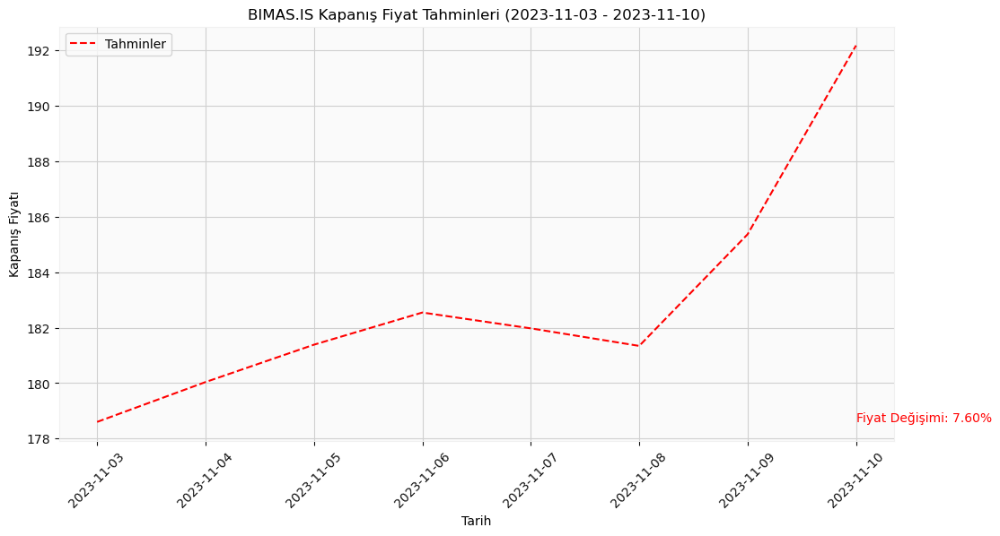

In [7]:

# Veri çekme
symbol = 'BIMAS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - EKGYO Hissesi

[*********************100%%**********************]  1 of 1 completed


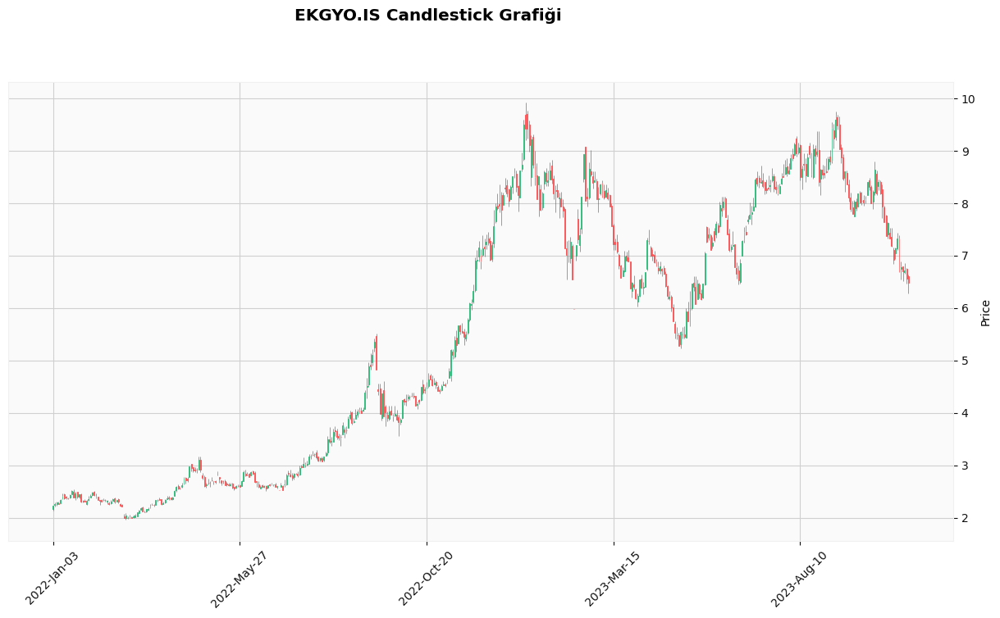

Epoch [1/100], Loss: 0.07602263987064362
Epoch [2/100], Loss: 0.07695739716291428
Epoch [3/100], Loss: 0.019145922735333443
Epoch [4/100], Loss: 0.007138341199606657
Epoch [5/100], Loss: 0.005633837077766657
Epoch [6/100], Loss: 0.007616396062076092
Epoch [7/100], Loss: 0.005273756571114063
Epoch [8/100], Loss: 0.005934383254498243
Epoch [9/100], Loss: 0.003754399251192808
Epoch [10/100], Loss: 0.002520089503377676
Epoch [11/100], Loss: 0.003784725209698081
Epoch [12/100], Loss: 0.0017206273041665554
Epoch [13/100], Loss: 0.0030054645612835884
Epoch [14/100], Loss: 0.004396505653858185
Epoch [15/100], Loss: 0.003659886308014393
Epoch [16/100], Loss: 0.004357285797595978
Epoch [17/100], Loss: 0.0034800877328962088
Epoch [18/100], Loss: 0.002091506728902459
Epoch [19/100], Loss: 0.0019241368863731623
Epoch [20/100], Loss: 0.004814795684069395
Epoch [21/100], Loss: 0.004505154211074114
Epoch [22/100], Loss: 0.004427118226885796
Epoch [23/100], Loss: 0.0021541824098676443
Epoch [24/100], L

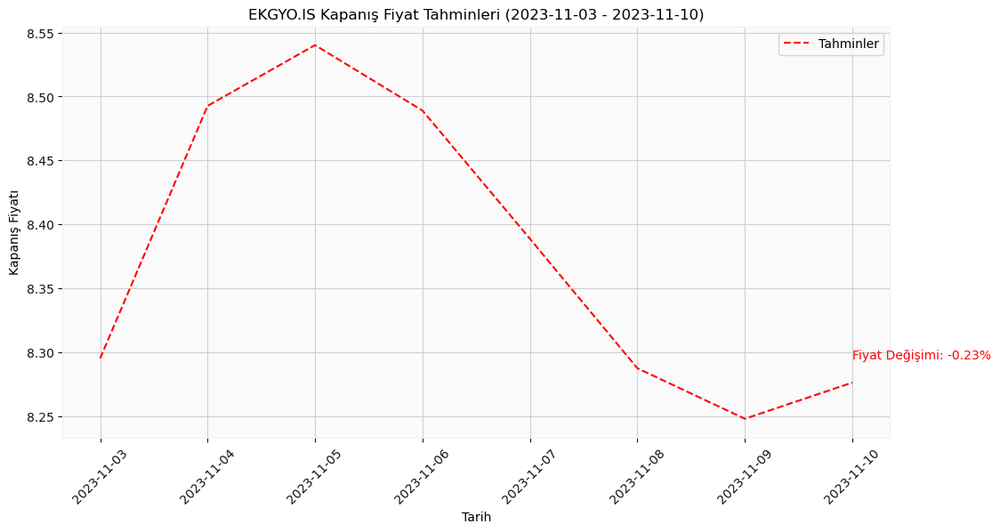

In [8]:

# Veri çekme
symbol = 'EKGYO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - ENKAI Hissesi

[*********************100%%**********************]  1 of 1 completed


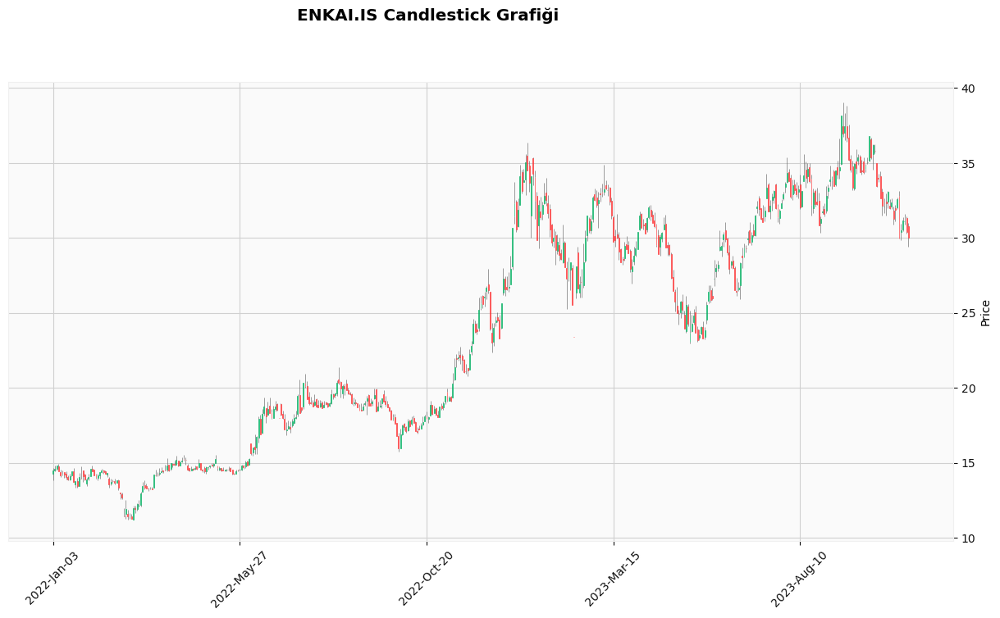

Epoch [1/100], Loss: 0.05962986871600151
Epoch [2/100], Loss: 0.03539513796567917
Epoch [3/100], Loss: 0.03499767556786537
Epoch [4/100], Loss: 0.006968093104660511
Epoch [5/100], Loss: 0.010903322137892246
Epoch [6/100], Loss: 0.002491001272574067
Epoch [7/100], Loss: 0.008277780376374722
Epoch [8/100], Loss: 0.00614817114546895
Epoch [9/100], Loss: 0.005626646801829338
Epoch [10/100], Loss: 0.004671639762818813
Epoch [11/100], Loss: 0.005155946593731642
Epoch [12/100], Loss: 0.0054275658912956715
Epoch [13/100], Loss: 0.003447004361078143
Epoch [14/100], Loss: 0.004211103543639183
Epoch [15/100], Loss: 0.004318913910537958
Epoch [16/100], Loss: 0.002369099296629429
Epoch [17/100], Loss: 0.006648277398198843
Epoch [18/100], Loss: 0.0020681514870375395
Epoch [19/100], Loss: 0.001566900173202157
Epoch [20/100], Loss: 0.002944151172414422
Epoch [21/100], Loss: 0.0022992067970335484
Epoch [22/100], Loss: 0.0035651668440550566
Epoch [23/100], Loss: 0.004727708641439676
Epoch [24/100], Loss

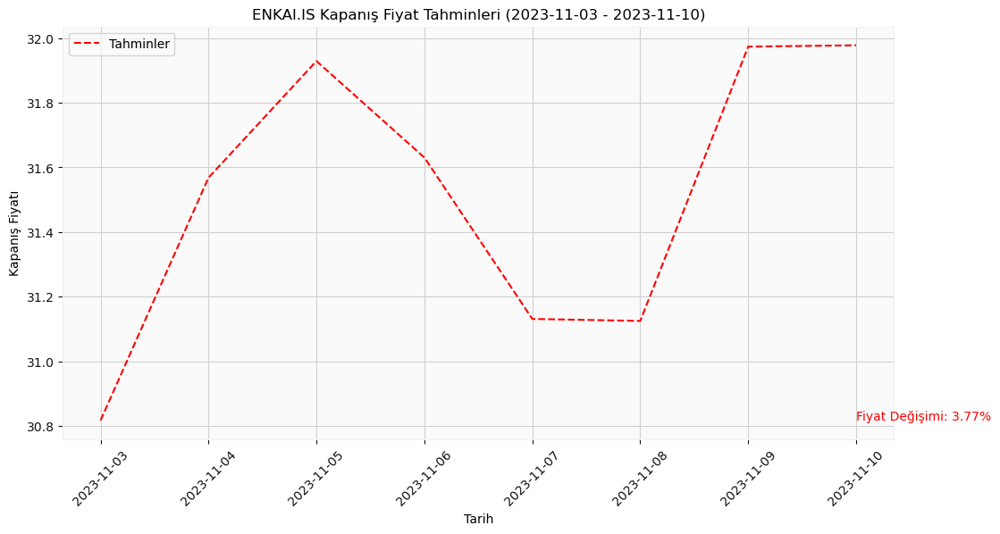

In [9]:

# Veri çekme
symbol = 'ENKAI.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - EREGL Hissesi

[*********************100%%**********************]  1 of 1 completed


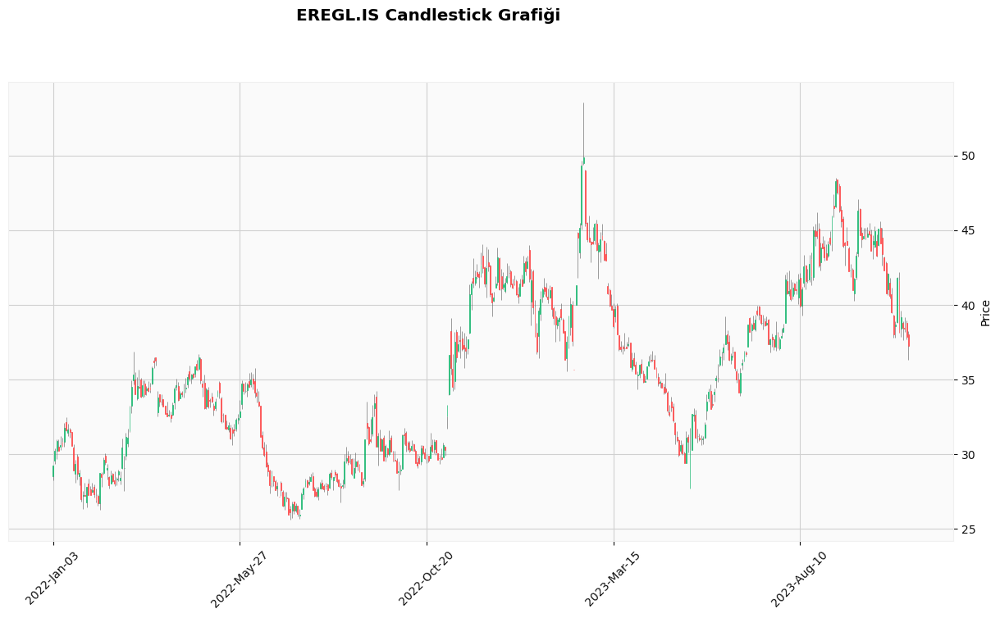

Epoch [1/100], Loss: 0.03689432516694069
Epoch [2/100], Loss: 0.028429623693227768
Epoch [3/100], Loss: 0.019853772595524788
Epoch [4/100], Loss: 0.016411449760198593
Epoch [5/100], Loss: 0.004527016077190638
Epoch [6/100], Loss: 0.008335690014064312
Epoch [7/100], Loss: 0.018370797857642174
Epoch [8/100], Loss: 0.008849024772644043
Epoch [9/100], Loss: 0.006785423029214144
Epoch [10/100], Loss: 0.006714699324220419
Epoch [11/100], Loss: 0.006689982954412699
Epoch [12/100], Loss: 0.0025387767236679792
Epoch [13/100], Loss: 0.0038938350044190884
Epoch [14/100], Loss: 0.0023175023961812258
Epoch [15/100], Loss: 0.015422829426825047
Epoch [16/100], Loss: 0.004993532318621874
Epoch [17/100], Loss: 0.0014771545538678765
Epoch [18/100], Loss: 0.0050629423931241035
Epoch [19/100], Loss: 0.004167589358985424
Epoch [20/100], Loss: 0.0039017670787870884
Epoch [21/100], Loss: 0.006295748986303806
Epoch [22/100], Loss: 0.0013803555630147457
Epoch [23/100], Loss: 0.0025646393187344074
Epoch [24/100

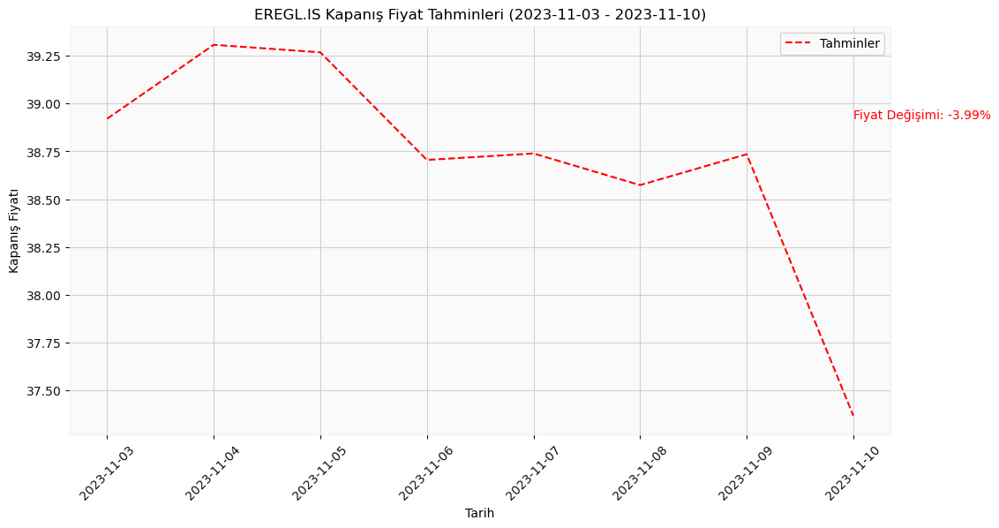

In [10]:

# Veri çekme
symbol = 'EREGL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - FROTO Hissesi

[*********************100%%**********************]  1 of 1 completed


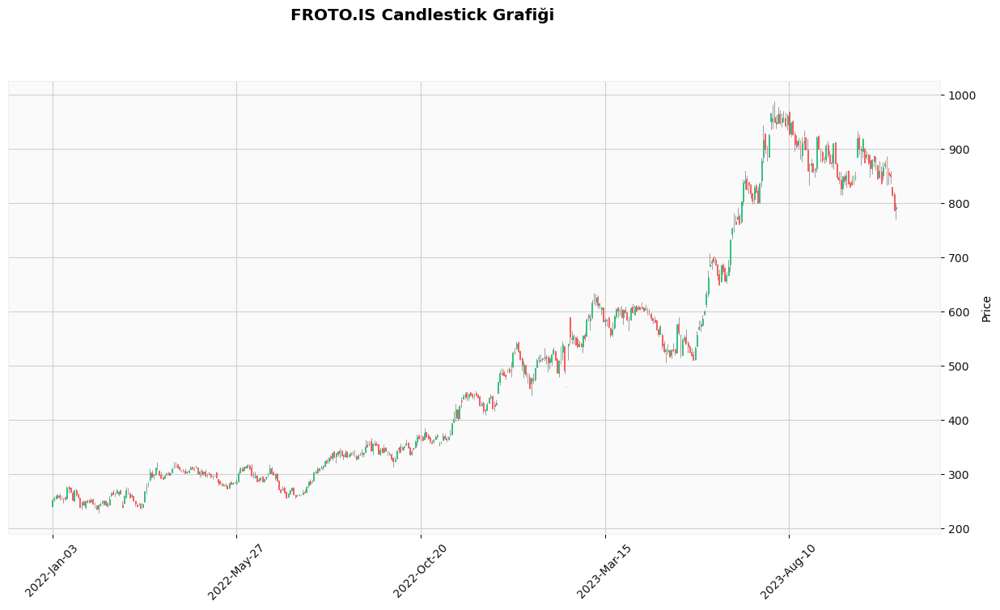

Epoch [1/100], Loss: 0.025304356589913368
Epoch [2/100], Loss: 0.048379164189100266
Epoch [3/100], Loss: 0.013024479150772095
Epoch [4/100], Loss: 0.0031174777541309595
Epoch [5/100], Loss: 0.0014622337184846401
Epoch [6/100], Loss: 0.001950916601344943
Epoch [7/100], Loss: 0.0010104982648044825
Epoch [8/100], Loss: 0.001353203202597797
Epoch [9/100], Loss: 0.0009916695998981595
Epoch [10/100], Loss: 0.0015543930931016803
Epoch [11/100], Loss: 0.0009093057014979422
Epoch [12/100], Loss: 0.0015032117953523993
Epoch [13/100], Loss: 0.0005634864210151136
Epoch [14/100], Loss: 0.0018753341864794493
Epoch [15/100], Loss: 0.001068625831976533
Epoch [16/100], Loss: 0.002233494771644473
Epoch [17/100], Loss: 0.0017322730273008347
Epoch [18/100], Loss: 0.0012379344552755356
Epoch [19/100], Loss: 0.0012190621346235275
Epoch [20/100], Loss: 0.0012055699480697513
Epoch [21/100], Loss: 0.0009202490909956396
Epoch [22/100], Loss: 0.0013292449293658137
Epoch [23/100], Loss: 0.0018009196501225233
Epoc

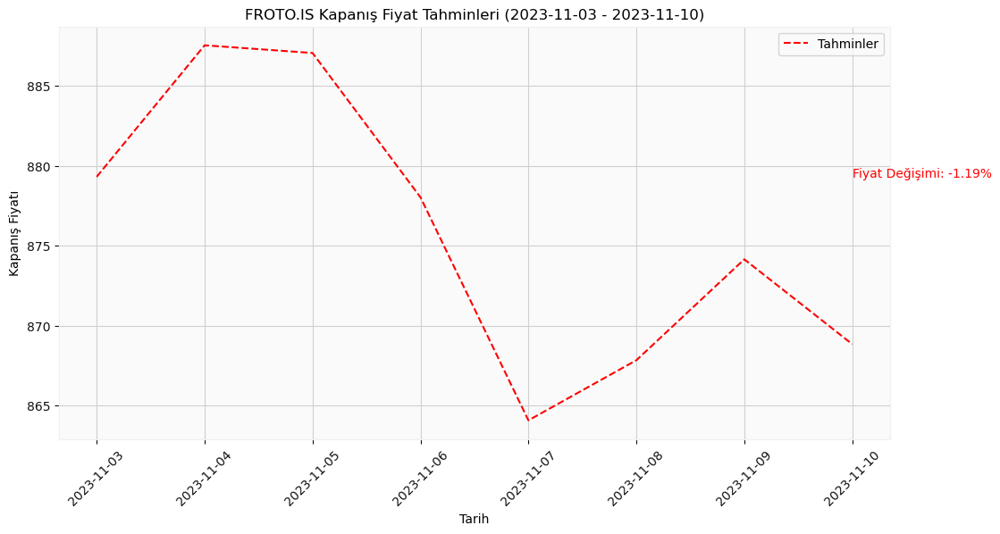

In [11]:

# Veri çekme
symbol = 'FROTO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - GARAN Hissesi

[*********************100%%**********************]  1 of 1 completed


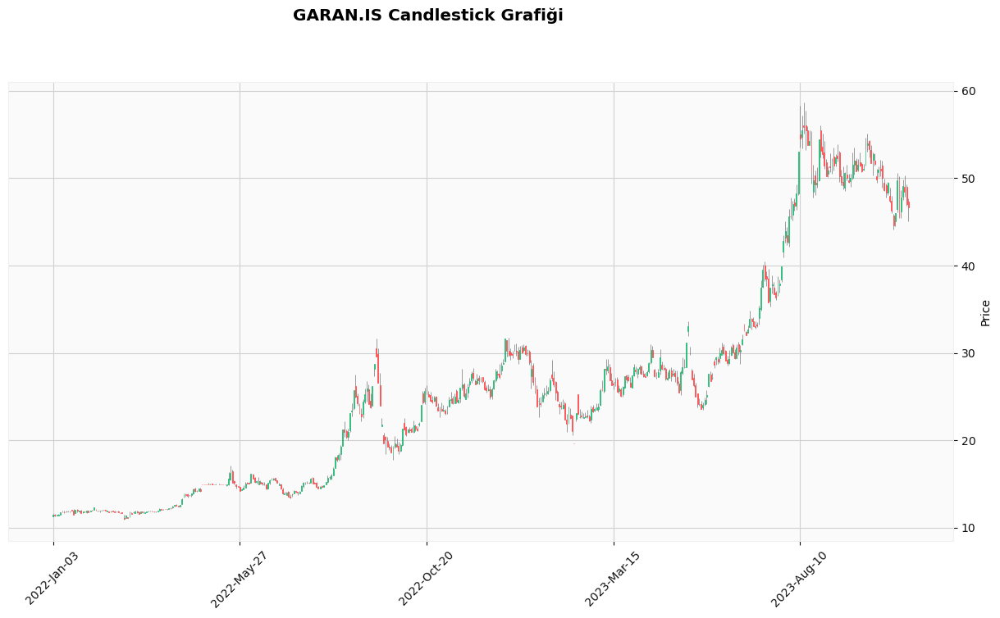

Epoch [1/100], Loss: 0.024508506059646606
Epoch [2/100], Loss: 0.029728589579463005
Epoch [3/100], Loss: 0.013610449619591236
Epoch [4/100], Loss: 0.01688109152019024
Epoch [5/100], Loss: 0.0033566688653081656
Epoch [6/100], Loss: 0.003718631574884057
Epoch [7/100], Loss: 0.002211360726505518
Epoch [8/100], Loss: 0.0026024365797638893
Epoch [9/100], Loss: 0.0023977765813469887
Epoch [10/100], Loss: 0.002477946225553751
Epoch [11/100], Loss: 0.0027068019844591618
Epoch [12/100], Loss: 0.0005068581085652113
Epoch [13/100], Loss: 0.0011345414677634835
Epoch [14/100], Loss: 0.0023166954051703215
Epoch [15/100], Loss: 0.0005242227925918996
Epoch [16/100], Loss: 0.0009823932778090239
Epoch [17/100], Loss: 0.0008244487107731402
Epoch [18/100], Loss: 0.001267345272935927
Epoch [19/100], Loss: 0.001134028541855514
Epoch [20/100], Loss: 0.002084075938910246
Epoch [21/100], Loss: 0.0009667866979725659
Epoch [22/100], Loss: 0.003272428410127759
Epoch [23/100], Loss: 0.001200988655909896
Epoch [24/

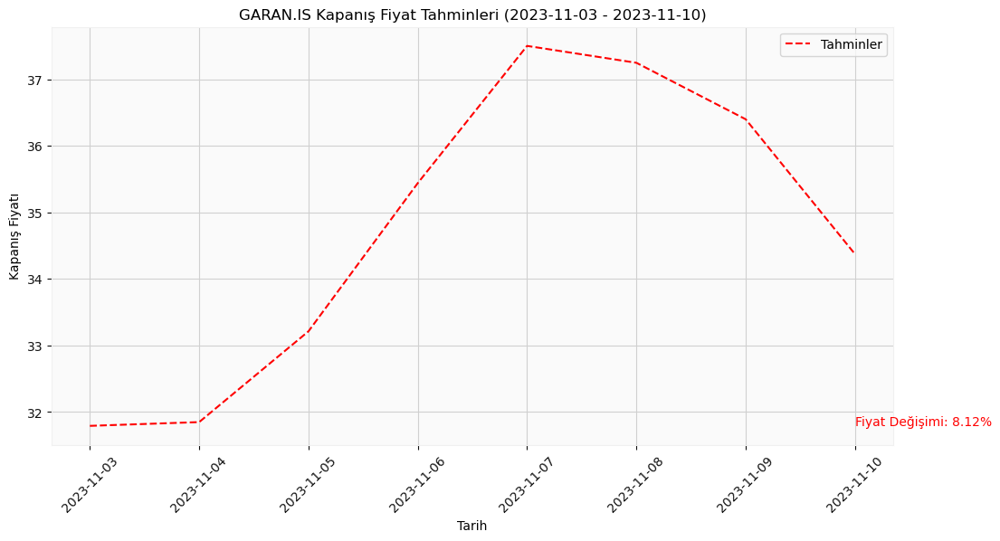

In [12]:

# Veri çekme
symbol = 'GARAN.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - GUBRF Hissesi

[*********************100%%**********************]  1 of 1 completed


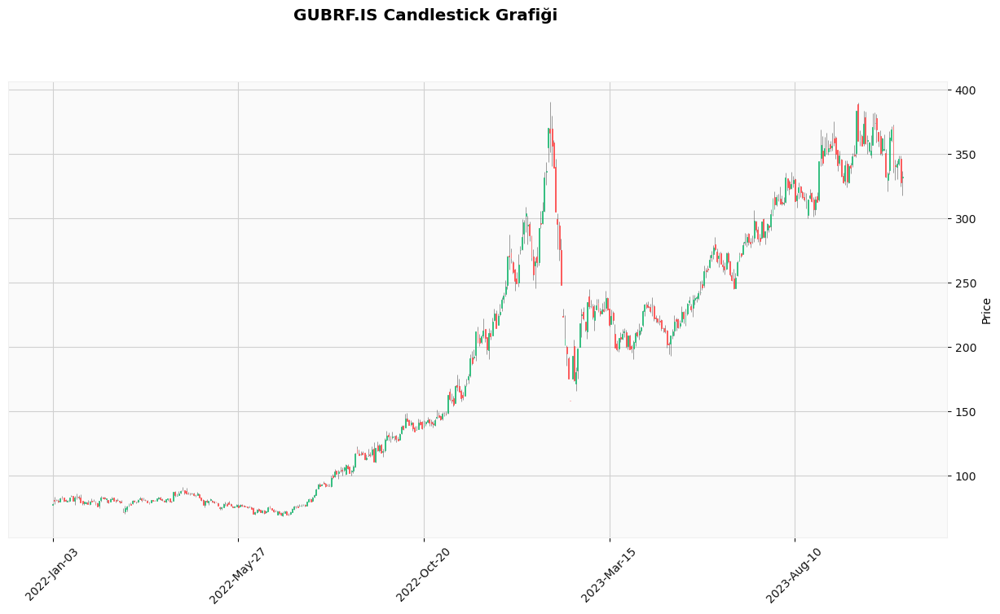

Epoch [1/100], Loss: 0.07738424837589264
Epoch [2/100], Loss: 0.026177426800131798
Epoch [3/100], Loss: 0.018373314291238785
Epoch [4/100], Loss: 0.003828875720500946
Epoch [5/100], Loss: 0.0026335385628044605
Epoch [6/100], Loss: 0.0023110315669327974
Epoch [7/100], Loss: 0.01011011190712452
Epoch [8/100], Loss: 0.0043376535177230835
Epoch [9/100], Loss: 0.008646792732179165
Epoch [10/100], Loss: 0.0010098430793732405
Epoch [11/100], Loss: 0.0014616417465731502
Epoch [12/100], Loss: 0.003576997434720397
Epoch [13/100], Loss: 0.0014123506844043732
Epoch [14/100], Loss: 0.0003828898770734668
Epoch [15/100], Loss: 0.006172553636133671
Epoch [16/100], Loss: 0.0013031454291194677
Epoch [17/100], Loss: 0.00033673009602352977
Epoch [18/100], Loss: 0.004342392552644014
Epoch [19/100], Loss: 0.005390924401581287
Epoch [20/100], Loss: 0.0008188688661903143
Epoch [21/100], Loss: 0.0010212281486019492
Epoch [22/100], Loss: 0.0009864926105365157
Epoch [23/100], Loss: 0.0037856970448046923
Epoch [2

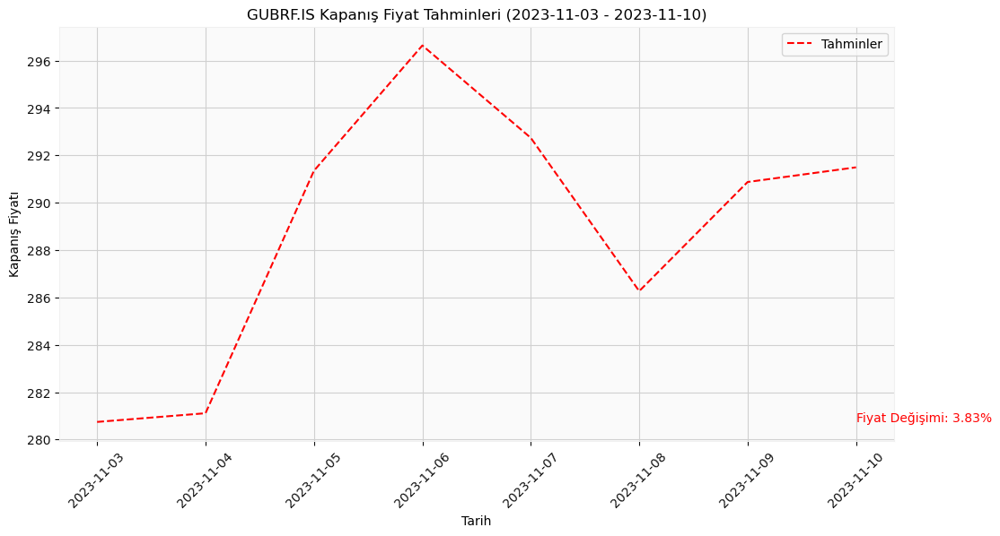

In [13]:

# Veri çekme
symbol = 'GUBRF.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - HEKTS Hissesi

[*********************100%%**********************]  1 of 1 completed


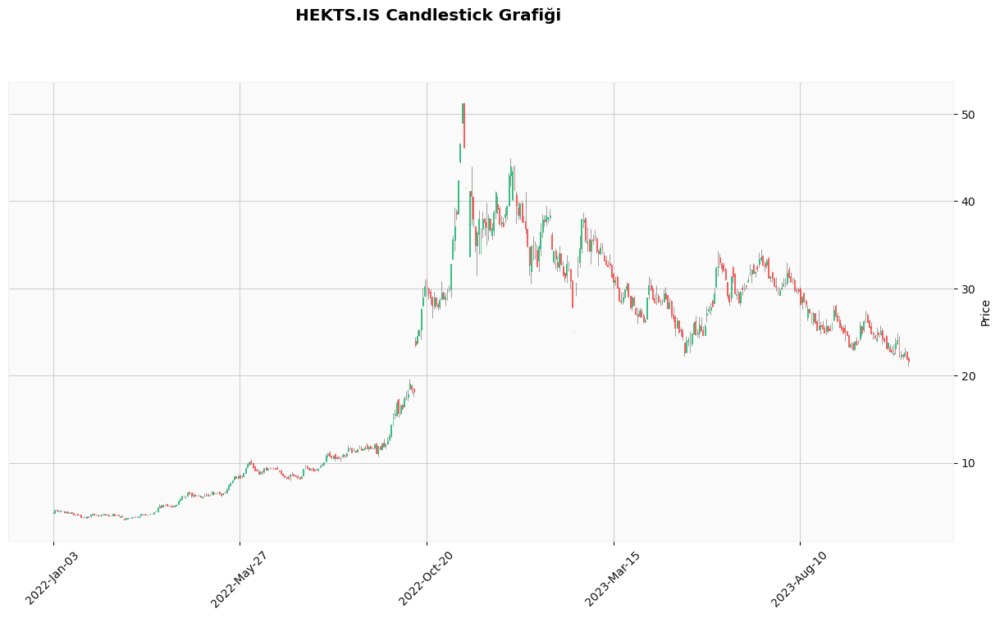

Epoch [1/100], Loss: 0.07504306733608246
Epoch [2/100], Loss: 0.042204368859529495
Epoch [3/100], Loss: 0.03572391718626022
Epoch [4/100], Loss: 0.0192527137696743
Epoch [5/100], Loss: 0.0015940932789817452
Epoch [6/100], Loss: 0.0029797714669257402
Epoch [7/100], Loss: 0.010762960650026798
Epoch [8/100], Loss: 0.0031040823087096214
Epoch [9/100], Loss: 0.0036208622623234987
Epoch [10/100], Loss: 0.0020479667000472546
Epoch [11/100], Loss: 0.005721420980989933
Epoch [12/100], Loss: 0.0031749357003718615
Epoch [13/100], Loss: 0.0025729441549628973
Epoch [14/100], Loss: 0.00487114954739809
Epoch [15/100], Loss: 0.0025335350073873997
Epoch [16/100], Loss: 0.003737295512109995
Epoch [17/100], Loss: 0.0022964030504226685
Epoch [18/100], Loss: 0.0014896525535732508
Epoch [19/100], Loss: 0.0013008315581828356
Epoch [20/100], Loss: 0.0015215330058708787
Epoch [21/100], Loss: 0.0006379994447343051
Epoch [22/100], Loss: 0.0011217644205316901
Epoch [23/100], Loss: 0.0004006712115369737
Epoch [24/

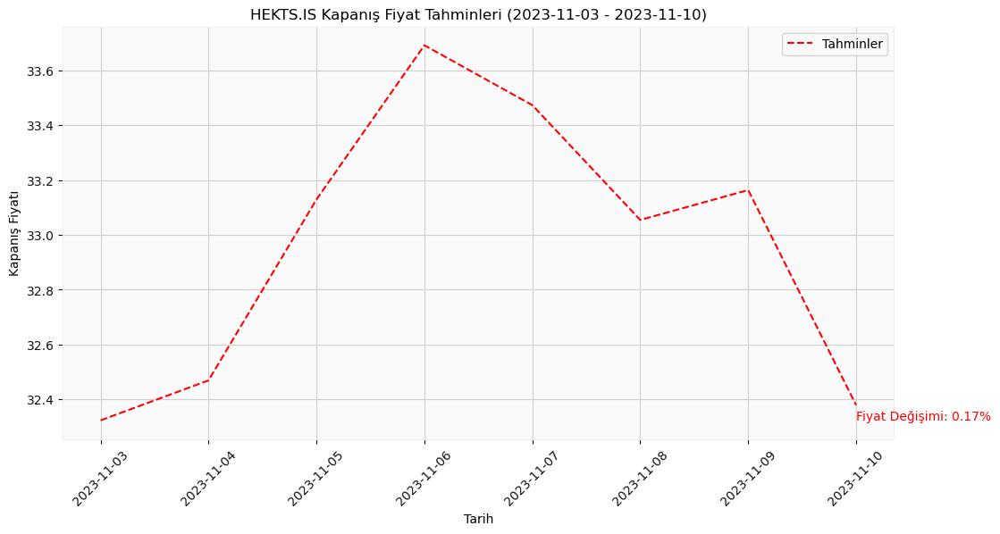

In [14]:

# Veri çekme
symbol = 'HEKTS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - ISCTR Hissesi

[*********************100%%**********************]  1 of 1 completed


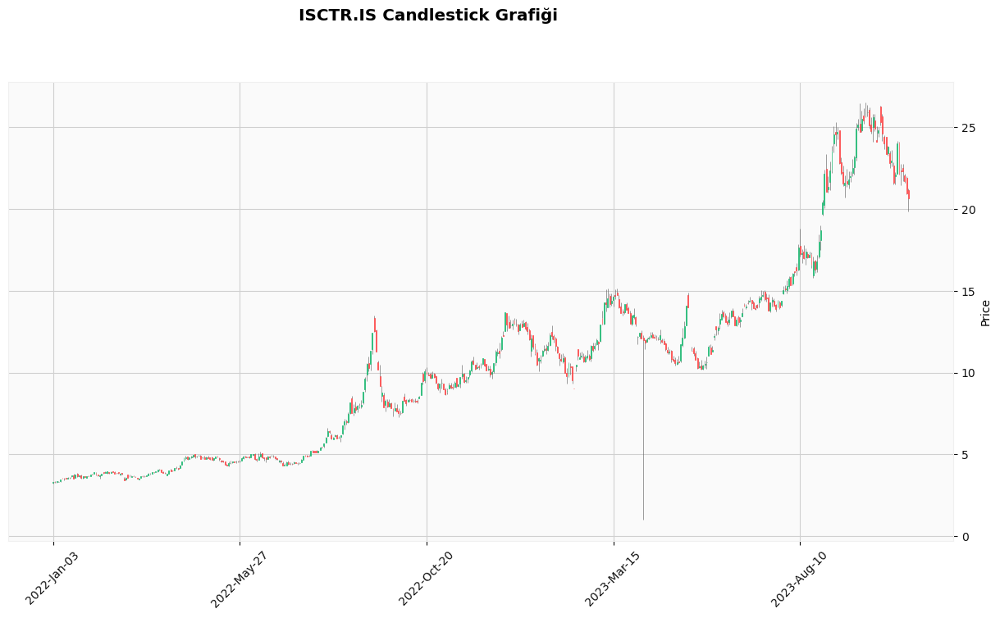

Epoch [1/100], Loss: 0.0281680878251791
Epoch [2/100], Loss: 0.02549007348716259
Epoch [3/100], Loss: 0.015931466594338417
Epoch [4/100], Loss: 0.008473147638142109
Epoch [5/100], Loss: 0.0036517397966235876
Epoch [6/100], Loss: 0.00396490003913641
Epoch [7/100], Loss: 0.0015567817026749253
Epoch [8/100], Loss: 0.0013778377324342728
Epoch [9/100], Loss: 0.0017613935051485896
Epoch [10/100], Loss: 0.0012701790546998382
Epoch [11/100], Loss: 0.0018610632978379726
Epoch [12/100], Loss: 0.0011947330785915256
Epoch [13/100], Loss: 0.0017994235968217254
Epoch [14/100], Loss: 0.0015018217964097857
Epoch [15/100], Loss: 0.0014765537343919277
Epoch [16/100], Loss: 0.0002515348605811596
Epoch [17/100], Loss: 0.0011232242686673999
Epoch [18/100], Loss: 0.001184252556413412
Epoch [19/100], Loss: 0.0026568369939923286
Epoch [20/100], Loss: 0.0019225131254643202
Epoch [21/100], Loss: 0.0004941563820466399
Epoch [22/100], Loss: 0.0027290135622024536
Epoch [23/100], Loss: 0.0014987167669460177
Epoch [

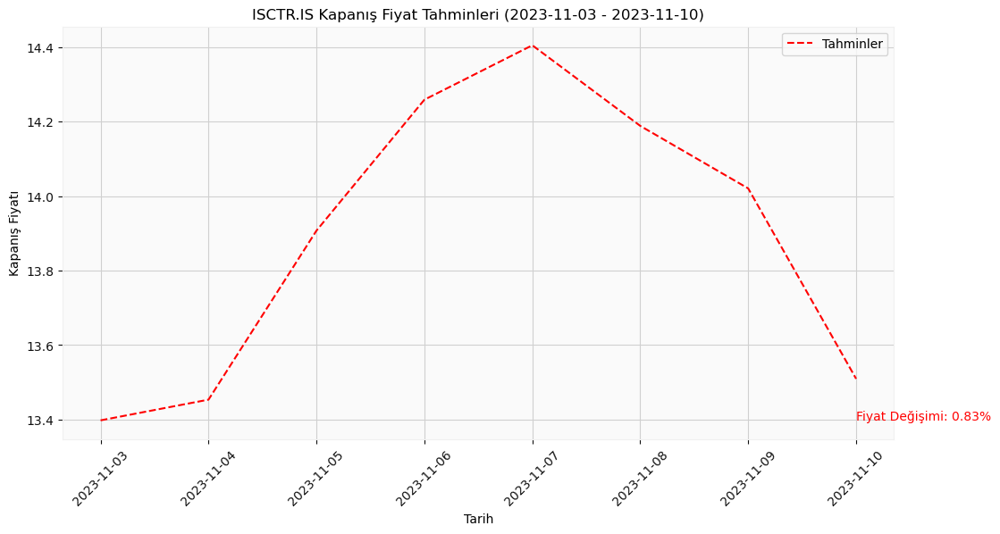

In [15]:

# Veri çekme
symbol = 'ISCTR.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - KCHOL Hissesi

[*********************100%%**********************]  1 of 1 completed


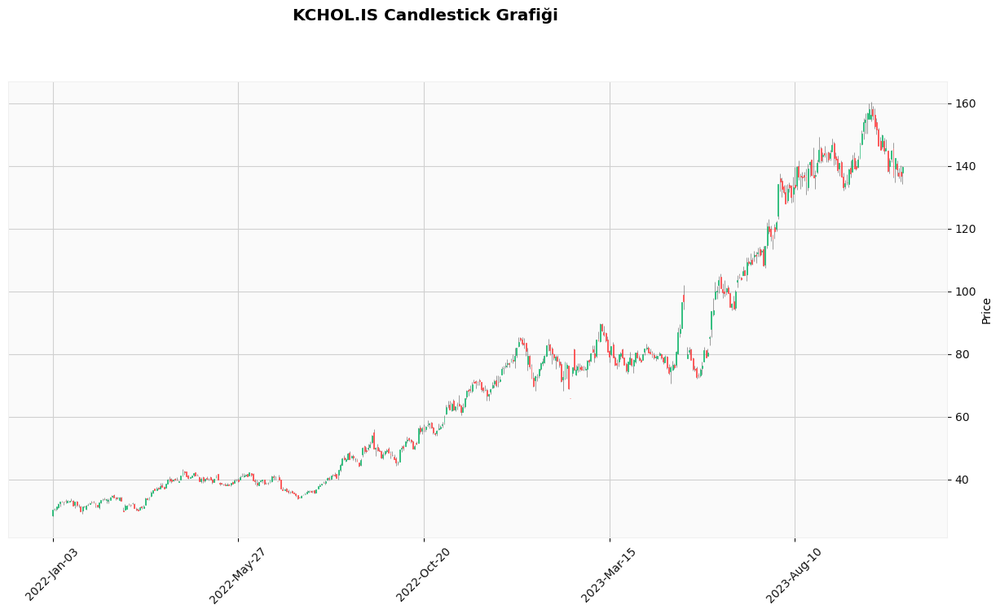

Epoch [1/100], Loss: 0.013938849791884422
Epoch [2/100], Loss: 0.018475737422704697
Epoch [3/100], Loss: 0.018346285447478294
Epoch [4/100], Loss: 0.010642988607287407
Epoch [5/100], Loss: 0.002722011646255851
Epoch [6/100], Loss: 0.0032920013181865215
Epoch [7/100], Loss: 0.0010992928873747587
Epoch [8/100], Loss: 0.0030065940227359533
Epoch [9/100], Loss: 0.0006054187542758882
Epoch [10/100], Loss: 0.0011944097932428122
Epoch [11/100], Loss: 0.0010079768253490329
Epoch [12/100], Loss: 0.000760805734898895
Epoch [13/100], Loss: 0.000739402836188674
Epoch [14/100], Loss: 0.0005822863313369453
Epoch [15/100], Loss: 0.0008132912334986031
Epoch [16/100], Loss: 0.000703226076439023
Epoch [17/100], Loss: 0.0017639094730839133
Epoch [18/100], Loss: 0.0008907102746888995
Epoch [19/100], Loss: 0.002192897954955697
Epoch [20/100], Loss: 0.0008214943809434772
Epoch [21/100], Loss: 0.0015421255957335234
Epoch [22/100], Loss: 0.0027997507713735104
Epoch [23/100], Loss: 0.00044421895290724933
Epoch

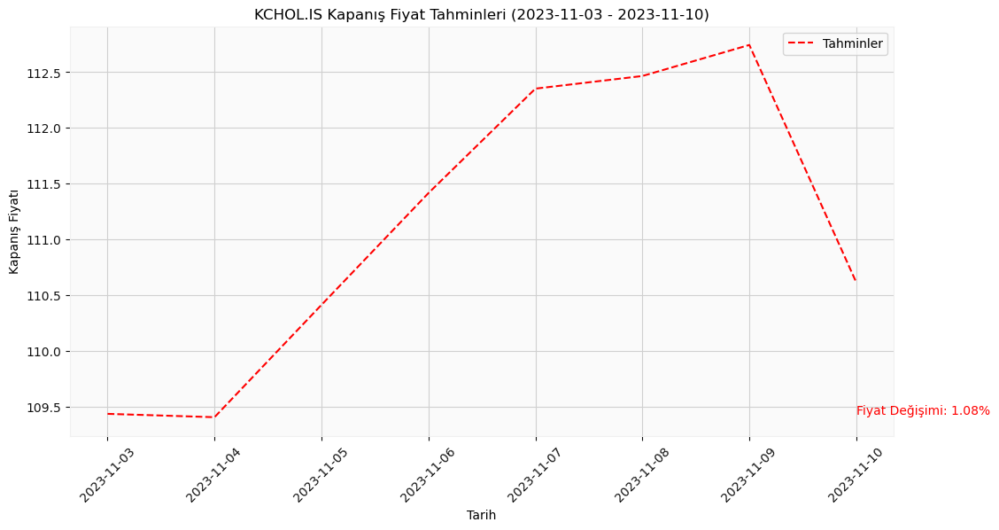

In [16]:

# Veri çekme
symbol = 'KCHOL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - KONTR Hissesi

[*********************100%%**********************]  1 of 1 completed


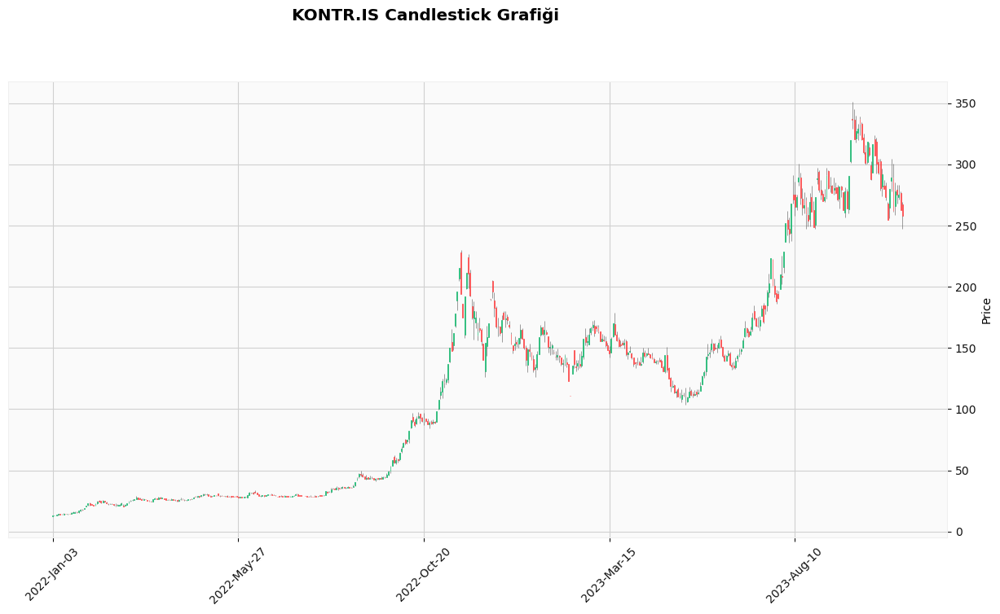

Epoch [1/100], Loss: 0.0445234552025795
Epoch [2/100], Loss: 0.0314243920147419
Epoch [3/100], Loss: 0.022860722616314888
Epoch [4/100], Loss: 0.013983231969177723
Epoch [5/100], Loss: 0.0011423021787777543
Epoch [6/100], Loss: 0.0015545677160844207
Epoch [7/100], Loss: 0.0017532381461933255
Epoch [8/100], Loss: 0.0008108987822197378
Epoch [9/100], Loss: 0.004359446465969086
Epoch [10/100], Loss: 0.0017694395501166582
Epoch [11/100], Loss: 0.0024374090135097504
Epoch [12/100], Loss: 0.001106598530896008
Epoch [13/100], Loss: 0.001068781828507781
Epoch [14/100], Loss: 0.0010109123541042209
Epoch [15/100], Loss: 0.0029052630998194218
Epoch [16/100], Loss: 0.000546256429515779
Epoch [17/100], Loss: 0.0012608361430466175
Epoch [18/100], Loss: 0.0012958445586264133
Epoch [19/100], Loss: 0.0005144078750163317
Epoch [20/100], Loss: 0.0007956895278766751
Epoch [21/100], Loss: 0.0019984005484730005
Epoch [22/100], Loss: 0.0013158287620171905
Epoch [23/100], Loss: 0.0008330906857736409
Epoch [24

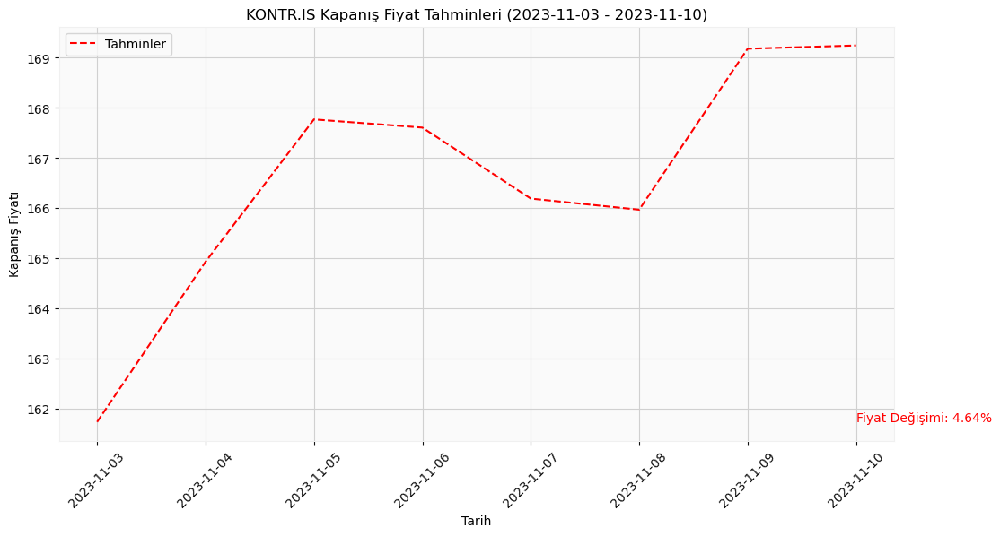

In [17]:

# Veri çekme
symbol = 'KONTR.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - KOZAL Hissesi

[*********************100%%**********************]  1 of 1 completed


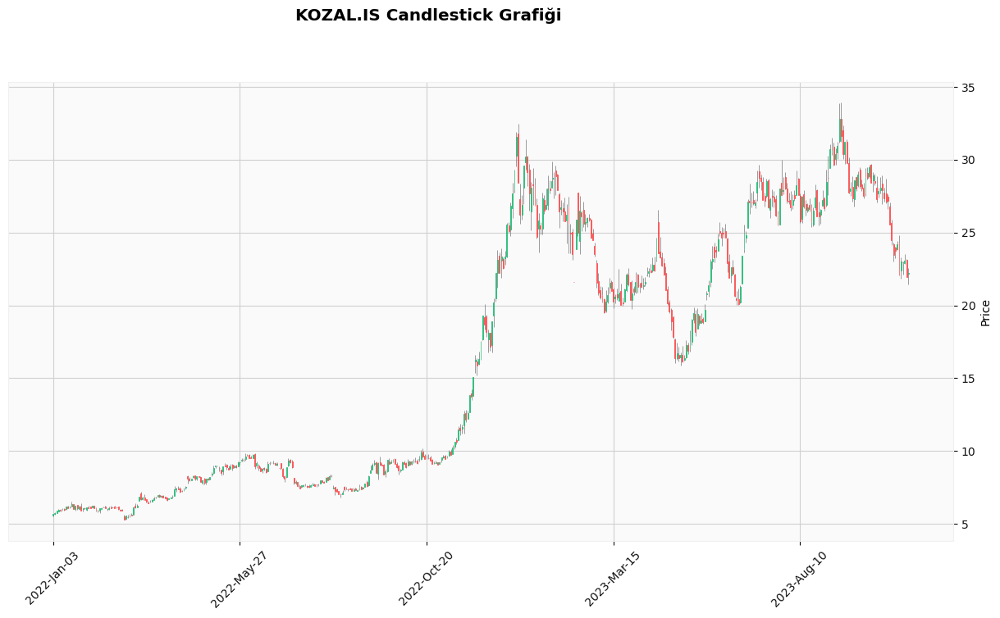

Epoch [1/100], Loss: 0.07562463730573654
Epoch [2/100], Loss: 0.04883745685219765
Epoch [3/100], Loss: 0.017457429319620132
Epoch [4/100], Loss: 0.010820136405527592
Epoch [5/100], Loss: 0.012234194204211235
Epoch [6/100], Loss: 0.007826496846973896
Epoch [7/100], Loss: 0.004381450358778238
Epoch [8/100], Loss: 0.005070455837994814
Epoch [9/100], Loss: 0.003331777174025774
Epoch [10/100], Loss: 0.002116156043484807
Epoch [11/100], Loss: 0.0013943709200248122
Epoch [12/100], Loss: 0.001470730290748179
Epoch [13/100], Loss: 0.0018118737498298287
Epoch [14/100], Loss: 0.001004221849143505
Epoch [15/100], Loss: 0.0011820195941254497
Epoch [16/100], Loss: 0.0019275598460808396
Epoch [17/100], Loss: 0.002520430600270629
Epoch [18/100], Loss: 0.0015960775781422853
Epoch [19/100], Loss: 0.003201960353180766
Epoch [20/100], Loss: 0.0029054952319711447
Epoch [21/100], Loss: 0.004741260781884193
Epoch [22/100], Loss: 0.0013443219941109419
Epoch [23/100], Loss: 0.002191545907407999
Epoch [24/100],

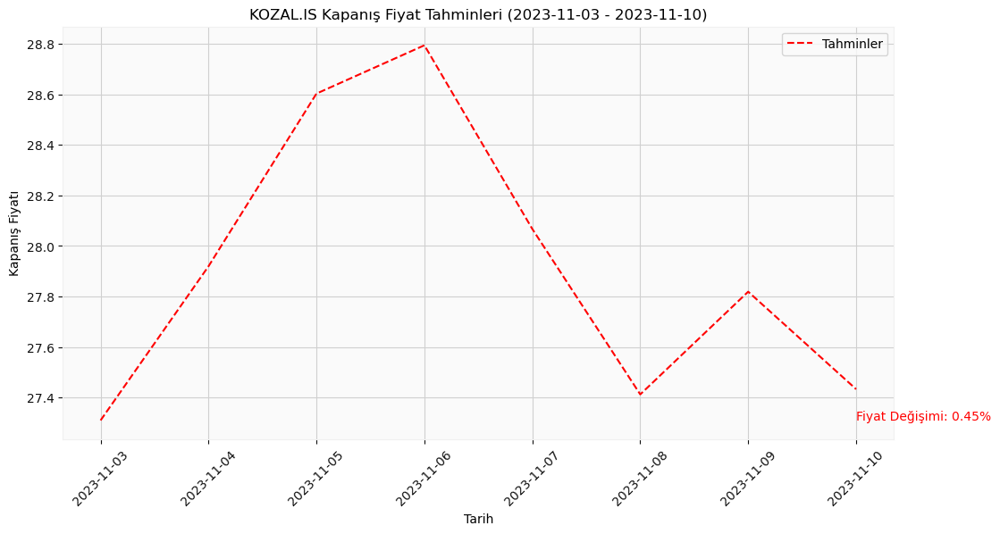

In [18]:

# Veri çekme
symbol = 'KOZAL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - KRDMD Hissesi

[*********************100%%**********************]  1 of 1 completed


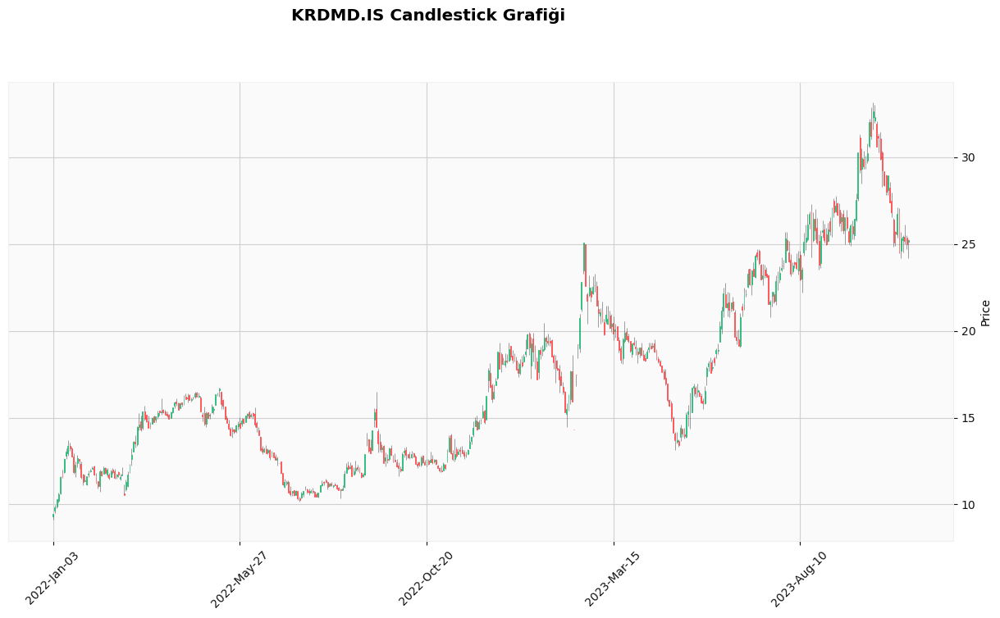

Epoch [1/100], Loss: 0.023450585082173347
Epoch [2/100], Loss: 0.02373938076198101
Epoch [3/100], Loss: 0.025364074856042862
Epoch [4/100], Loss: 0.010091075673699379
Epoch [5/100], Loss: 0.002084107371047139
Epoch [6/100], Loss: 0.0049980697222054005
Epoch [7/100], Loss: 0.0028372593224048615
Epoch [8/100], Loss: 0.002718194155022502
Epoch [9/100], Loss: 0.0024382281117141247
Epoch [10/100], Loss: 0.006744151934981346
Epoch [11/100], Loss: 0.0030458257533609867
Epoch [12/100], Loss: 0.002083786530420184
Epoch [13/100], Loss: 0.0074836998246610165
Epoch [14/100], Loss: 0.001030965126119554
Epoch [15/100], Loss: 0.0013846898218616843
Epoch [16/100], Loss: 0.0016197714721783996
Epoch [17/100], Loss: 0.002024383982643485
Epoch [18/100], Loss: 0.0014869970036670566
Epoch [19/100], Loss: 0.001090503646992147
Epoch [20/100], Loss: 0.001966032898053527
Epoch [21/100], Loss: 0.001034561195410788
Epoch [22/100], Loss: 0.002436890732496977
Epoch [23/100], Loss: 0.000930487469304353
Epoch [24/100

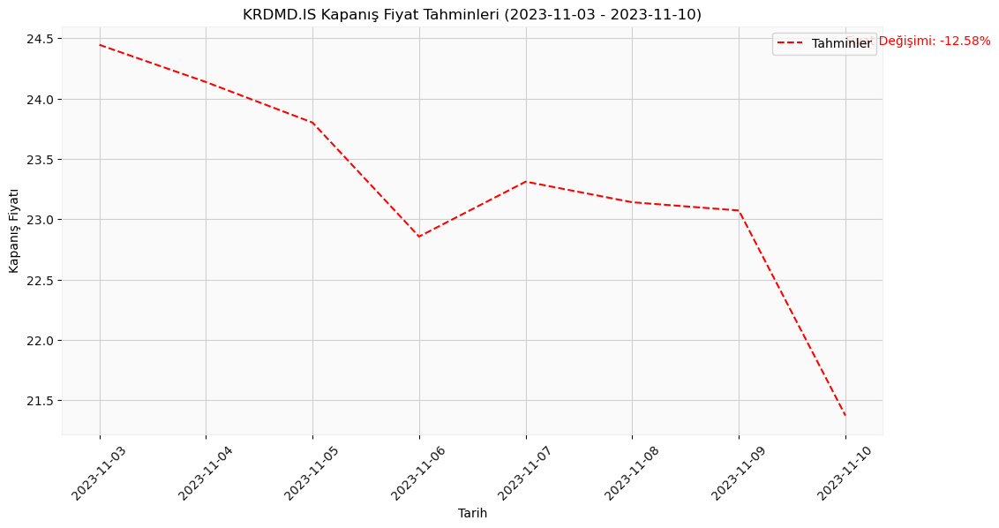

In [19]:

# Veri çekme
symbol = 'KRDMD.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - ODAS Hissesi

[*********************100%%**********************]  1 of 1 completed


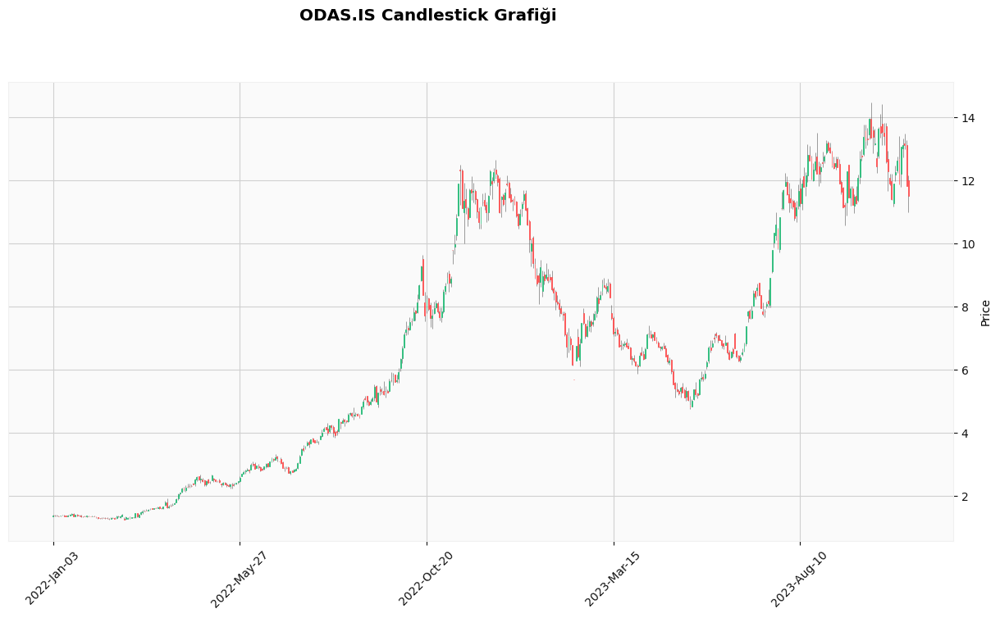

Epoch [1/100], Loss: 0.07886327058076859
Epoch [2/100], Loss: 0.05173847824335098
Epoch [3/100], Loss: 0.04043781757354736
Epoch [4/100], Loss: 0.006132904905825853
Epoch [5/100], Loss: 0.005337834823876619
Epoch [6/100], Loss: 0.003006154438480735
Epoch [7/100], Loss: 0.0026910118758678436
Epoch [8/100], Loss: 0.002628285437822342
Epoch [9/100], Loss: 0.0015217623440548778
Epoch [10/100], Loss: 0.004122366663068533
Epoch [11/100], Loss: 0.004251362290233374
Epoch [12/100], Loss: 0.0017666968051344156
Epoch [13/100], Loss: 0.0015393899520859122
Epoch [14/100], Loss: 0.0015100239543244243
Epoch [15/100], Loss: 0.001618858426809311
Epoch [16/100], Loss: 0.0006340856198221445
Epoch [17/100], Loss: 0.0022379474248737097
Epoch [18/100], Loss: 0.0006950318929739296
Epoch [19/100], Loss: 0.0017446837155148387
Epoch [20/100], Loss: 0.0010762574383988976
Epoch [21/100], Loss: 0.003997392486780882
Epoch [22/100], Loss: 0.0036844355054199696
Epoch [23/100], Loss: 0.0007828062516637146
Epoch [24/1

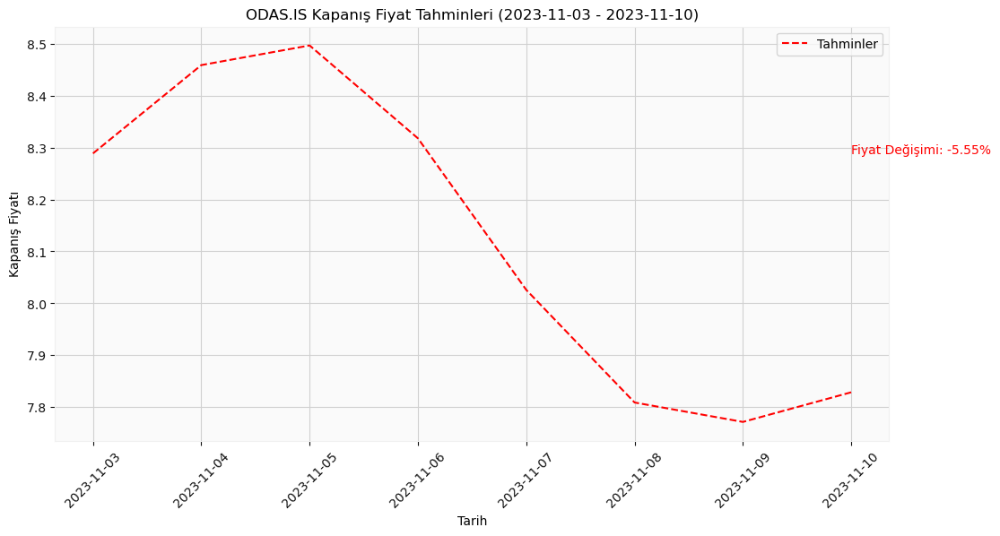

In [20]:

# Veri çekme
symbol = 'ODAS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - OYAKC Hissesi

[*********************100%%**********************]  1 of 1 completed


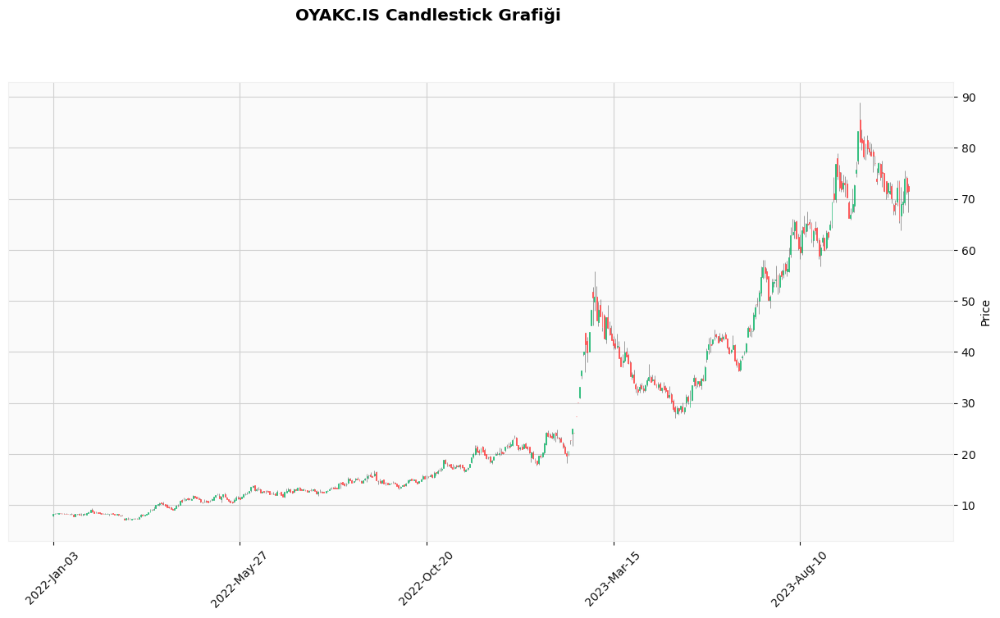

Epoch [1/100], Loss: 0.019388442859053612
Epoch [2/100], Loss: 0.02840214967727661
Epoch [3/100], Loss: 0.012689809314906597
Epoch [4/100], Loss: 0.008751609362661839
Epoch [5/100], Loss: 0.00169995310716331
Epoch [6/100], Loss: 0.0027462956495583057
Epoch [7/100], Loss: 0.0007992619648575783
Epoch [8/100], Loss: 0.002237924374639988
Epoch [9/100], Loss: 0.0016300003044307232
Epoch [10/100], Loss: 0.0032108845189213753
Epoch [11/100], Loss: 0.0030306302942335606
Epoch [12/100], Loss: 0.0008604039903730154
Epoch [13/100], Loss: 0.0007522489759139717
Epoch [14/100], Loss: 0.0012118726735934615
Epoch [15/100], Loss: 0.00394977955147624
Epoch [16/100], Loss: 0.0012874520616605878
Epoch [17/100], Loss: 0.0011163711315020919
Epoch [18/100], Loss: 0.0008179759024642408
Epoch [19/100], Loss: 0.0009418031550012529
Epoch [20/100], Loss: 0.0013575487537309527
Epoch [21/100], Loss: 0.0006949965027160943
Epoch [22/100], Loss: 0.0008627772331237793
Epoch [23/100], Loss: 0.0005637938738800585
Epoch [

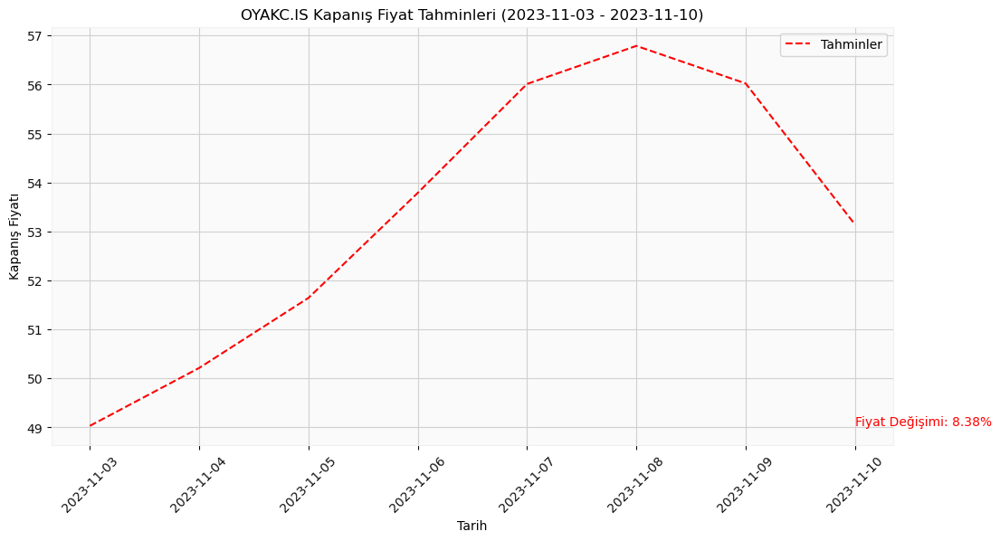

In [21]:

# Veri çekme
symbol = 'OYAKC.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - PETKM Hissesi

[*********************100%%**********************]  1 of 1 completed


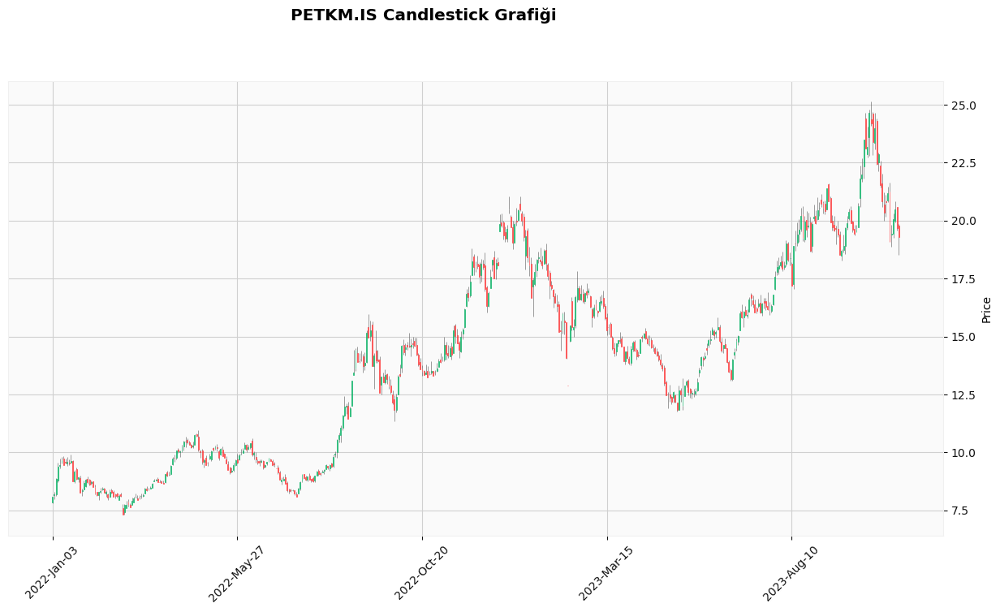

Epoch [1/100], Loss: 0.02648734301328659
Epoch [2/100], Loss: 0.025942571461200714
Epoch [3/100], Loss: 0.05574040487408638
Epoch [4/100], Loss: 0.028842035681009293
Epoch [5/100], Loss: 0.014599582180380821
Epoch [6/100], Loss: 0.005516876000910997
Epoch [7/100], Loss: 0.005358572583645582
Epoch [8/100], Loss: 0.0030435172375291586
Epoch [9/100], Loss: 0.0038315928541123867
Epoch [10/100], Loss: 0.0030916864052414894
Epoch [11/100], Loss: 0.0026252649258822203
Epoch [12/100], Loss: 0.003966924734413624
Epoch [13/100], Loss: 0.0032183697912842035
Epoch [14/100], Loss: 0.0038116939831525087
Epoch [15/100], Loss: 0.00218535796739161
Epoch [16/100], Loss: 0.0012887235498055816
Epoch [17/100], Loss: 0.0043345424346625805
Epoch [18/100], Loss: 0.0020863765385001898
Epoch [19/100], Loss: 0.0011597431730479002
Epoch [20/100], Loss: 0.0038329127710312605
Epoch [21/100], Loss: 0.005942611489444971
Epoch [22/100], Loss: 0.002961566438898444
Epoch [23/100], Loss: 0.0031677375081926584
Epoch [24/1

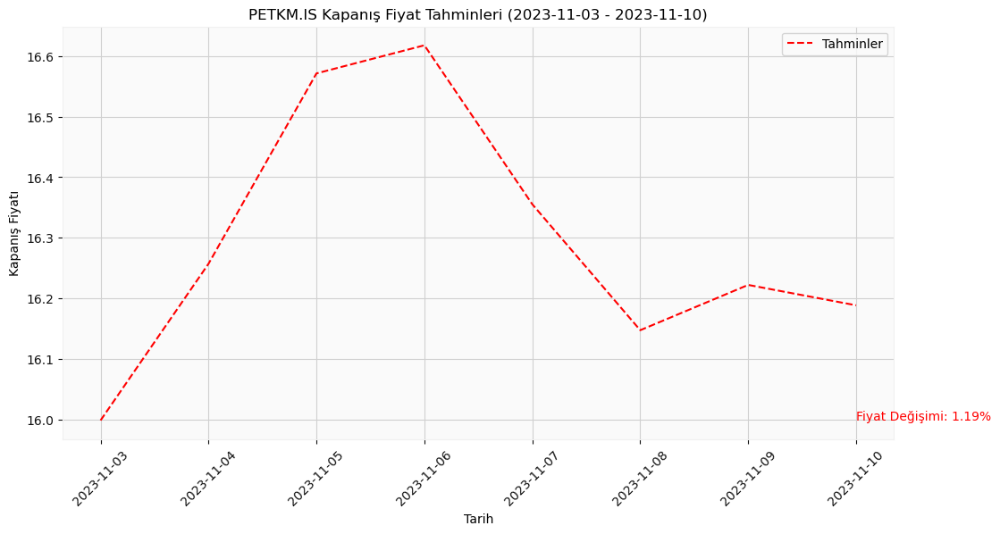

In [22]:

# Veri çekme
symbol = 'PETKM.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - PGSUS Hissesi

[*********************100%%**********************]  1 of 1 completed


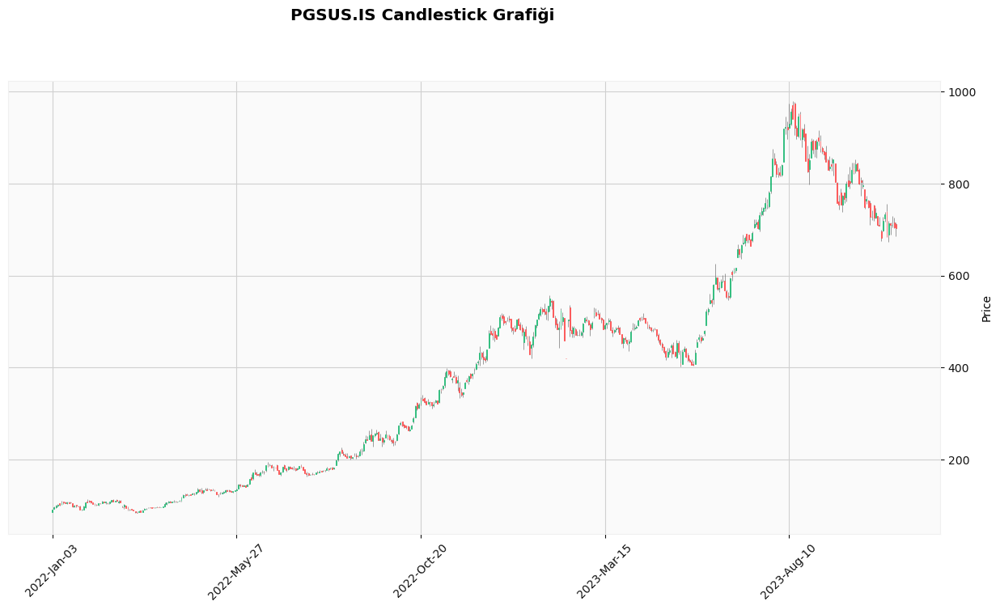

Epoch [1/100], Loss: 0.0415995828807354
Epoch [2/100], Loss: 0.03328339010477066
Epoch [3/100], Loss: 0.019599029794335365
Epoch [4/100], Loss: 0.02914605103433132
Epoch [5/100], Loss: 0.0019520270870998502
Epoch [6/100], Loss: 0.0015749965095892549
Epoch [7/100], Loss: 0.0025059098843485117
Epoch [8/100], Loss: 0.0008972363430075347
Epoch [9/100], Loss: 0.0015297101344913244
Epoch [10/100], Loss: 0.0007293054950423539
Epoch [11/100], Loss: 0.0014310121769085526
Epoch [12/100], Loss: 0.00037403160240501165
Epoch [13/100], Loss: 0.0016805233899503946
Epoch [14/100], Loss: 0.0012639083433896303
Epoch [15/100], Loss: 0.0011124677257612348
Epoch [16/100], Loss: 0.000747907324694097
Epoch [17/100], Loss: 0.0009330551256425679
Epoch [18/100], Loss: 0.0006087564979679883
Epoch [19/100], Loss: 0.0009400523849762976
Epoch [20/100], Loss: 0.0006015697144903243
Epoch [21/100], Loss: 0.0007933292654342949
Epoch [22/100], Loss: 0.0016516867326572537
Epoch [23/100], Loss: 0.0005837726057507098
Epoch

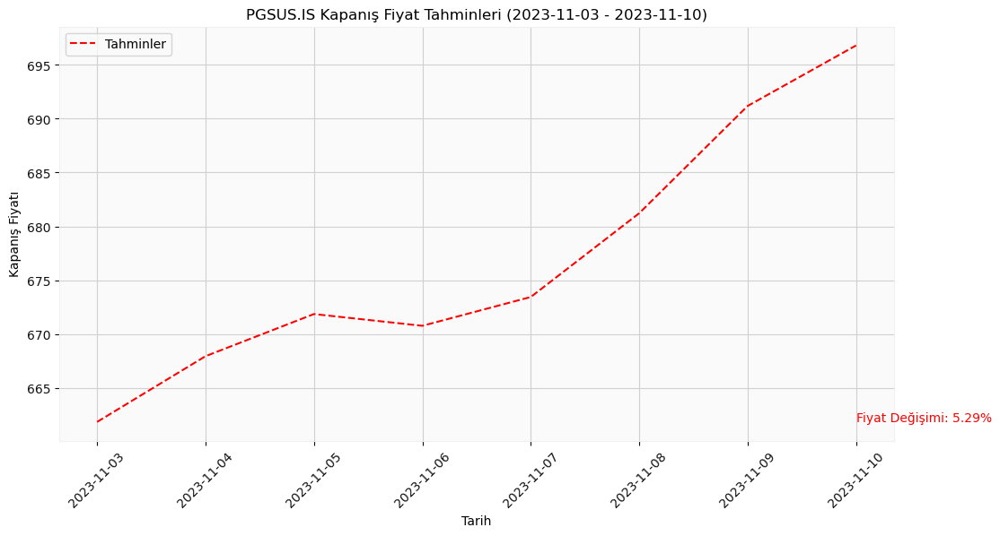

In [23]:

# Veri çekme
symbol = 'PGSUS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - SAHOL Hissesi

[*********************100%%**********************]  1 of 1 completed


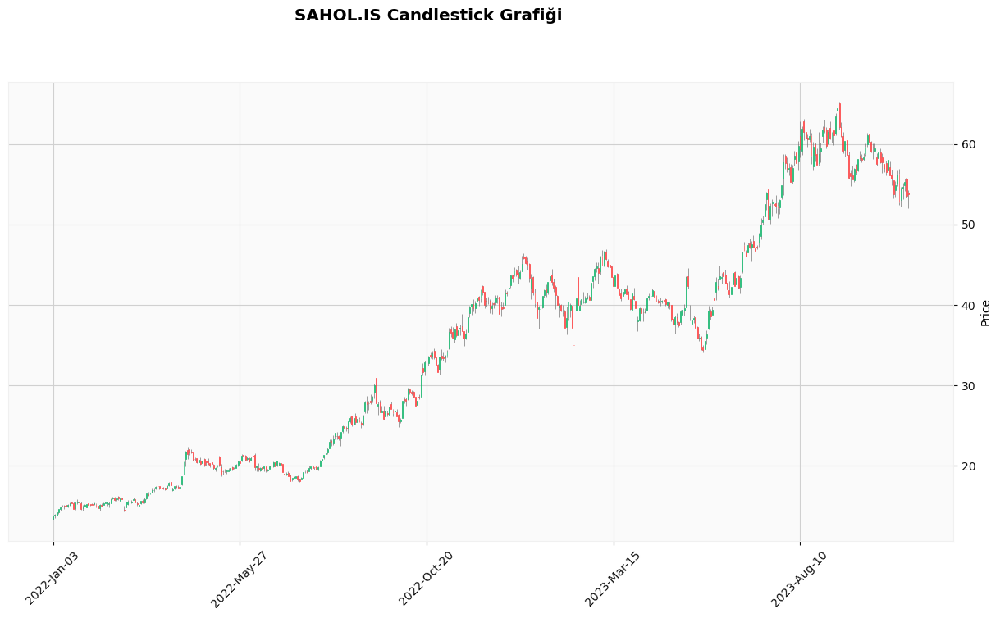

Epoch [1/100], Loss: 0.05005032569169998
Epoch [2/100], Loss: 0.039834775030612946
Epoch [3/100], Loss: 0.02995198778808117
Epoch [4/100], Loss: 0.006762261036783457
Epoch [5/100], Loss: 0.004960454534739256
Epoch [6/100], Loss: 0.0026437912601977587
Epoch [7/100], Loss: 0.002087959786877036
Epoch [8/100], Loss: 0.0008536459063179791
Epoch [9/100], Loss: 0.0019717635586857796
Epoch [10/100], Loss: 0.0013625085121020675
Epoch [11/100], Loss: 0.0005015293136239052
Epoch [12/100], Loss: 0.001508441288024187
Epoch [13/100], Loss: 0.001187870861031115
Epoch [14/100], Loss: 0.0022243447601795197
Epoch [15/100], Loss: 0.0012178235920146108
Epoch [16/100], Loss: 0.0016591900493949652
Epoch [17/100], Loss: 0.00057232566177845
Epoch [18/100], Loss: 0.0008779341005720198
Epoch [19/100], Loss: 0.000780704605858773
Epoch [20/100], Loss: 0.0023084073327481747
Epoch [21/100], Loss: 0.0008487736922688782
Epoch [22/100], Loss: 0.001166085246950388
Epoch [23/100], Loss: 0.0007677817484363914
Epoch [24/1

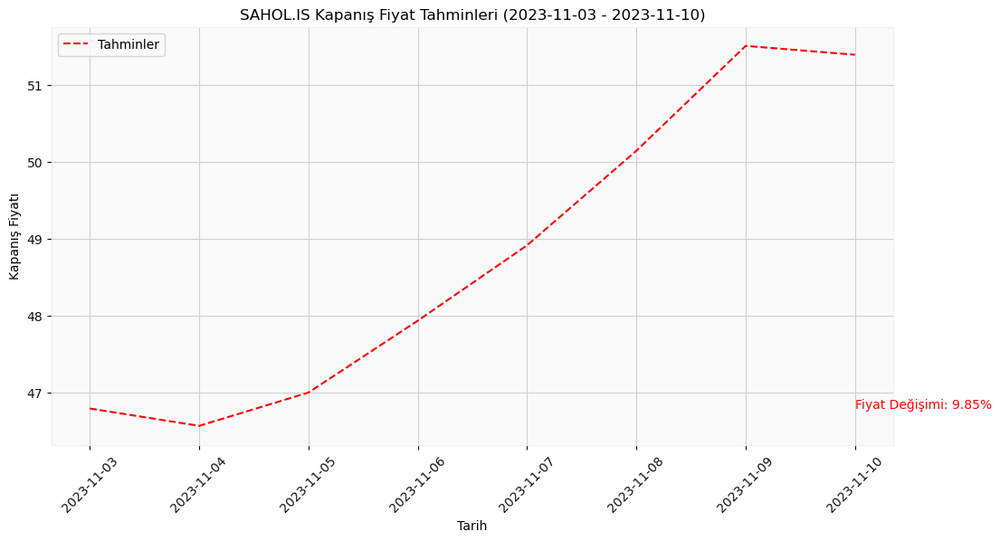

In [24]:

# Veri çekme
symbol = 'SAHOL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - SASA Hissesi

[*********************100%%**********************]  1 of 1 completed


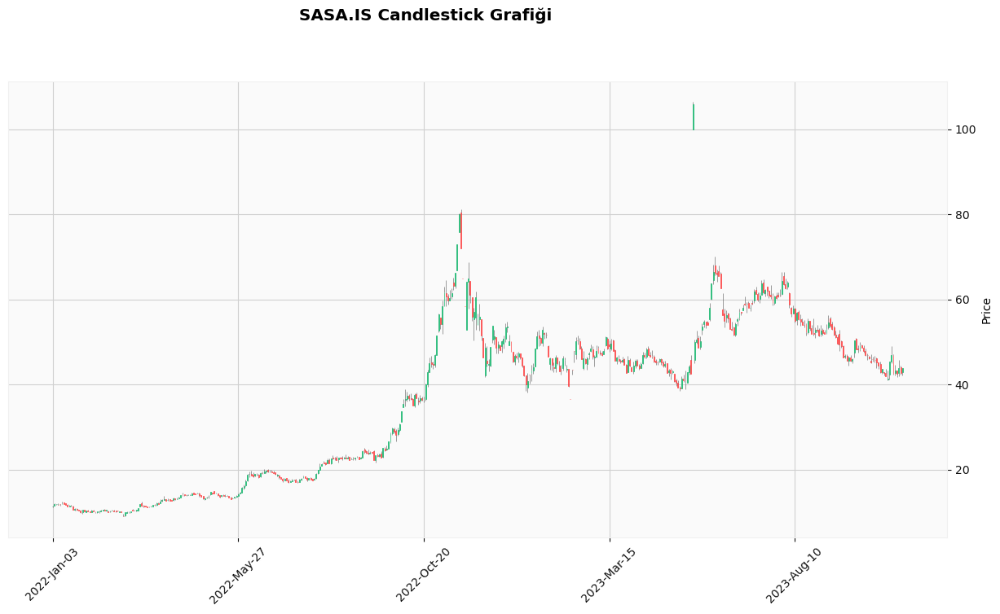

Epoch [1/100], Loss: 0.02526007406413555
Epoch [2/100], Loss: 0.036795515567064285
Epoch [3/100], Loss: 0.012414468452334404
Epoch [4/100], Loss: 0.03492291644215584
Epoch [5/100], Loss: 0.002577997511252761
Epoch [6/100], Loss: 0.004996833857148886
Epoch [7/100], Loss: 0.0035689459182322025
Epoch [8/100], Loss: 0.0012970466632395983
Epoch [9/100], Loss: 0.0014238381991162896
Epoch [10/100], Loss: 0.00134555553086102
Epoch [11/100], Loss: 0.0020754255820065737
Epoch [12/100], Loss: 0.0007540352526120842
Epoch [13/100], Loss: 0.002040410879999399
Epoch [14/100], Loss: 0.001537915552034974
Epoch [15/100], Loss: 0.0017635688418522477
Epoch [16/100], Loss: 0.0018748833099380136
Epoch [17/100], Loss: 0.0017774211009964347
Epoch [18/100], Loss: 0.0012800133554264903
Epoch [19/100], Loss: 0.0005448673036880791
Epoch [20/100], Loss: 0.0017585176974534988
Epoch [21/100], Loss: 0.0008127532782964408
Epoch [22/100], Loss: 0.001067974022589624
Epoch [23/100], Loss: 0.0005840195226483047
Epoch [24/

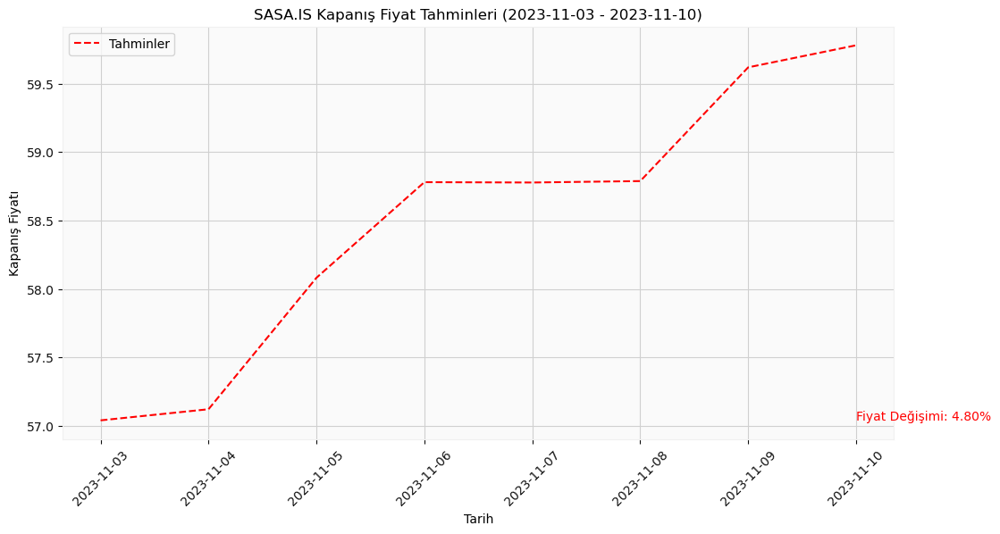

In [25]:

# Veri çekme
symbol = 'SASA.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - SISE Hissesi

[*********************100%%**********************]  1 of 1 completed


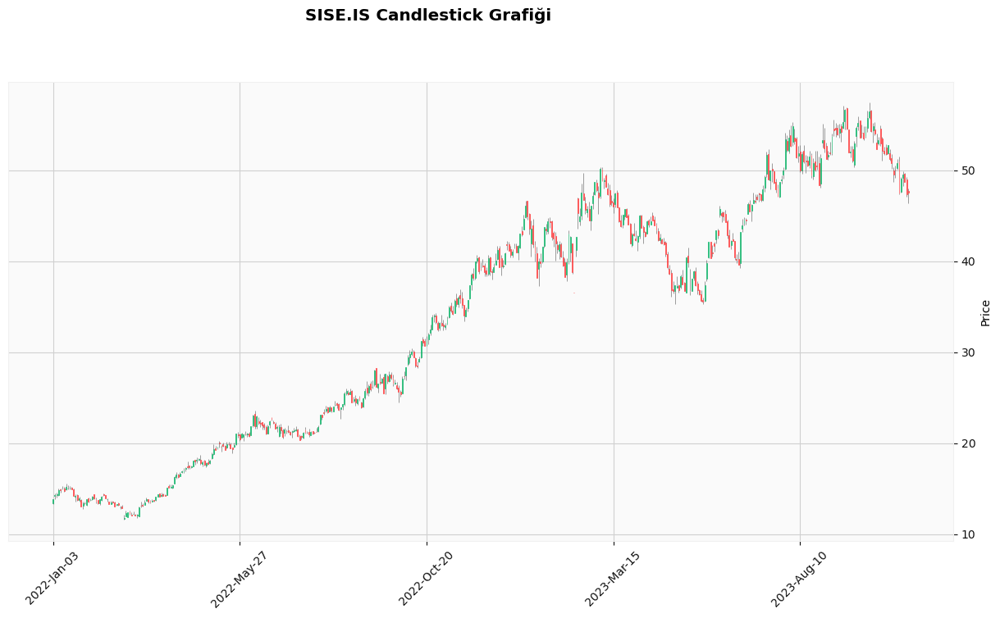

Epoch [1/100], Loss: 0.06365008652210236
Epoch [2/100], Loss: 0.03461473435163498
Epoch [3/100], Loss: 0.030788270756602287
Epoch [4/100], Loss: 0.007266589906066656
Epoch [5/100], Loss: 0.005043195094913244
Epoch [6/100], Loss: 0.004236004780977964
Epoch [7/100], Loss: 0.0035821511410176754
Epoch [8/100], Loss: 0.002773899817839265
Epoch [9/100], Loss: 0.0011848914436995983
Epoch [10/100], Loss: 0.0006810612394474447
Epoch [11/100], Loss: 0.001137995277531445
Epoch [12/100], Loss: 0.002503305906429887
Epoch [13/100], Loss: 0.0005990607896819711
Epoch [14/100], Loss: 0.0017362128710374236
Epoch [15/100], Loss: 0.0007136535132303834
Epoch [16/100], Loss: 0.002017413266003132
Epoch [17/100], Loss: 0.0014739293837919831
Epoch [18/100], Loss: 0.0010212691267952323
Epoch [19/100], Loss: 0.0013929700944572687
Epoch [20/100], Loss: 0.0012897918932139874
Epoch [21/100], Loss: 0.0003819806734099984
Epoch [22/100], Loss: 0.000532922160346061
Epoch [23/100], Loss: 0.0009796343510970473
Epoch [24/

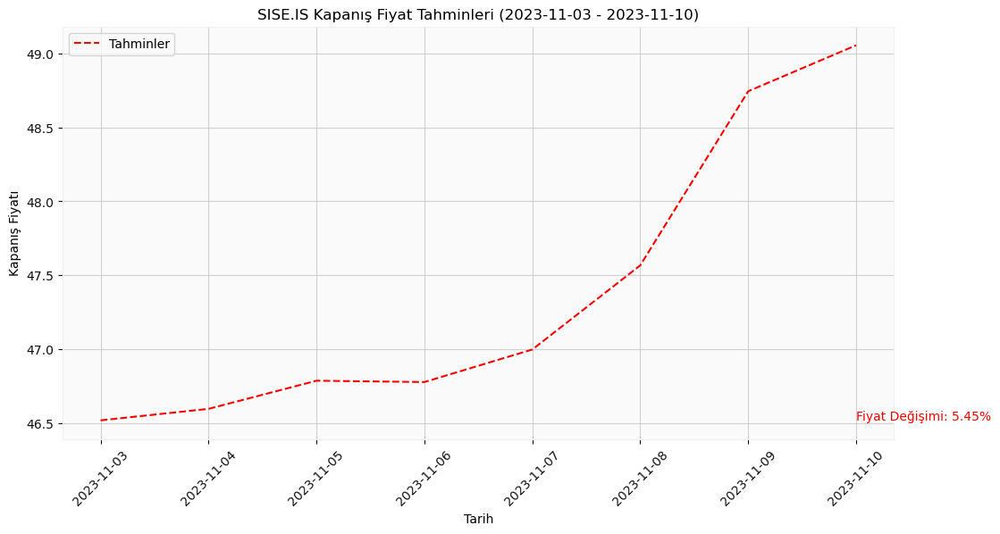

In [26]:

# Veri çekme
symbol = 'SISE.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - TCELL Hissesi

[*********************100%%**********************]  1 of 1 completed


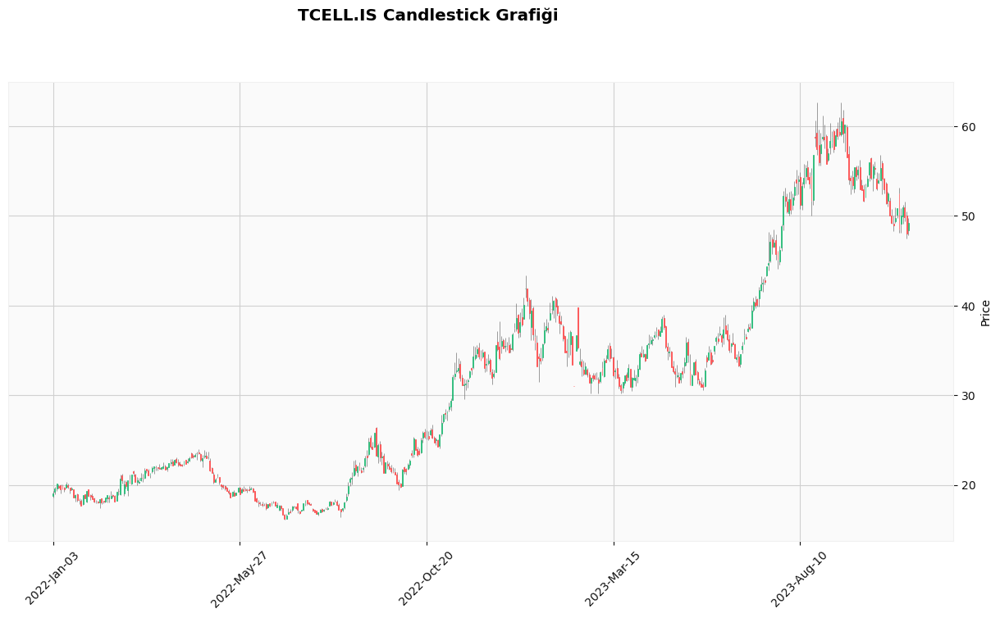

Epoch [1/100], Loss: 0.02780926041305065
Epoch [2/100], Loss: 0.02221955917775631
Epoch [3/100], Loss: 0.013798248022794724
Epoch [4/100], Loss: 0.0025294958613812923
Epoch [5/100], Loss: 0.0020881416276097298
Epoch [6/100], Loss: 0.0013235403457656503
Epoch [7/100], Loss: 0.002077848417684436
Epoch [8/100], Loss: 0.0014581256546080112
Epoch [9/100], Loss: 0.0005206092027947307
Epoch [10/100], Loss: 0.0012505227932706475
Epoch [11/100], Loss: 0.0015042921295389533
Epoch [12/100], Loss: 0.0015492549864575267
Epoch [13/100], Loss: 0.0013032909482717514
Epoch [14/100], Loss: 0.0013348582433536649
Epoch [15/100], Loss: 0.0013322297018021345
Epoch [16/100], Loss: 0.0017878731014207006
Epoch [17/100], Loss: 0.0011103164870291948
Epoch [18/100], Loss: 0.0026376431342214346
Epoch [19/100], Loss: 0.0025409781374037266
Epoch [20/100], Loss: 0.001964710419997573
Epoch [21/100], Loss: 0.001296026399359107
Epoch [22/100], Loss: 0.0013956768671050668
Epoch [23/100], Loss: 0.0023648033384233713
Epoch

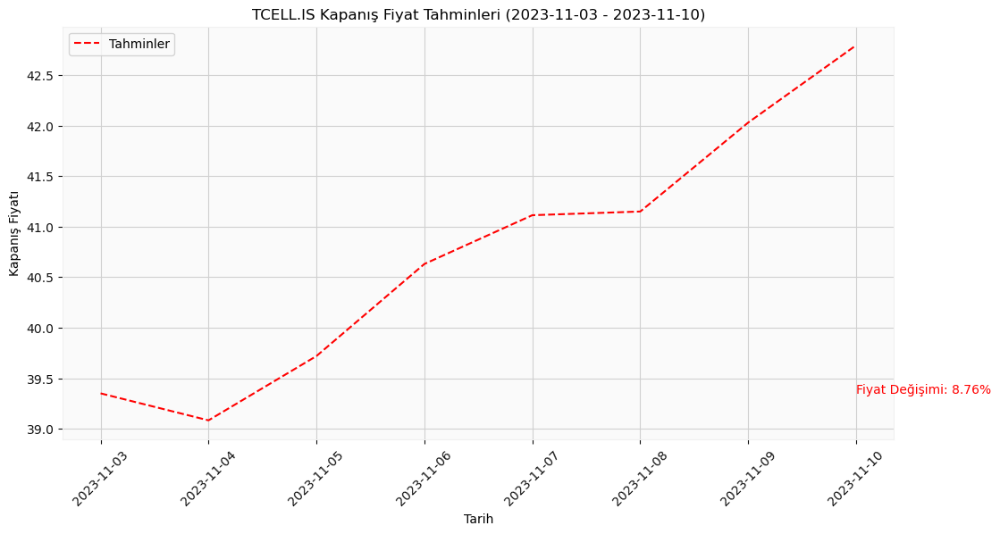

In [27]:

# Veri çekme
symbol = 'TCELL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - THYAO Hissesi

[*********************100%%**********************]  1 of 1 completed


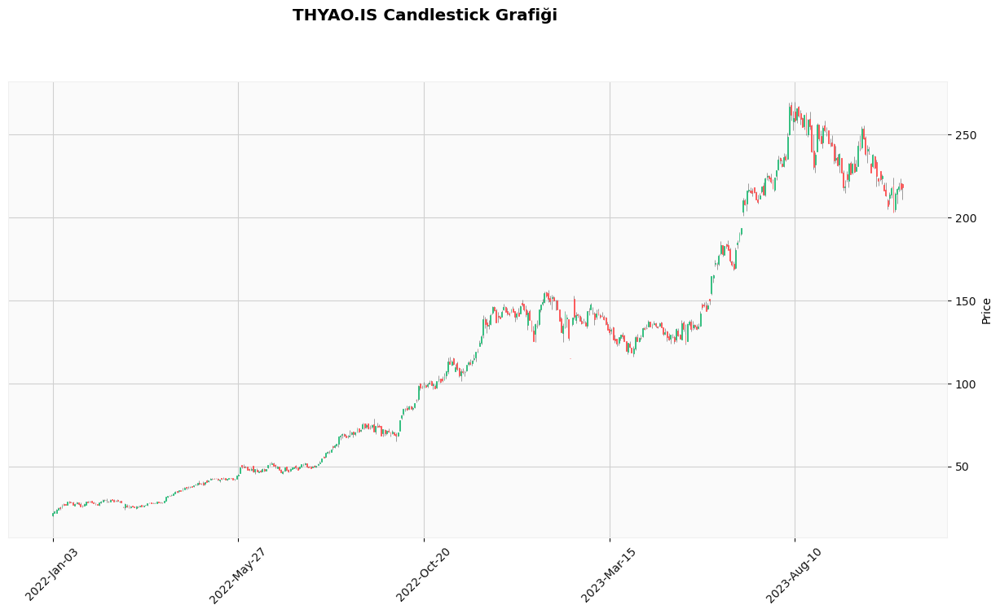

Epoch [1/100], Loss: 0.05574127659201622
Epoch [2/100], Loss: 0.033629659563302994
Epoch [3/100], Loss: 0.02495517022907734
Epoch [4/100], Loss: 0.016419271007180214
Epoch [5/100], Loss: 0.011532877571880817
Epoch [6/100], Loss: 0.0035893144086003304
Epoch [7/100], Loss: 0.0005813862080685794
Epoch [8/100], Loss: 0.0016188211739063263
Epoch [9/100], Loss: 0.0009858112316578627
Epoch [10/100], Loss: 0.0009157854365184903
Epoch [11/100], Loss: 0.000646211497951299
Epoch [12/100], Loss: 0.002422007964923978
Epoch [13/100], Loss: 0.0008232883992604911
Epoch [14/100], Loss: 0.0016677099047228694
Epoch [15/100], Loss: 0.0011542456923052669
Epoch [16/100], Loss: 0.0014942660927772522
Epoch [17/100], Loss: 0.0006274671759456396
Epoch [18/100], Loss: 0.0013846766669303179
Epoch [19/100], Loss: 0.0016821910394355655
Epoch [20/100], Loss: 0.0015096112620085478
Epoch [21/100], Loss: 0.0004912574077025056
Epoch [22/100], Loss: 0.0006307263975031674
Epoch [23/100], Loss: 0.0010771224042400718
Epoch 

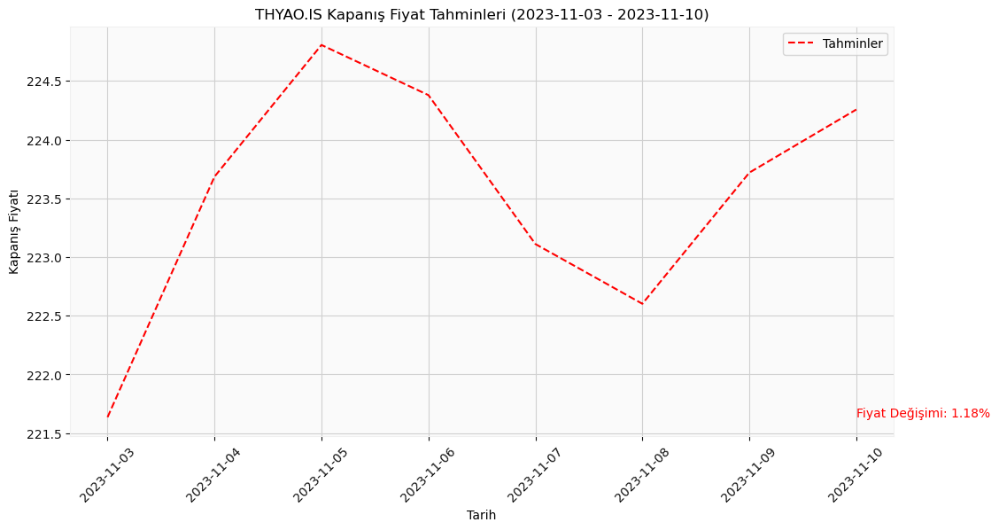

In [28]:

# Veri çekme
symbol = 'THYAO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - TOASO Hissesi

[*********************100%%**********************]  1 of 1 completed


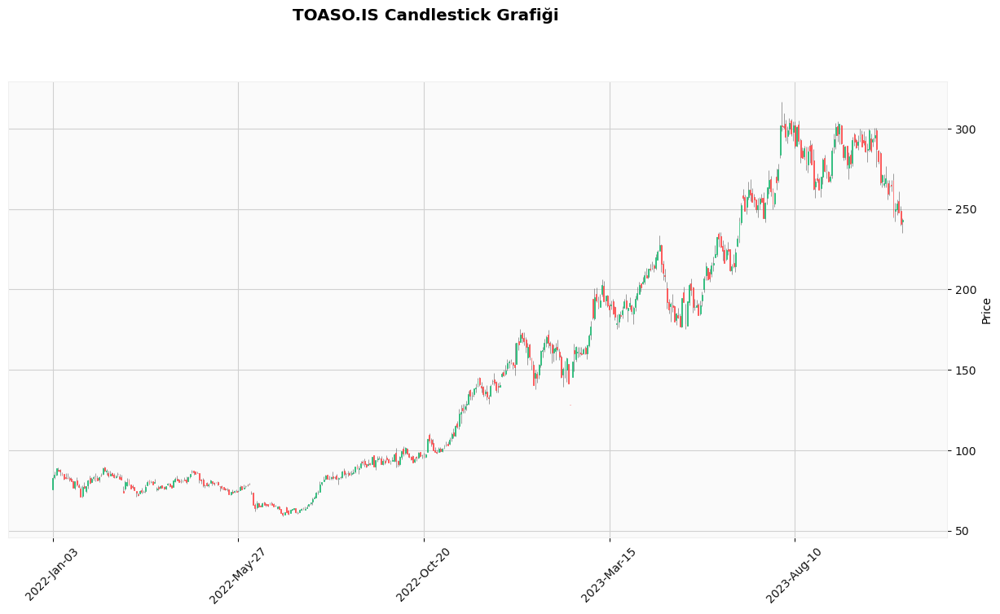

Epoch [1/100], Loss: 0.05155421420931816
Epoch [2/100], Loss: 0.02104894444346428
Epoch [3/100], Loss: 0.004510271828621626
Epoch [4/100], Loss: 0.0029890581499785185
Epoch [5/100], Loss: 0.001771352021023631
Epoch [6/100], Loss: 0.0013517399784177542
Epoch [7/100], Loss: 0.0017281192122027278
Epoch [8/100], Loss: 0.000839703599922359
Epoch [9/100], Loss: 0.0012470100773498416
Epoch [10/100], Loss: 0.0016808664659038186
Epoch [11/100], Loss: 0.0010673110373318195
Epoch [12/100], Loss: 0.0013133320026099682
Epoch [13/100], Loss: 0.0010551525047048926
Epoch [14/100], Loss: 0.0003495755372568965
Epoch [15/100], Loss: 0.0004965804982930422
Epoch [16/100], Loss: 0.002385310595855117
Epoch [17/100], Loss: 0.0004556269268505275
Epoch [18/100], Loss: 0.001578230643644929
Epoch [19/100], Loss: 0.0014316763263195753
Epoch [20/100], Loss: 0.0008064872235991061
Epoch [21/100], Loss: 0.0009126936784014106
Epoch [22/100], Loss: 0.0011336380848661065
Epoch [23/100], Loss: 0.0017178019043058157
Epoch 

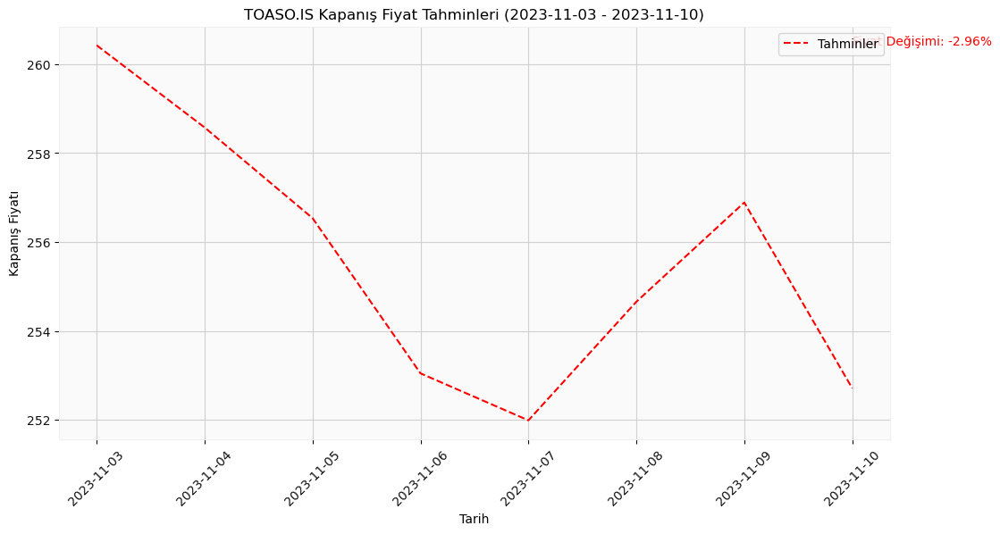

In [29]:

# Veri çekme
symbol = 'TOASO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - TUPRS Hissesi

[*********************100%%**********************]  1 of 1 completed


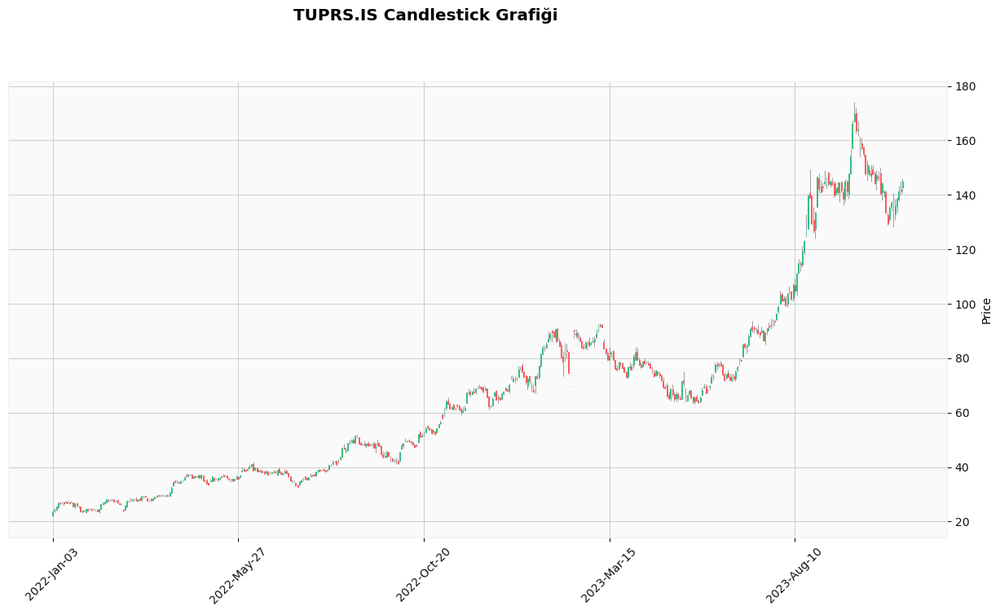

Epoch [1/100], Loss: 0.012286861427128315
Epoch [2/100], Loss: 0.01708832010626793
Epoch [3/100], Loss: 0.017283953726291656
Epoch [4/100], Loss: 0.014852788299322128
Epoch [5/100], Loss: 0.008208037354052067
Epoch [6/100], Loss: 0.0020140521228313446
Epoch [7/100], Loss: 0.002386045176535845
Epoch [8/100], Loss: 0.0012482968159019947
Epoch [9/100], Loss: 0.0009110165410675108
Epoch [10/100], Loss: 0.0004622937412932515
Epoch [11/100], Loss: 0.0010316839907318354
Epoch [12/100], Loss: 0.0008927771123126149
Epoch [13/100], Loss: 0.00045434440835379064
Epoch [14/100], Loss: 0.0005117914988659322
Epoch [15/100], Loss: 0.0014589338097721338
Epoch [16/100], Loss: 0.0011399893555790186
Epoch [17/100], Loss: 0.000807150558102876
Epoch [18/100], Loss: 0.0008309630211442709
Epoch [19/100], Loss: 0.00033204624196514487
Epoch [20/100], Loss: 0.0006362315616570413
Epoch [21/100], Loss: 0.0006005951436236501
Epoch [22/100], Loss: 0.0008060542168095708
Epoch [23/100], Loss: 0.0009616262395866215
Epo

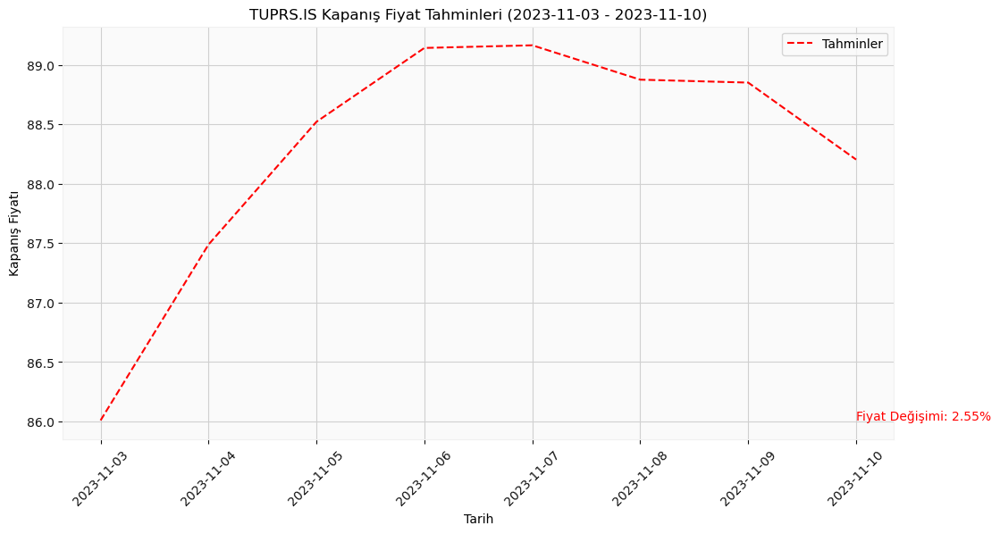

In [30]:

# Veri çekme
symbol = 'TUPRS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## PyTorch LSTM - YKBNK Hissesi

[*********************100%%**********************]  1 of 1 completed


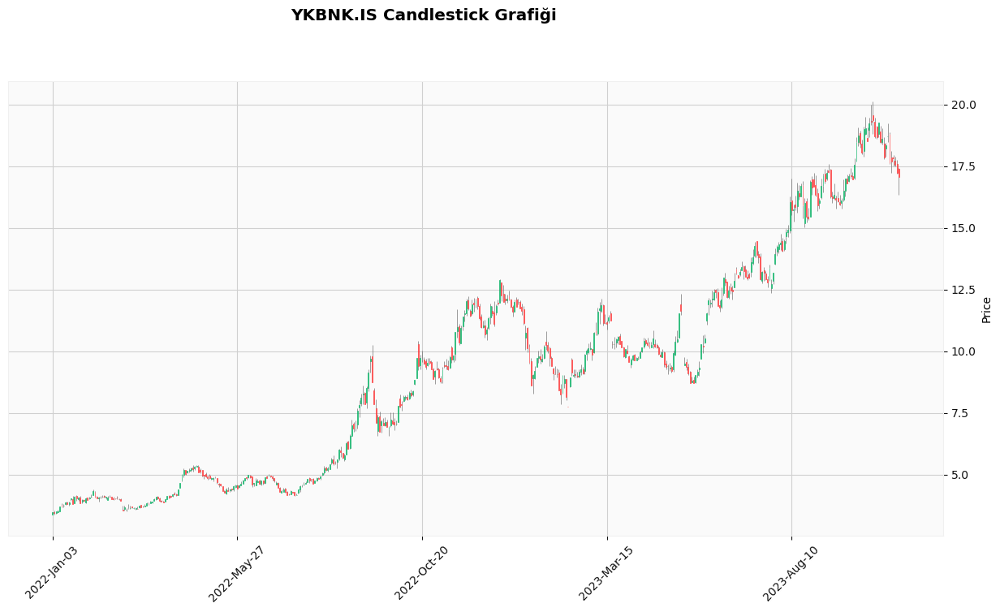

Epoch [1/100], Loss: 0.03279295936226845
Epoch [2/100], Loss: 0.028776558116078377
Epoch [3/100], Loss: 0.01517305988818407
Epoch [4/100], Loss: 0.004062044434249401
Epoch [5/100], Loss: 0.0034439635928720236
Epoch [6/100], Loss: 0.0036319021601229906
Epoch [7/100], Loss: 0.0006579036707989872
Epoch [8/100], Loss: 0.0010348758660256863
Epoch [9/100], Loss: 0.0028626283165067434
Epoch [10/100], Loss: 0.003573833266273141
Epoch [11/100], Loss: 0.0028545409440994263
Epoch [12/100], Loss: 0.0025445036590099335
Epoch [13/100], Loss: 0.0038896603509783745
Epoch [14/100], Loss: 0.0031445706263184547
Epoch [15/100], Loss: 0.0018822159618139267
Epoch [16/100], Loss: 0.0018974598497152328
Epoch [17/100], Loss: 0.0004783758777193725
Epoch [18/100], Loss: 0.001465947600081563
Epoch [19/100], Loss: 0.0013151331804692745
Epoch [20/100], Loss: 0.000712633307557553
Epoch [21/100], Loss: 0.001278238371014595
Epoch [22/100], Loss: 0.0025078316684812307
Epoch [23/100], Loss: 0.001285678124986589
Epoch [2

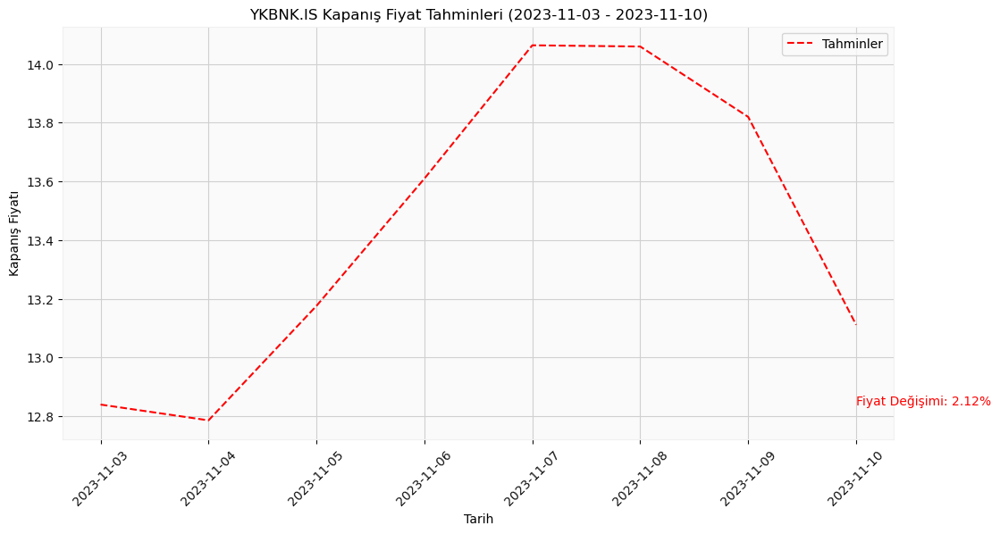

In [31]:

# Veri çekme
symbol = 'YKBNK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)
mpf.plot(data, type="candle", title=f"{symbol} Candlestick Grafiği", style="yahoo",figsize=(16, 8))

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi



data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

scaler = MinMaxScaler()
data = scaler.fit_transform(data)

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Tensorlara çevirin
X_train = torch.Tensor(X_train)
y_train = torch.Tensor(y_train)
X_test = torch.Tensor(X_test)
y_test = torch.Tensor(y_test)

# Veri kümesi ve yükleyici oluşturun
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(LSTM, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)

        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

input_size = 1
hidden_size = 64
num_layers = 2
output_size = 1

model = LSTM(input_size, hidden_size, num_layers, output_size)

# Modeli eğitin
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 100
for epoch in range(num_epochs):
    for batch_X, batch_y in train_loader:
        outputs = model(batch_X)
        optimizer.zero_grad()
        loss = criterion(outputs, batch_y)
        loss.backward()
        optimizer.step()
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Test verileri üzerinde tahminler yapın
model.eval()
y_pred = model(X_test)
y_pred = scaler.inverse_transform(y_pred.detach().numpy())
y_test = scaler.inverse_transform(y_test.numpy())

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminlerin başlangıcından başlayarak eksik tarihleri doldurun
y_pred_filled = [y_pred[0]] * start_date_index + y_pred.tolist()



# Fiyat değişimini hesaplayın
initial_price = y_pred_filled[start_date_index]
final_price = y_pred_filled[end_date_index]
price_change = [(final - initial) / initial * 100 for initial, final in zip(initial_price, final_price)]
price_change = round(price_change[0], 2)  # Yüzdeyi iki ondalık haneli yuvarlayın

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')



# Doldurulmuş tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred_filled[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Yüzde değişimi ekleyin
plt.text(formatted_dates.index('2023-11-10'), min(y_pred_filled[0]), f'Fiyat Değişimi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## CatBoost - AKBNK Hissesi

[*********************100%%**********************]  1 of 1 completed


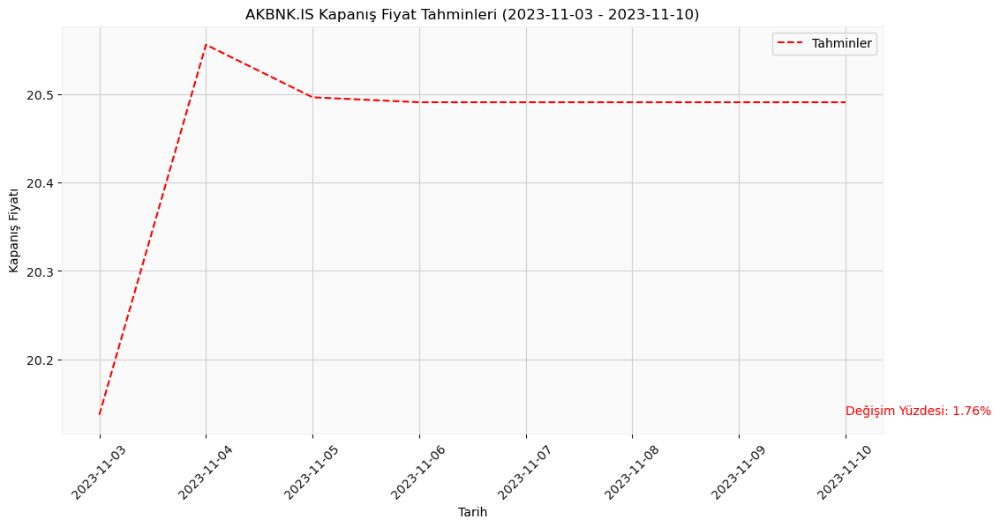

In [32]:

# Veri çekme
symbol = 'AKBNK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - ALARK Hissesi

[*********************100%%**********************]  1 of 1 completed


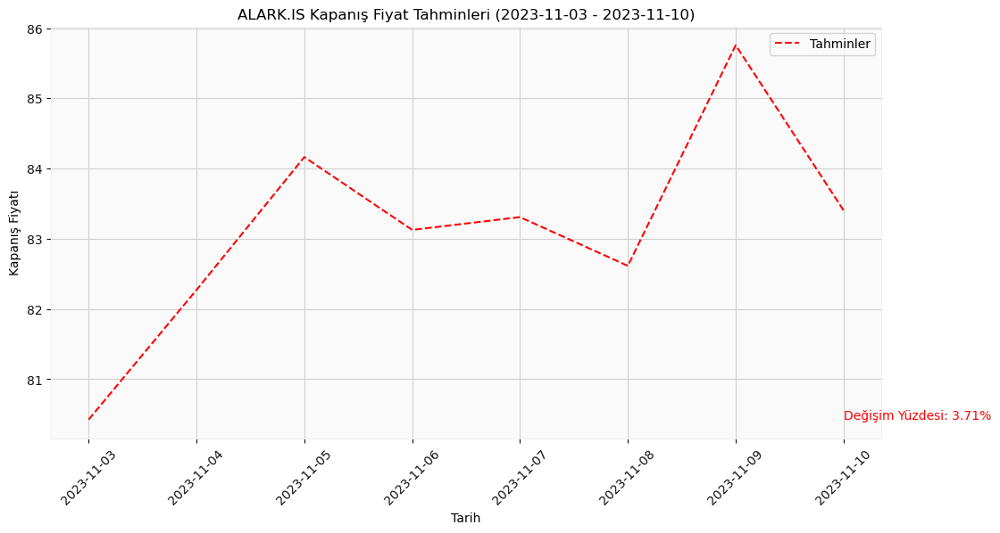

In [33]:

# Veri çekme
symbol = 'ALARK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - ARCLK Hissesi

[*********************100%%**********************]  1 of 1 completed


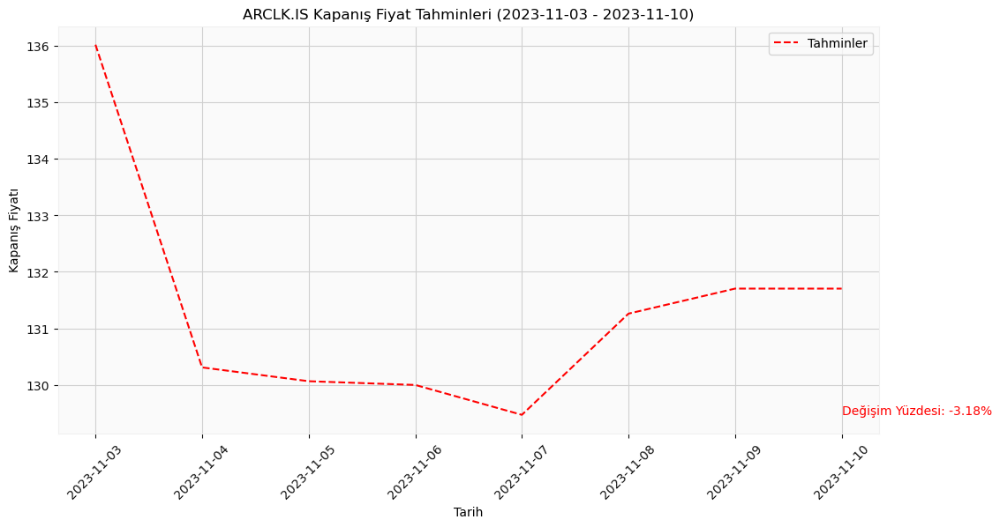

In [34]:


# Veri çekme
symbol = 'ARCLK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - ASELS Hissesi

[*********************100%%**********************]  1 of 1 completed


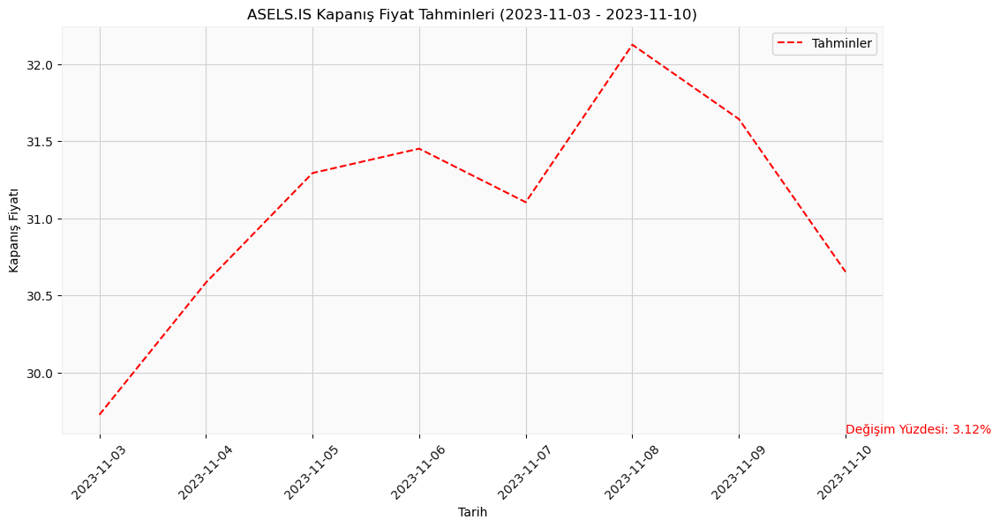

In [35]:

# Veri çekme
symbol = 'ASELS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - BIMAS Hissesi

[*********************100%%**********************]  1 of 1 completed


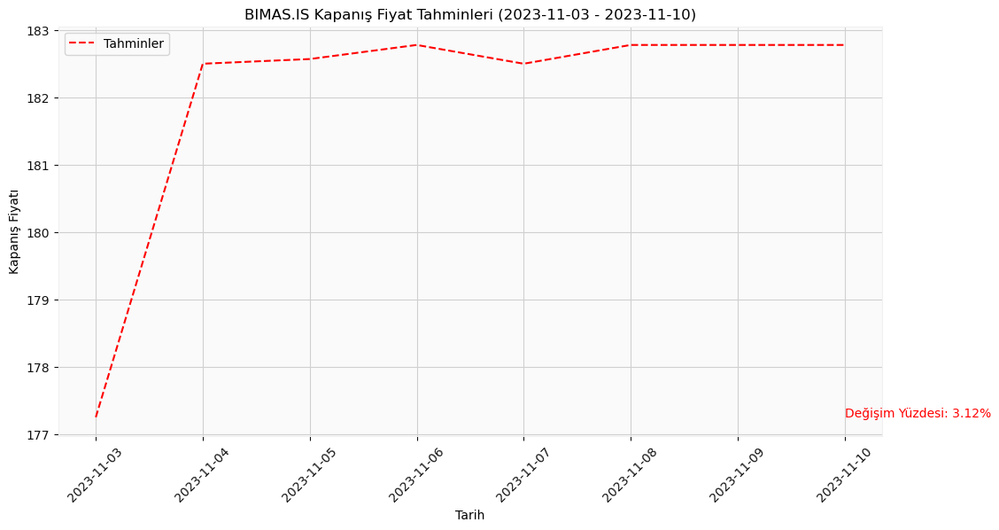

In [36]:

# Veri çekme
symbol = 'BIMAS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - EKGYO Hissesi

[*********************100%%**********************]  1 of 1 completed


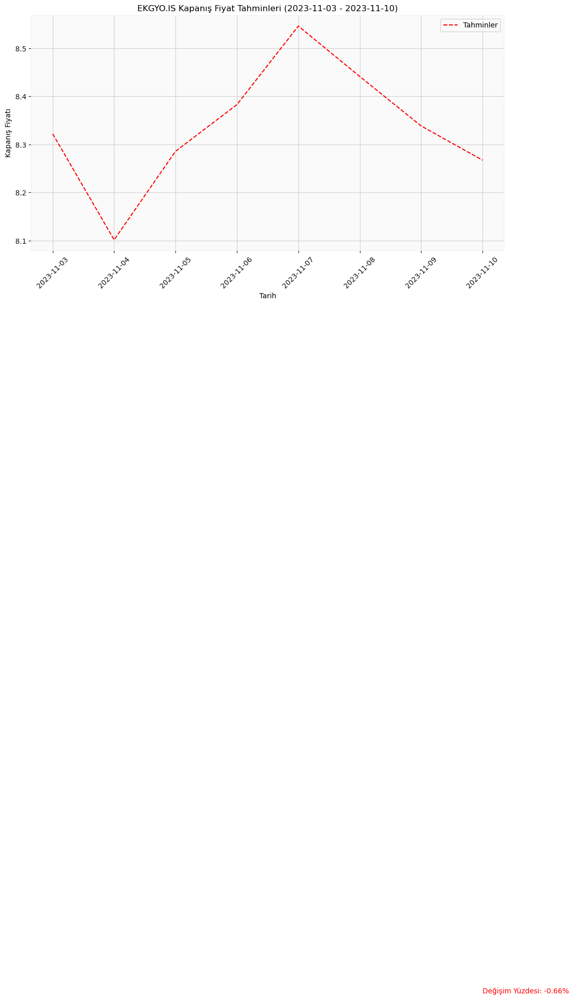

In [37]:


# Veri çekme
symbol = 'EKGYO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - ENKAI Hissesi

[*********************100%%**********************]  1 of 1 completed


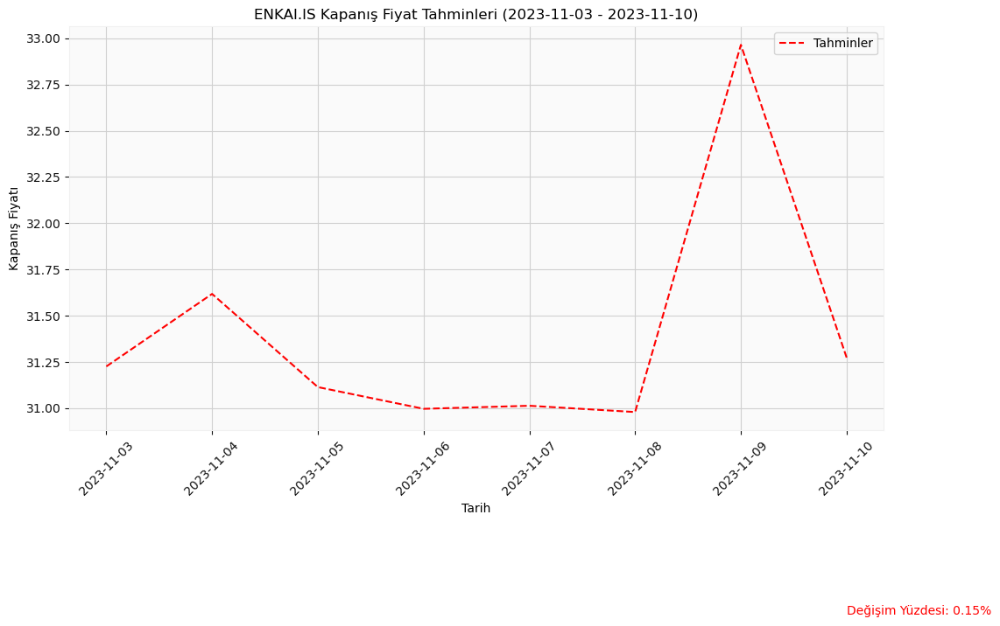

In [38]:


# Veri çekme
symbol = 'ENKAI.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - EREGL Hissesi

[*********************100%%**********************]  1 of 1 completed


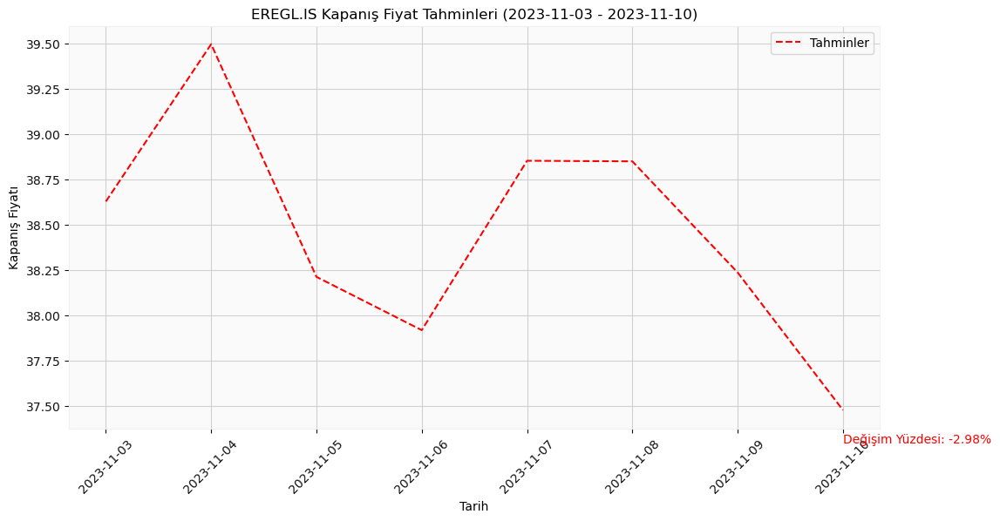

In [39]:


# Veri çekme
symbol = 'EREGL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - FROTO Hissesi

[*********************100%%**********************]  1 of 1 completed


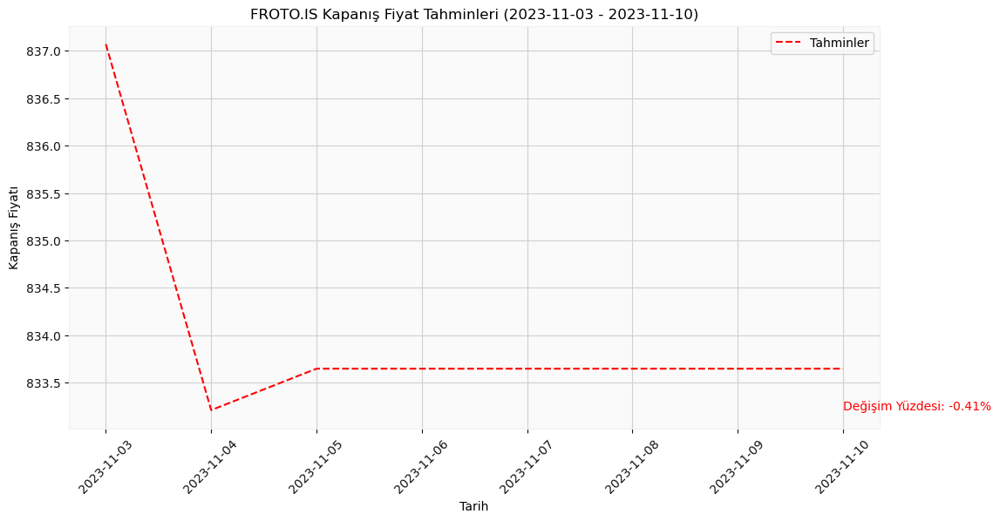

In [40]:


# Veri çekme
symbol = 'FROTO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - GARAN Hissesi

[*********************100%%**********************]  1 of 1 completed


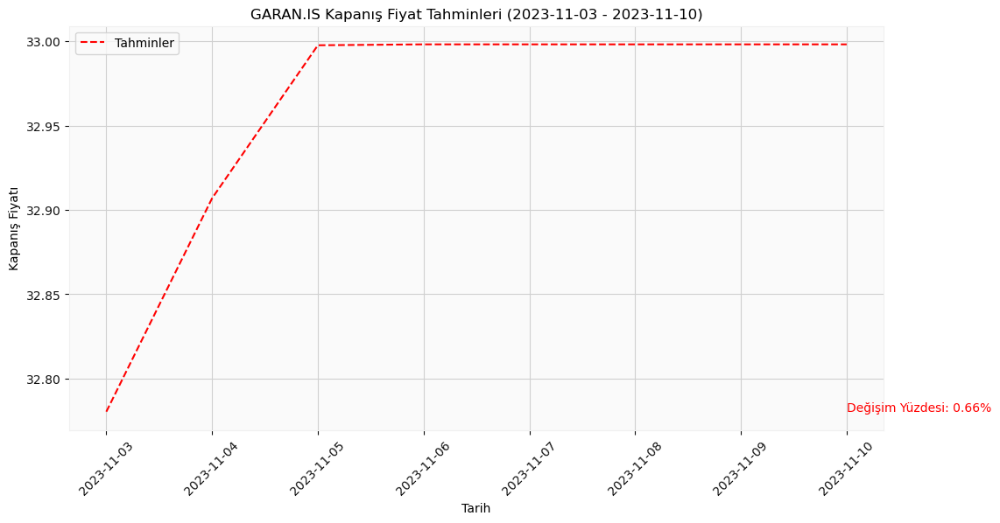

In [41]:

# Veri çekme
symbol = 'GARAN.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - GUBRF Hissesi

[*********************100%%**********************]  1 of 1 completed


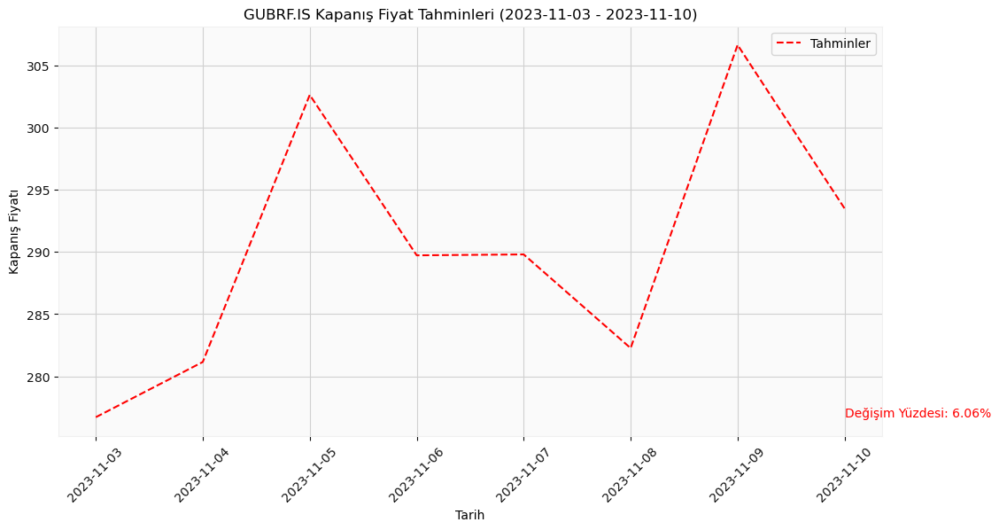

In [42]:

# Veri çekme
symbol = 'GUBRF.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - HEKTS Hissesi

[*********************100%%**********************]  1 of 1 completed


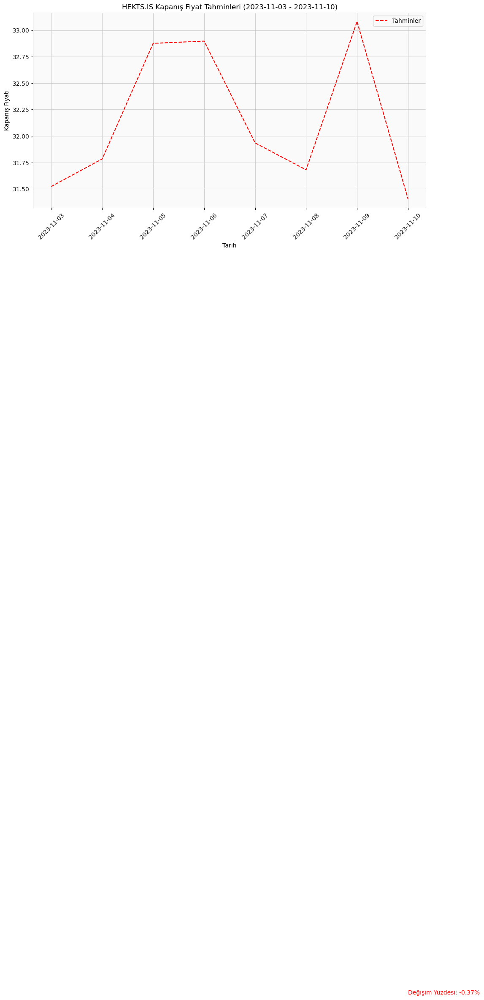

In [43]:

# Veri çekme
symbol = 'HEKTS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - ISCTR Hissesi

[*********************100%%**********************]  1 of 1 completed


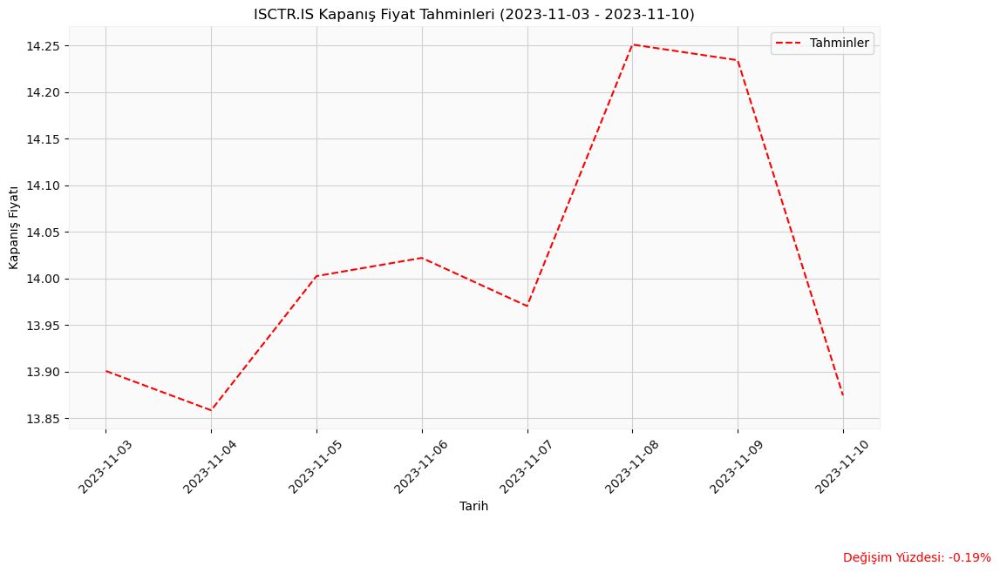

In [44]:

# Veri çekme
symbol = 'ISCTR.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - KCHOL Hissesi

[*********************100%%**********************]  1 of 1 completed


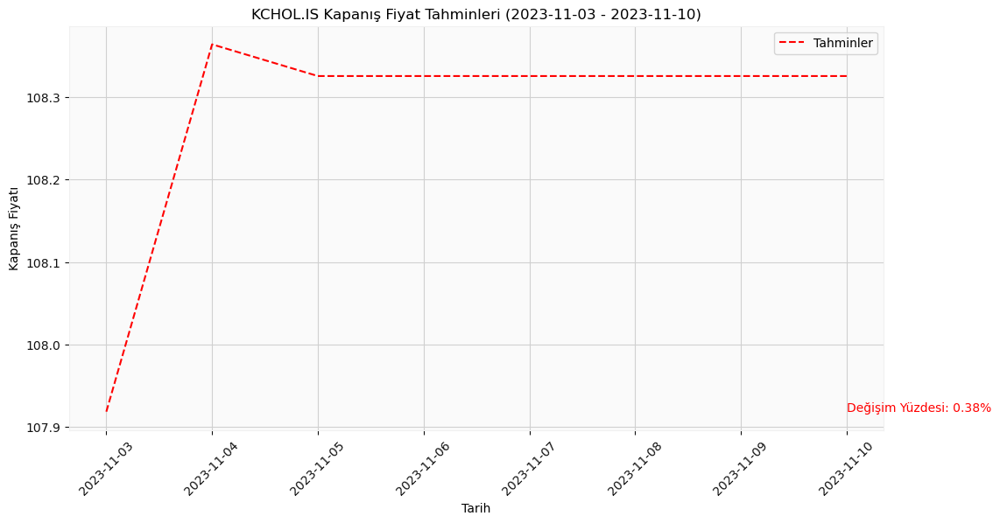

In [45]:

# Veri çekme
symbol = 'KCHOL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - KONTR Hissesi

[*********************100%%**********************]  1 of 1 completed


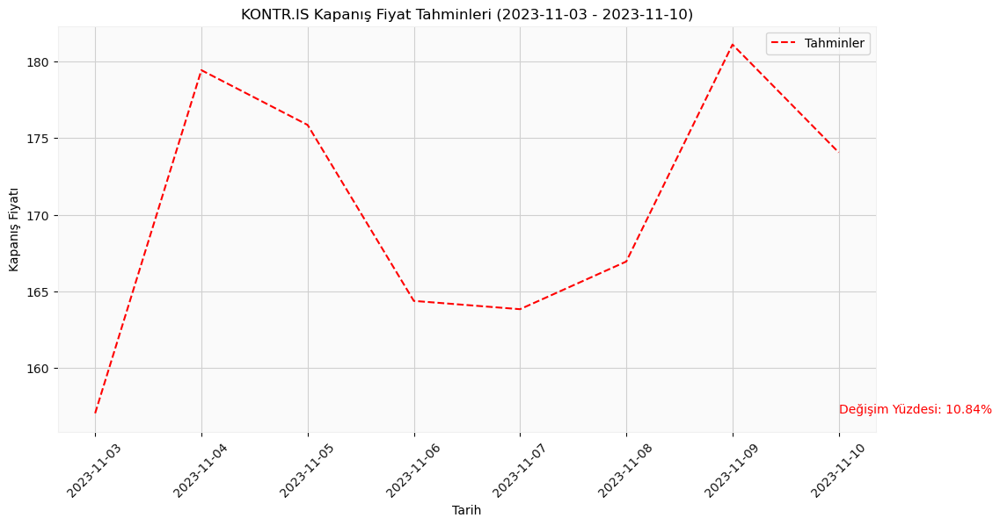

In [46]:

# Veri çekme
symbol = 'KONTR.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - KOZAL Hissesi

[*********************100%%**********************]  1 of 1 completed


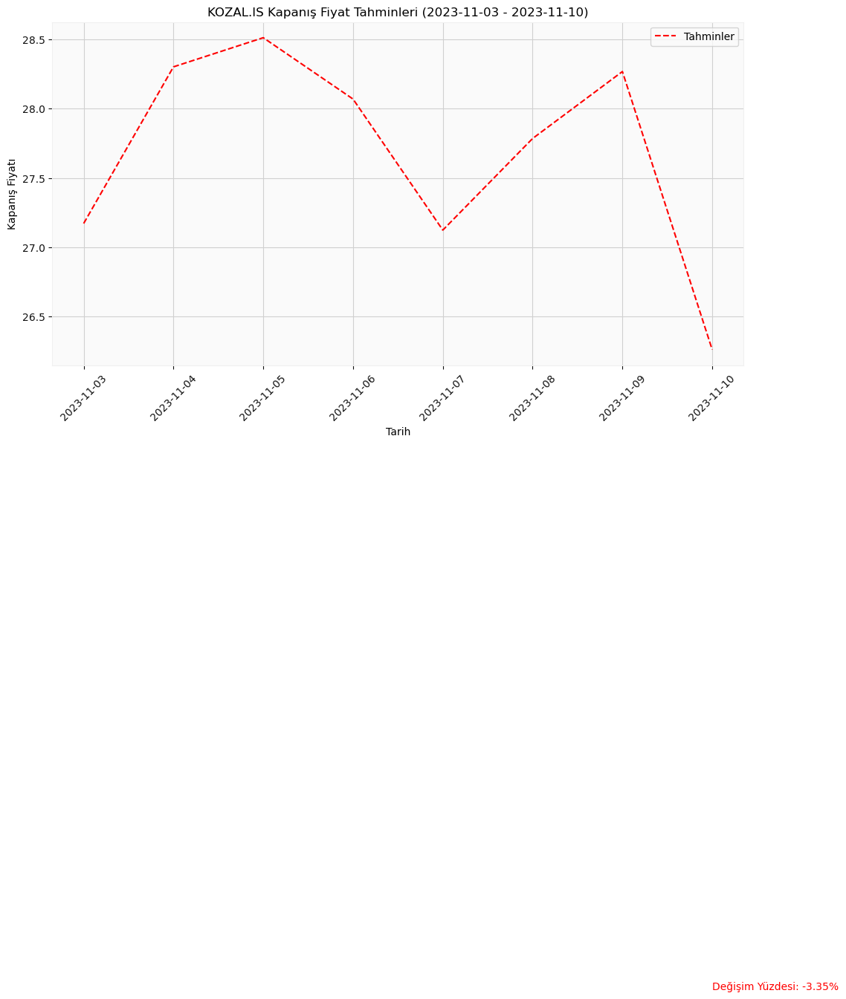

In [47]:


# Veri çekme
symbol = 'KOZAL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - KRDMD Hissesi

[*********************100%%**********************]  1 of 1 completed


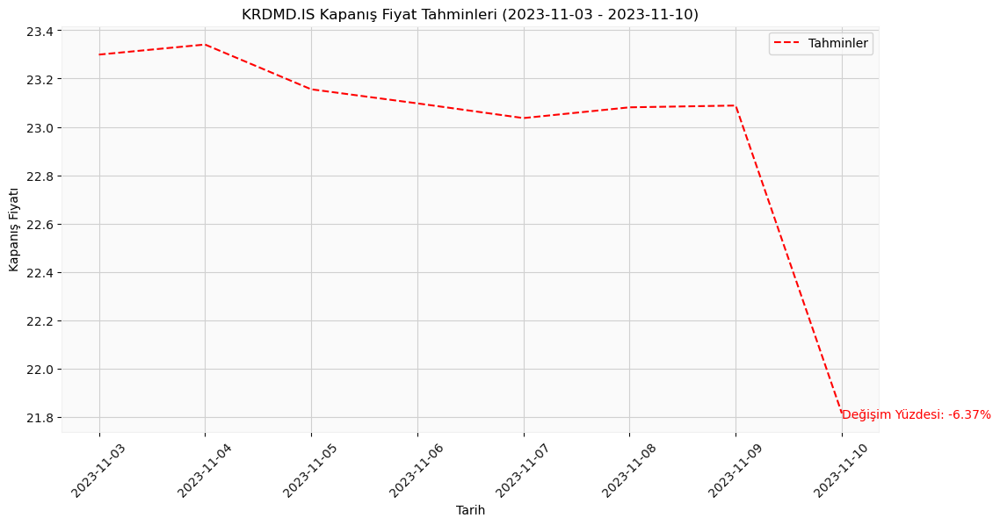

In [48]:

# Veri çekme
symbol = 'KRDMD.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - ODAS Hissesi

[*********************100%%**********************]  1 of 1 completed


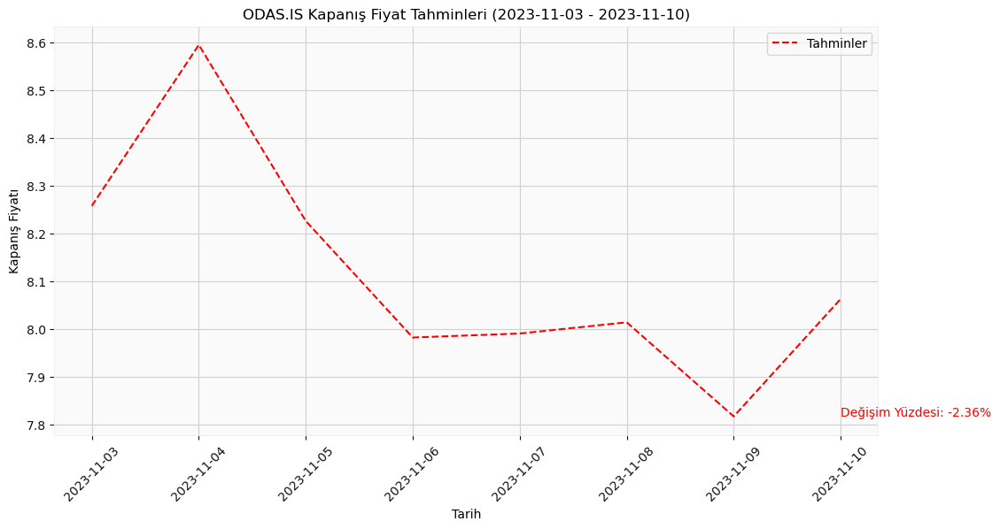

In [49]:


# Veri çekme
symbol = 'ODAS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - OYAKC Hissesi

[*********************100%%**********************]  1 of 1 completed


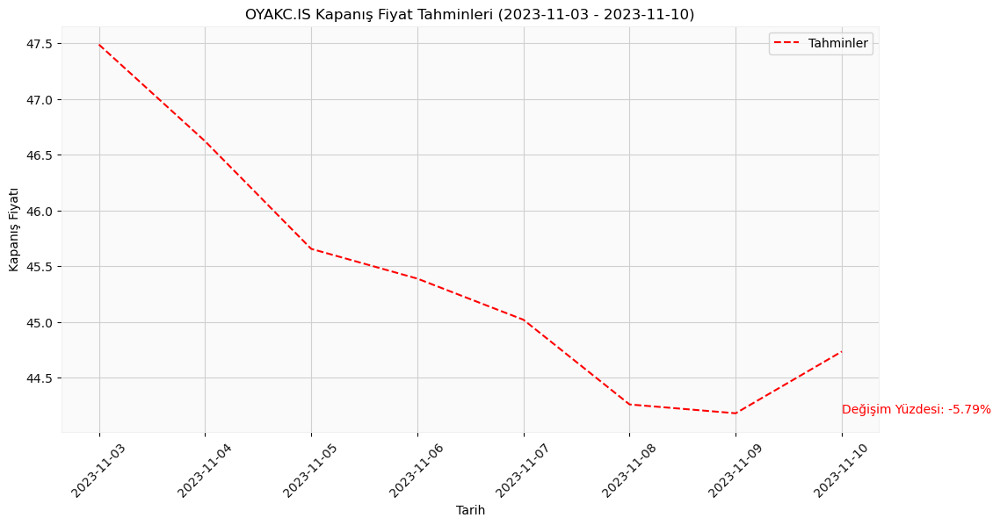

In [50]:

# Veri çekme
symbol = 'OYAKC.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - PETKM Hissesi

[*********************100%%**********************]  1 of 1 completed


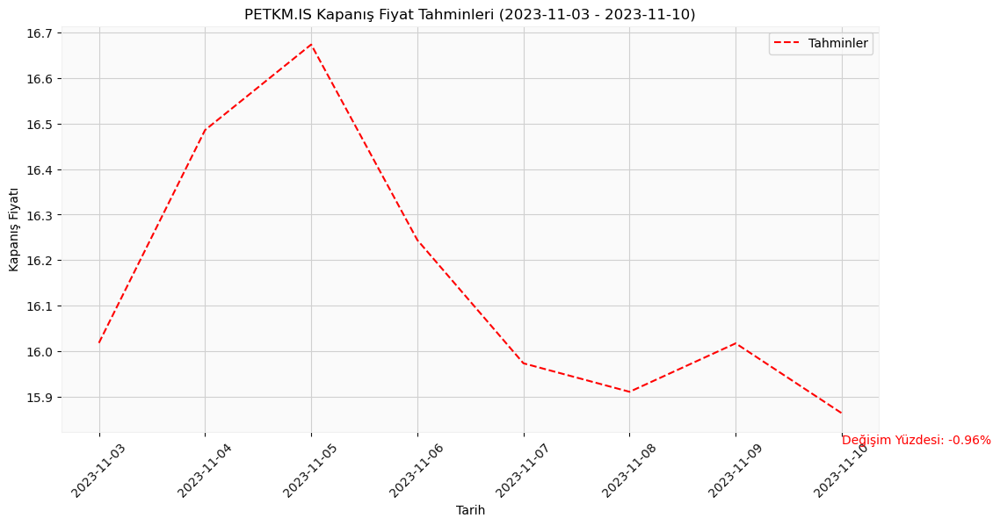

In [51]:

# Veri çekme
symbol = 'PETKM.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - PGSUS Hissesi

[*********************100%%**********************]  1 of 1 completed


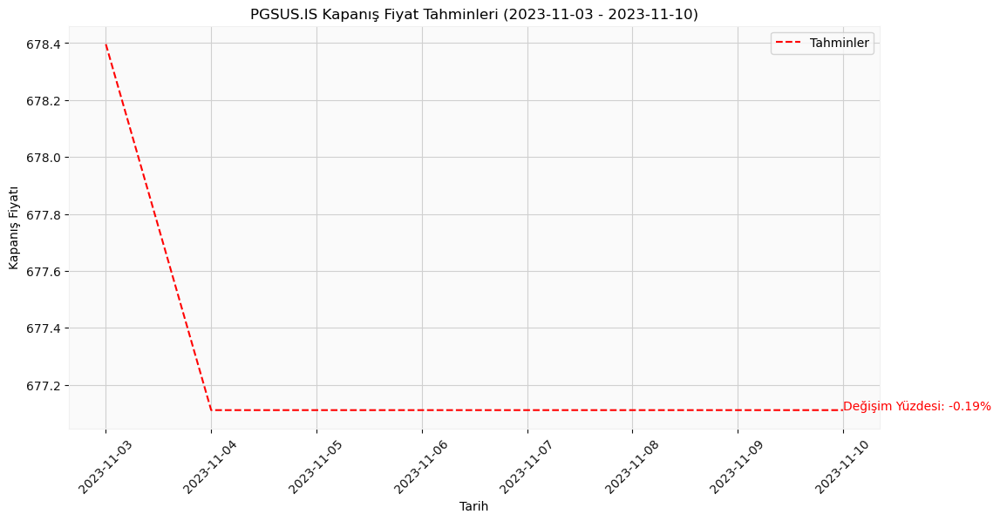

In [52]:


# Veri çekme
symbol = 'PGSUS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - SAHOL Hissesi

[*********************100%%**********************]  1 of 1 completed


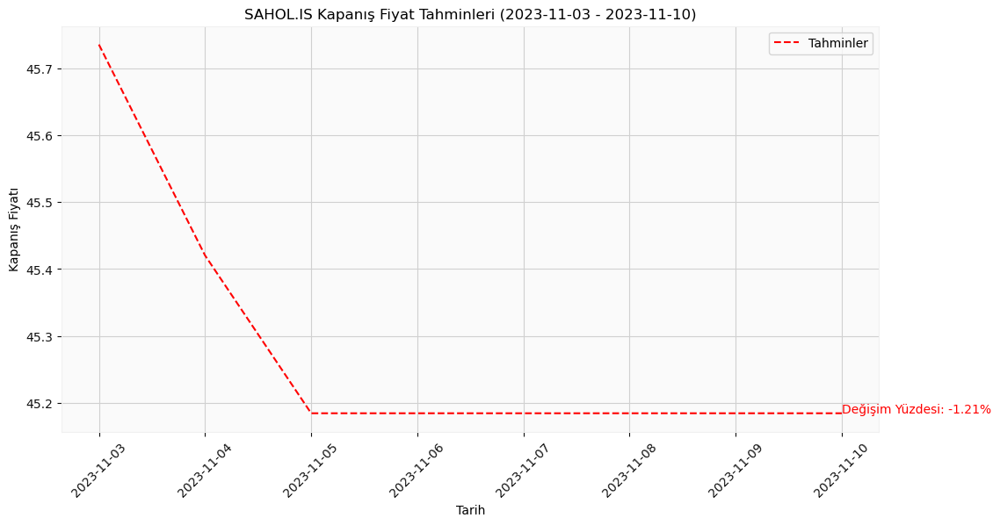

In [53]:

# Veri çekme
symbol = 'SAHOL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - SASA Hissesi

[*********************100%%**********************]  1 of 1 completed


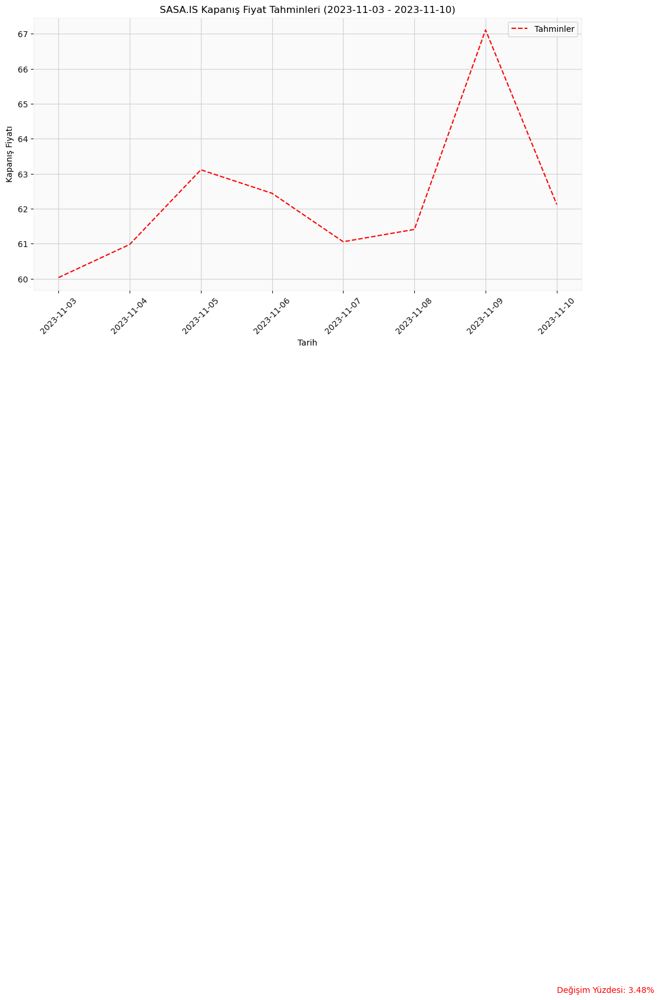

In [54]:


# Veri çekme
symbol = 'SASA.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - SISE Hissesi

[*********************100%%**********************]  1 of 1 completed


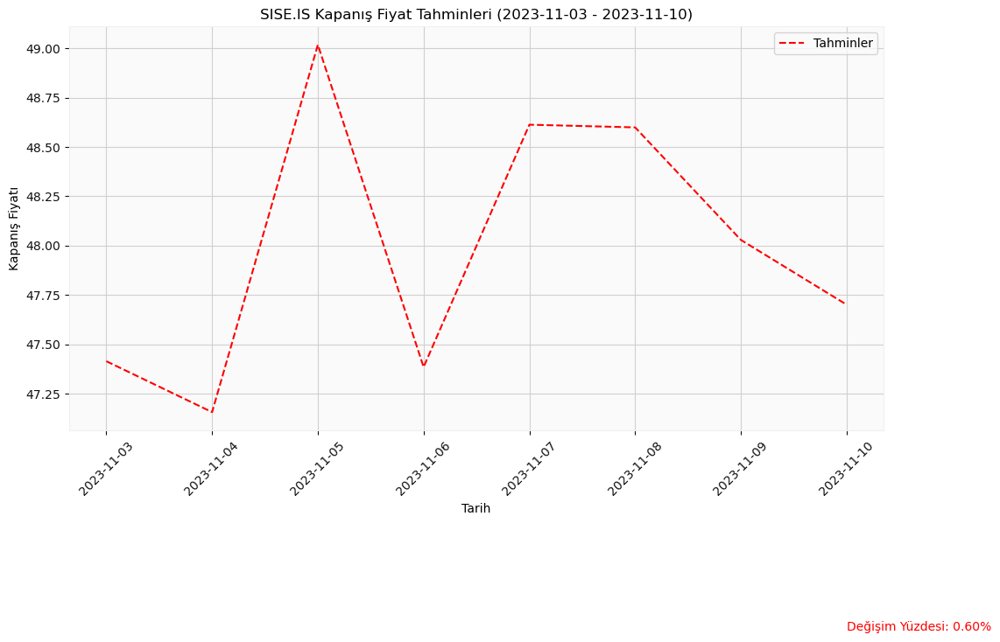

In [55]:


# Veri çekme
symbol = 'SISE.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - TCELL Hissesi

[*********************100%%**********************]  1 of 1 completed


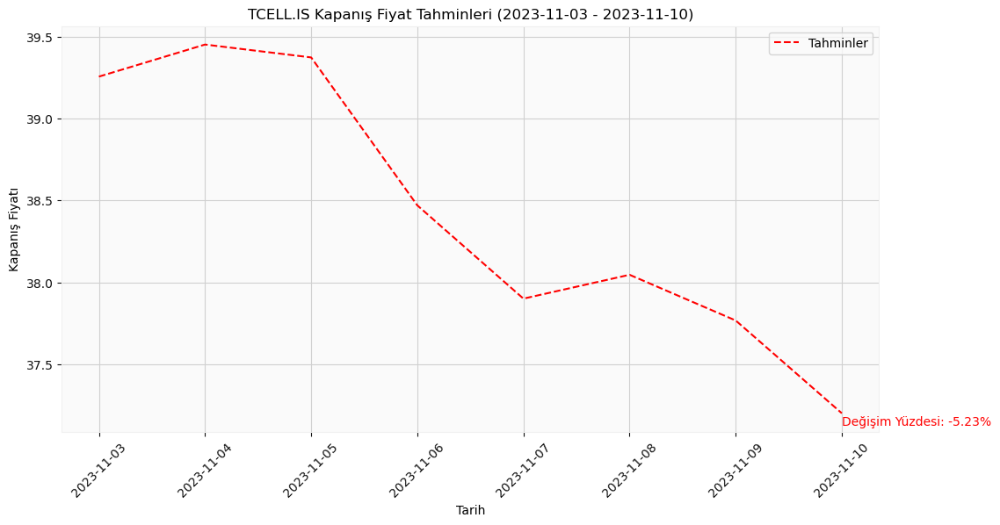

In [56]:


# Veri çekme
symbol = 'TCELL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - THYAO Hissesi

[*********************100%%**********************]  1 of 1 completed


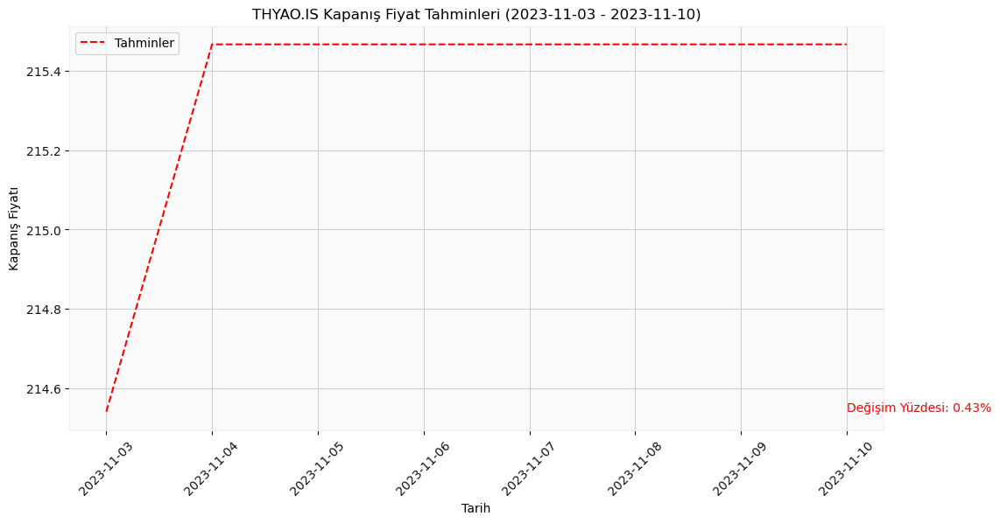

In [57]:

# Veri çekme
symbol = 'THYAO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - TOASO Hissesi

[*********************100%%**********************]  1 of 1 completed


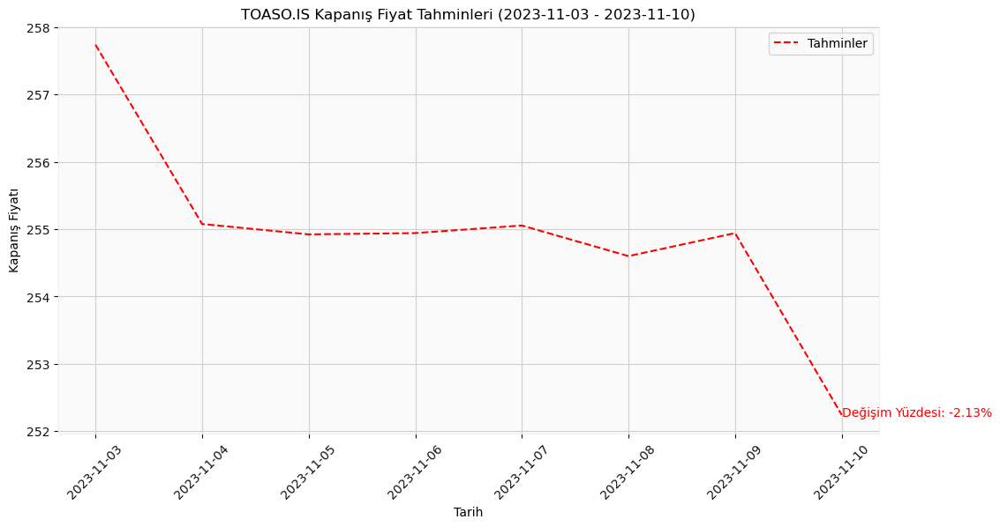

In [58]:


# Veri çekme
symbol = 'TOASO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - TUPRS Hissesi

[*********************100%%**********************]  1 of 1 completed


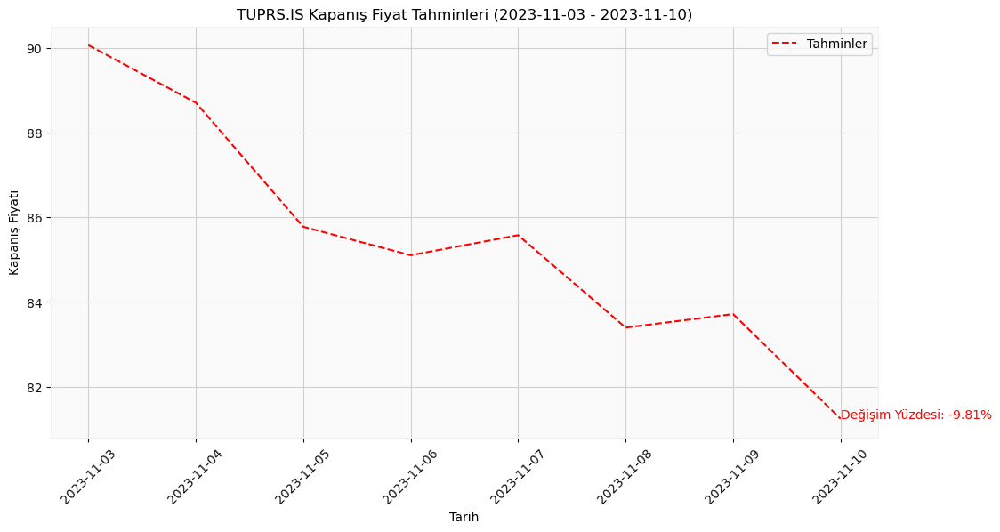

In [59]:


# Veri çekme
symbol = 'TUPRS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## CatBoost - YKBNK Hissesi

[*********************100%%**********************]  1 of 1 completed


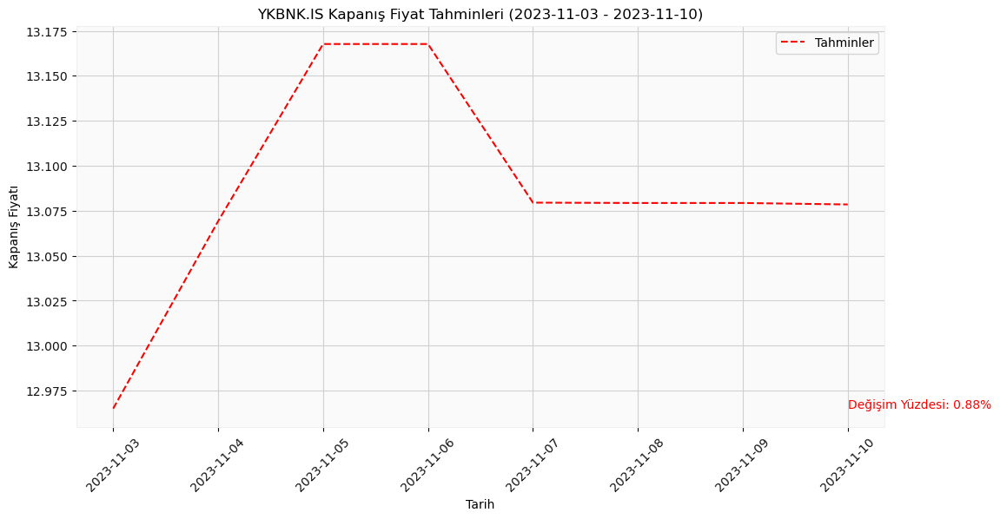

In [60]:


# Veri çekme
symbol = 'YKBNK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = CatBoostRegressor(iterations=1000, depth=6, learning_rate=0.1, loss_function='RMSE', logging_level='Silent')
model.fit(X_train, y_train, verbose=False)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - AKBNK Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 13.181880
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

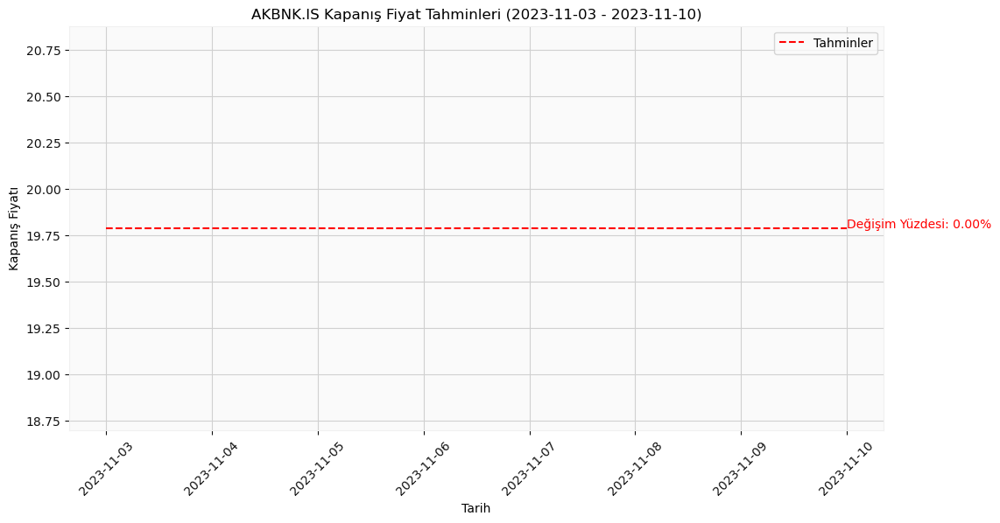

In [61]:


# Veri çekme
symbol = 'AKBNK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - ALARK Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 52.398937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

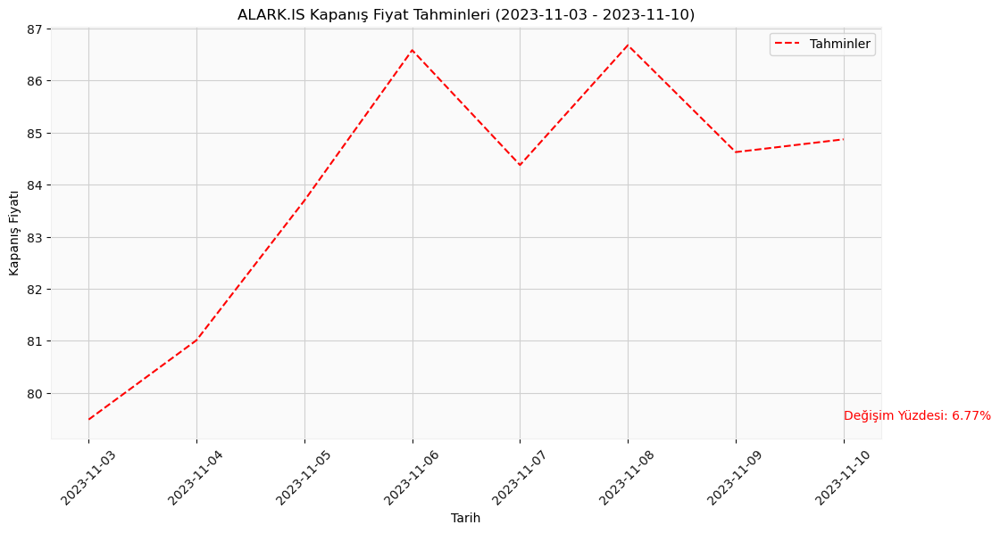

In [62]:

# Veri çekme
symbol = 'ALARK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - ARCLK Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 85.189264
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


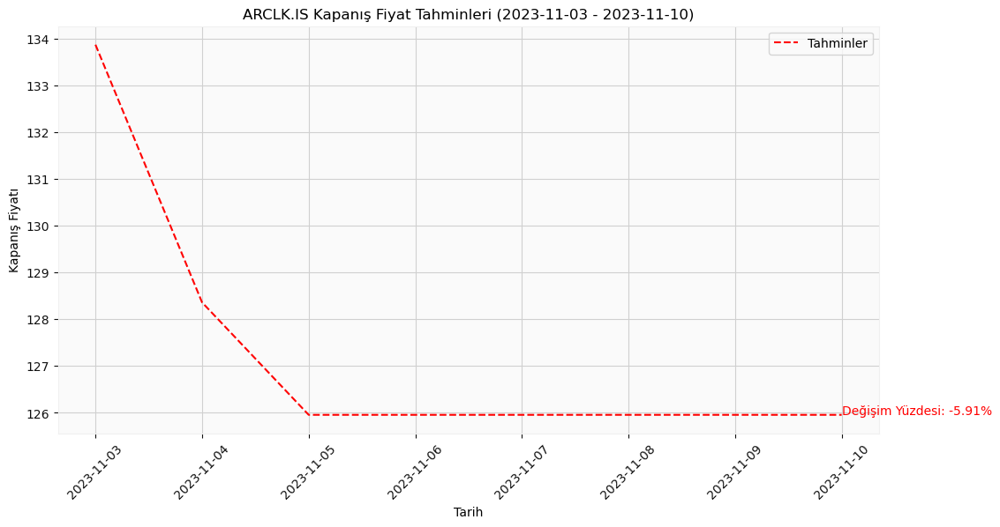

In [63]:

# Veri çekme
symbol = 'ARCLK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - ASELS Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000125 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 18.763324
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


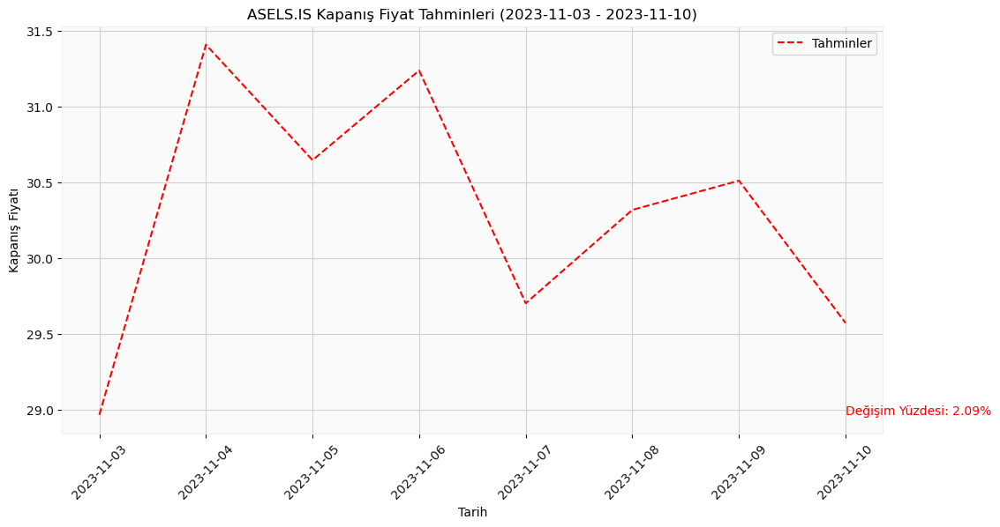

In [64]:

# Veri çekme
symbol = 'ASELS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - BIMAS Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 116.032970
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


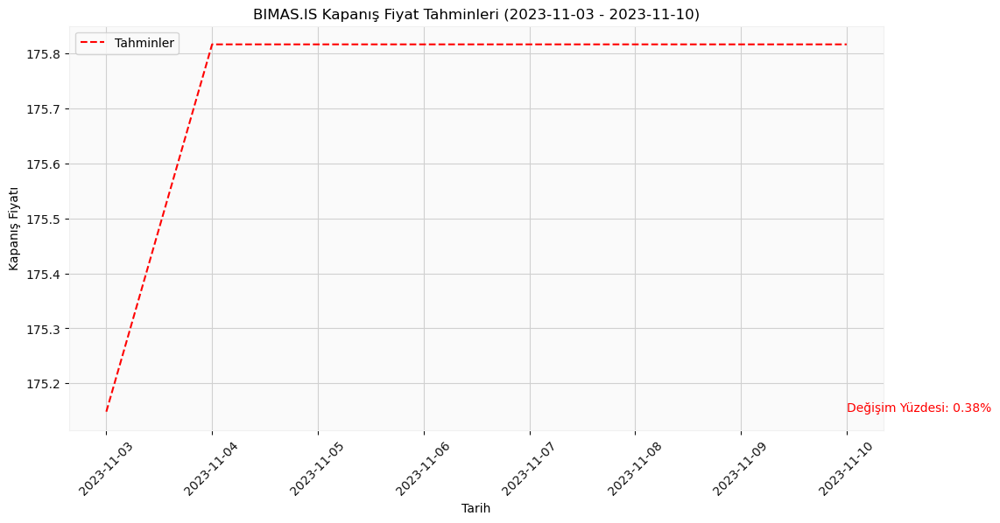

In [65]:

# Veri çekme
symbol = 'BIMAS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - EKGYO Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000061 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1094
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 4.947193
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


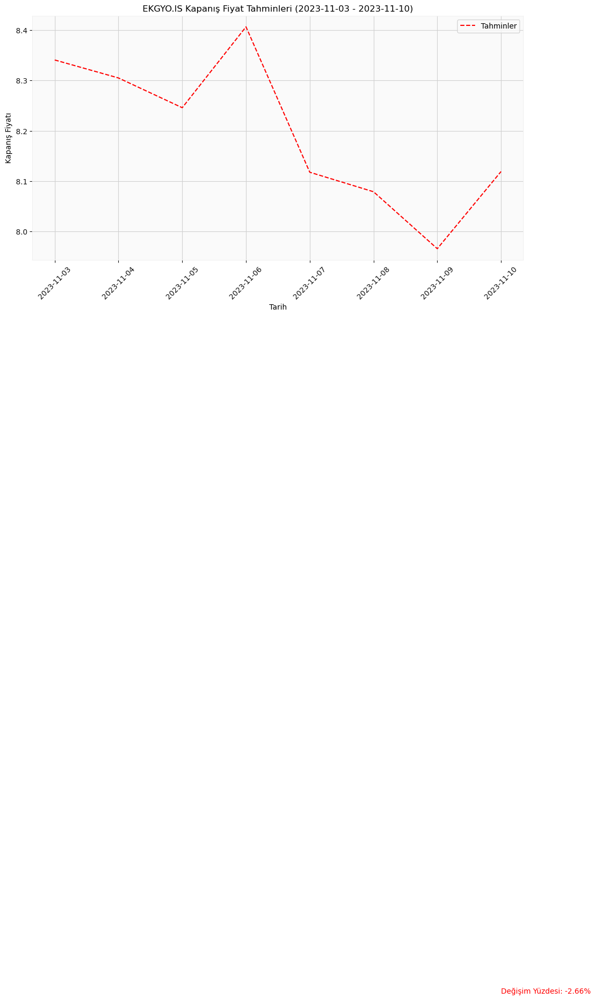

In [66]:

# Veri çekme
symbol = 'EKGYO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - ENKAI Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 21.643384
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


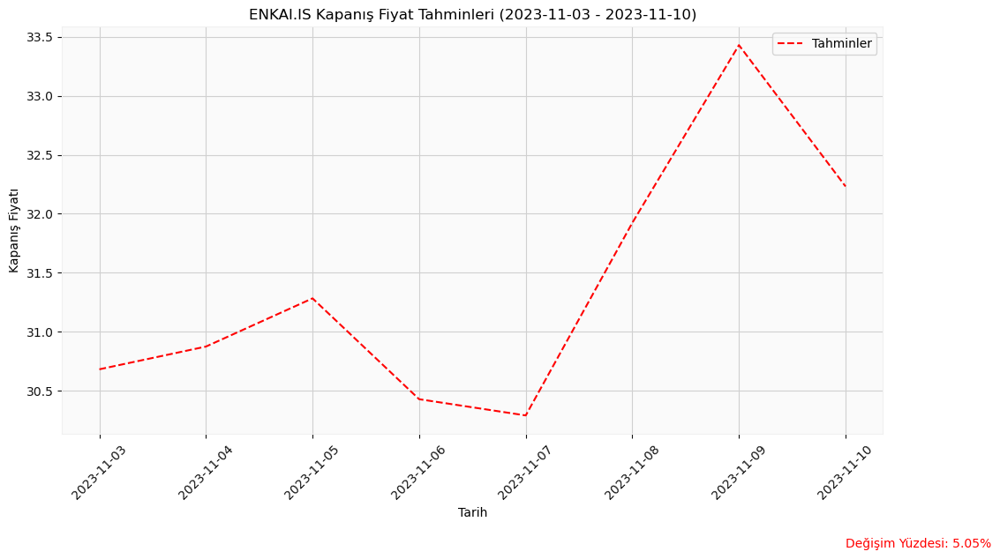

In [67]:

# Veri çekme
symbol = 'ENKAI.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - EREGL Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 33.983760
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


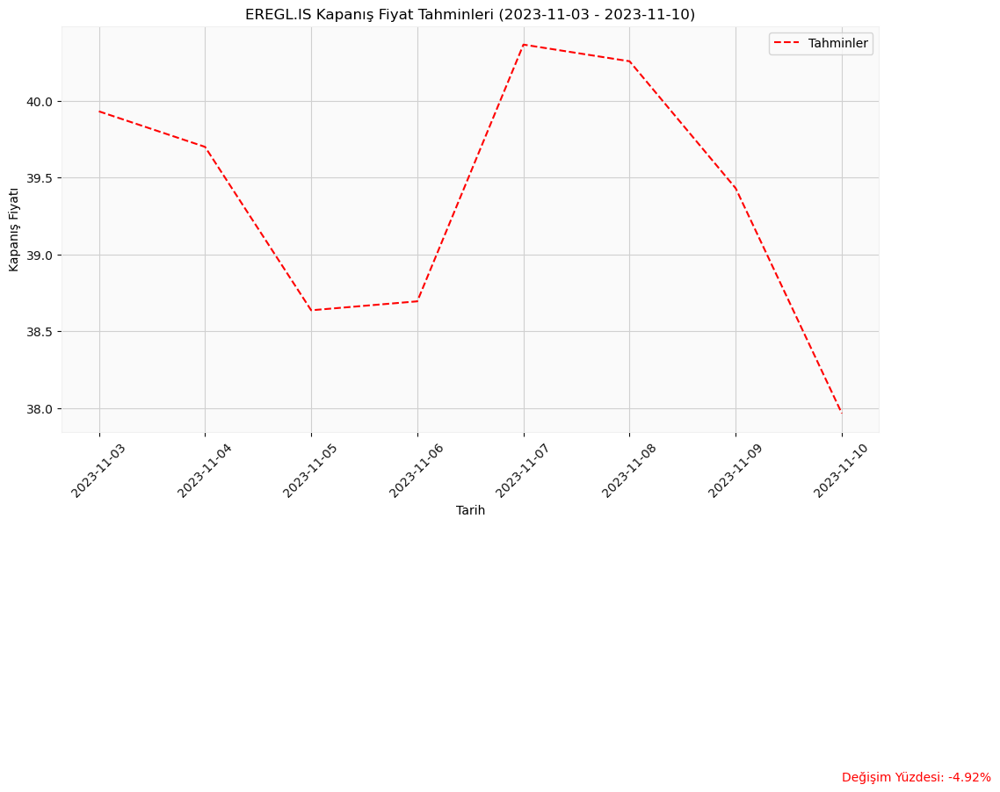

In [68]:

# Veri çekme
symbol = 'EREGL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - FROTO Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 411.716894
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


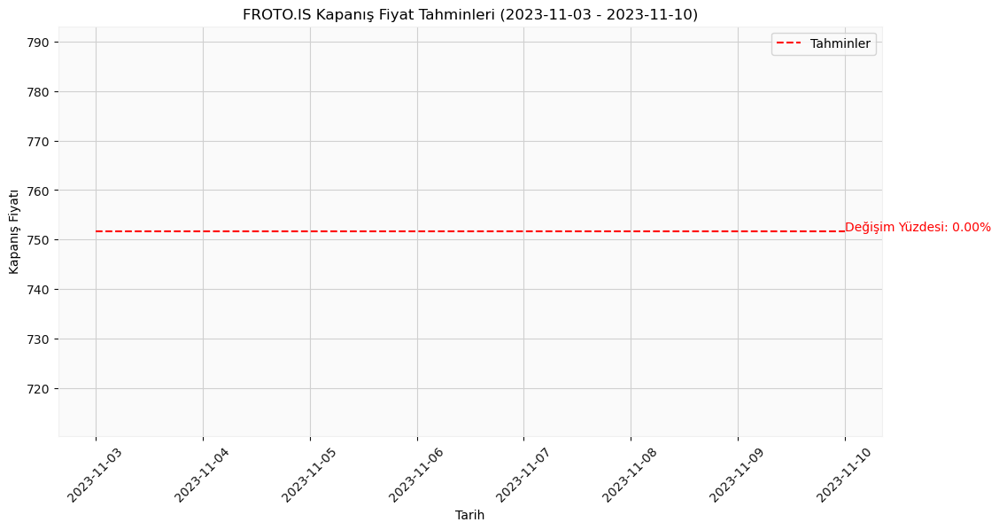

In [69]:

# Veri çekme
symbol = 'FROTO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - GARAN Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 21.129537
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


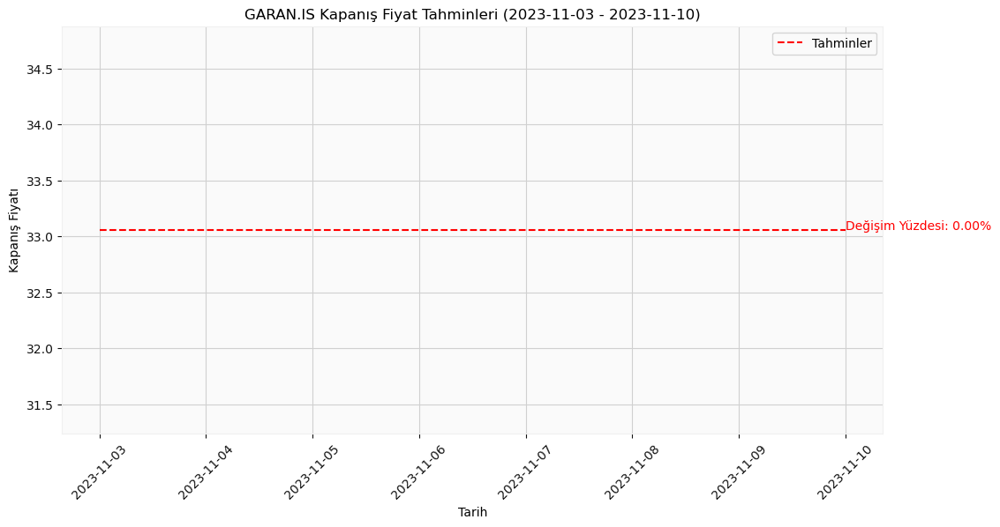

In [70]:

# Veri çekme
symbol = 'GARAN.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - GUBRF Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 156.708311
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


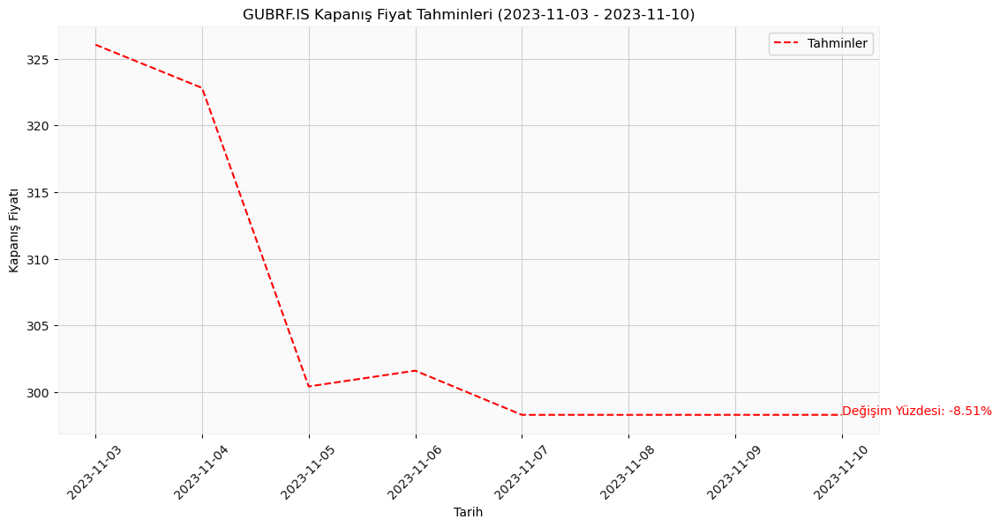

In [71]:

# Veri çekme
symbol = 'GUBRF.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - HEKTS Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 20.137771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


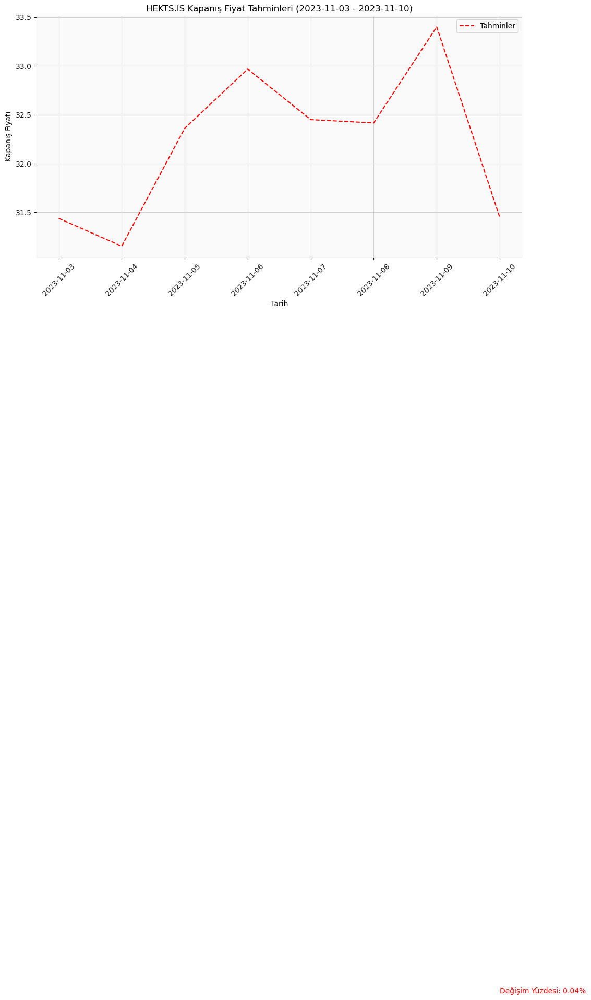

In [72]:

# Veri çekme
symbol = 'HEKTS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - ISCTR Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 8.462167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


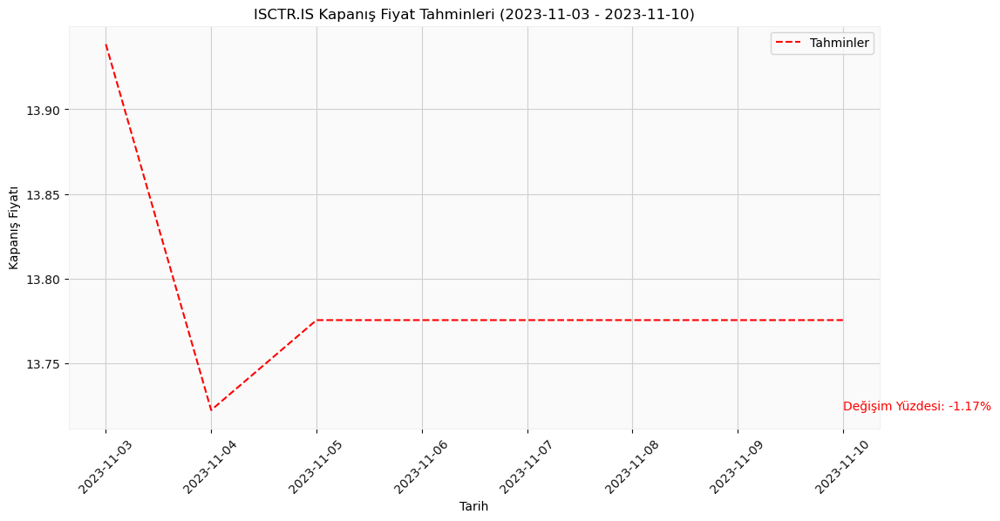

In [73]:

# Veri çekme
symbol = 'ISCTR.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - KCHOL Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1227
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 58.325422
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


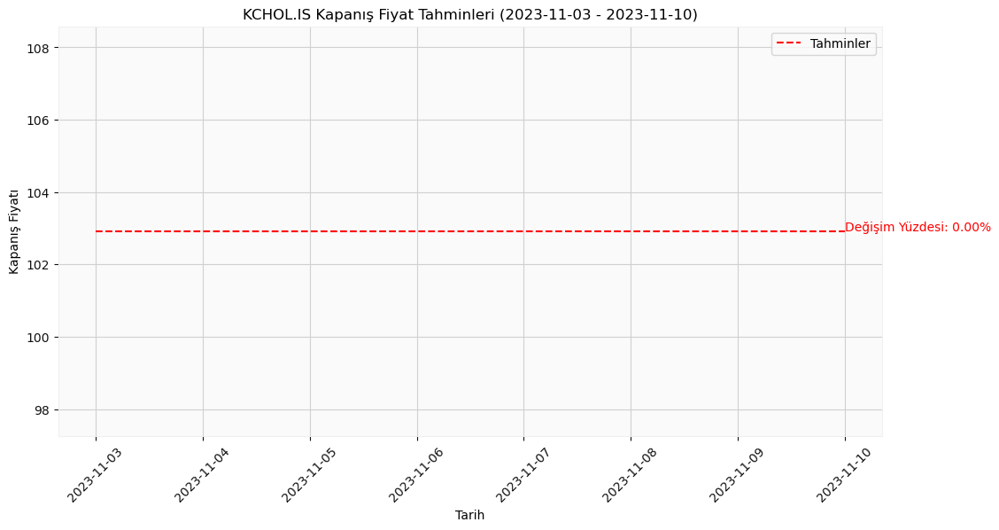

In [74]:

# Veri çekme
symbol = 'KCHOL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - KONTR Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 87.715983
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


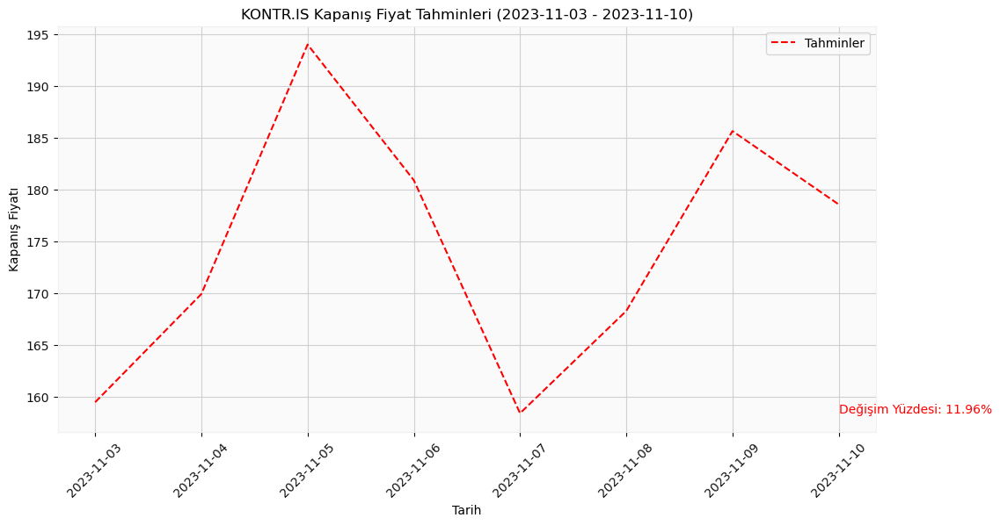

In [75]:

# Veri çekme
symbol = 'KONTR.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - KOZAL Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 14.184807
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


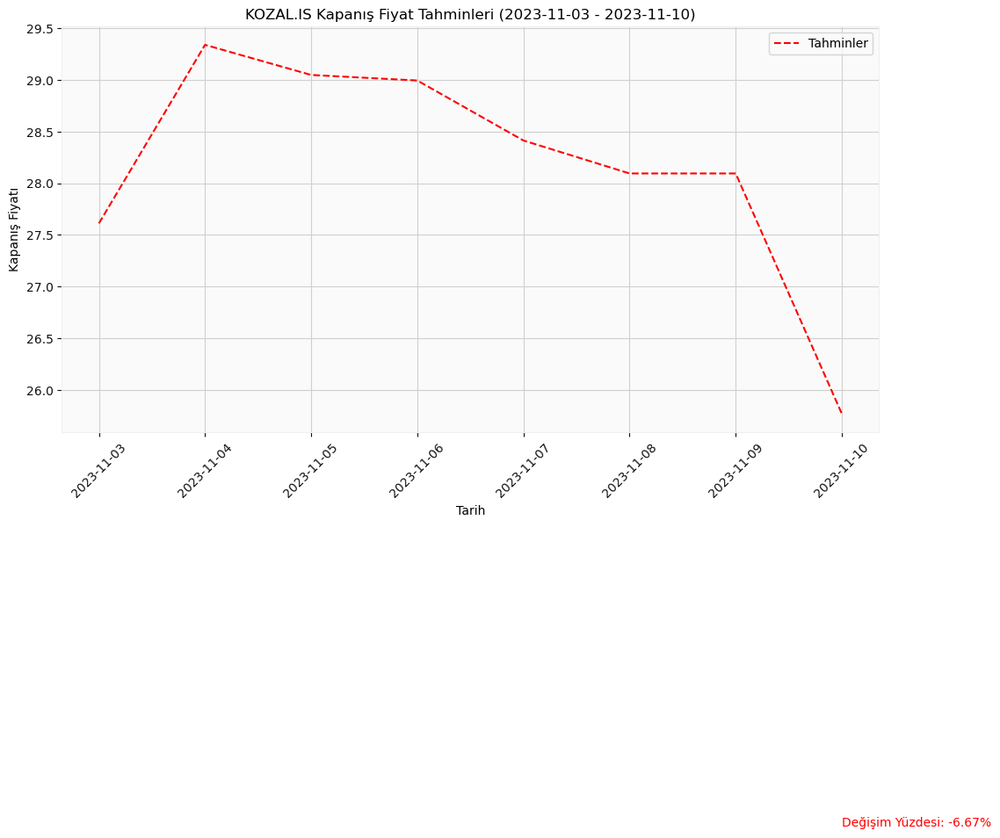

In [76]:

# Veri çekme
symbol = 'KOZAL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - KRDMD Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000079 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 15.309918
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


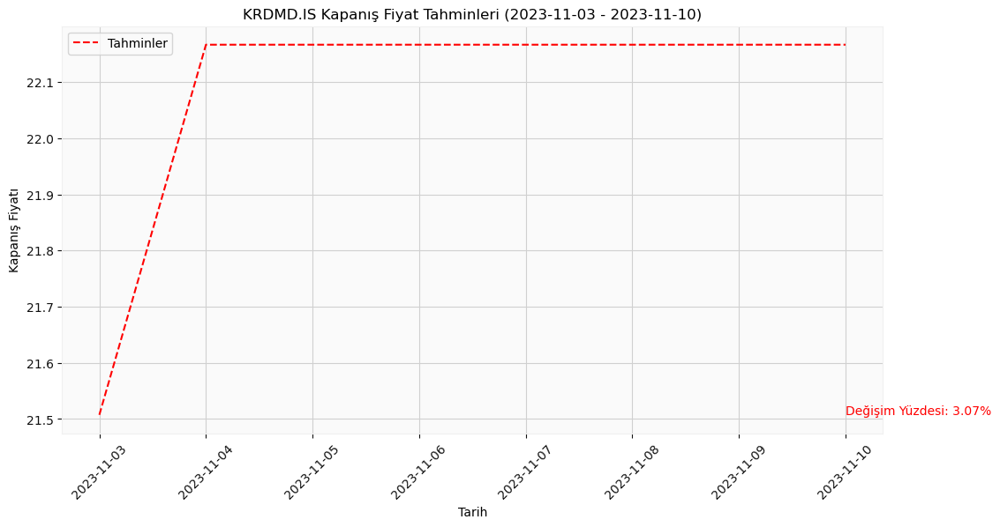

In [77]:

# Veri çekme
symbol = 'KRDMD.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - ODAS Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 5.570109
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


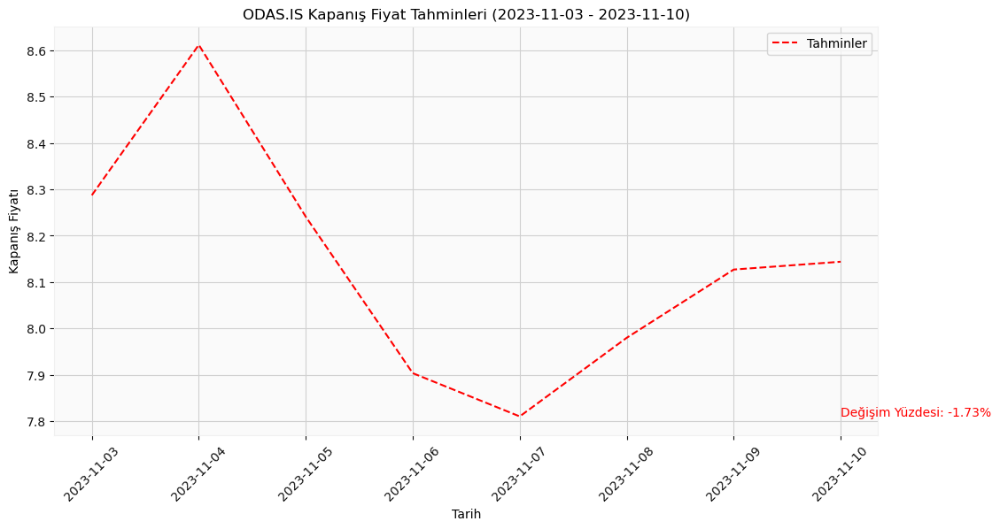

In [78]:

# Veri çekme
symbol = 'ODAS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - OYAKC Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 20.344496
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


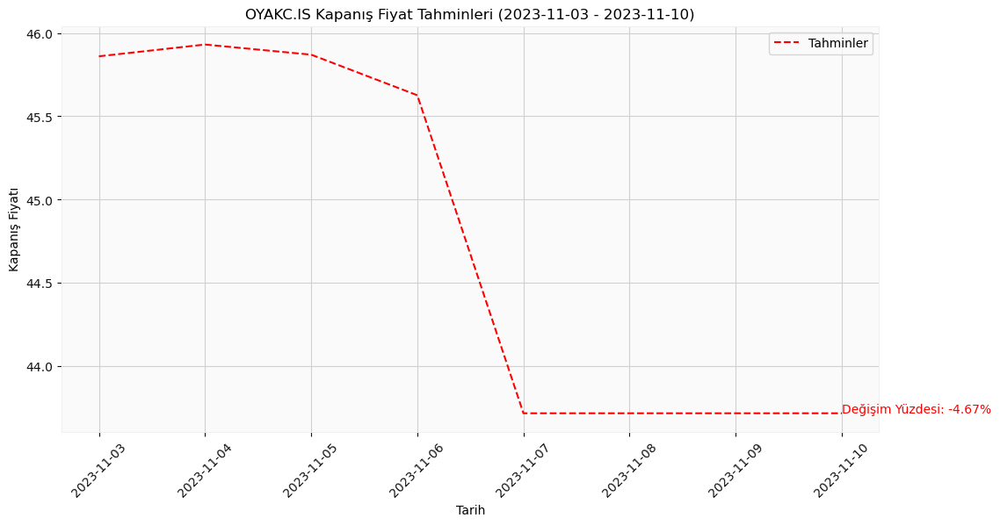

In [79]:

# Veri çekme
symbol = 'OYAKC.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - PETKM Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 12.751962
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


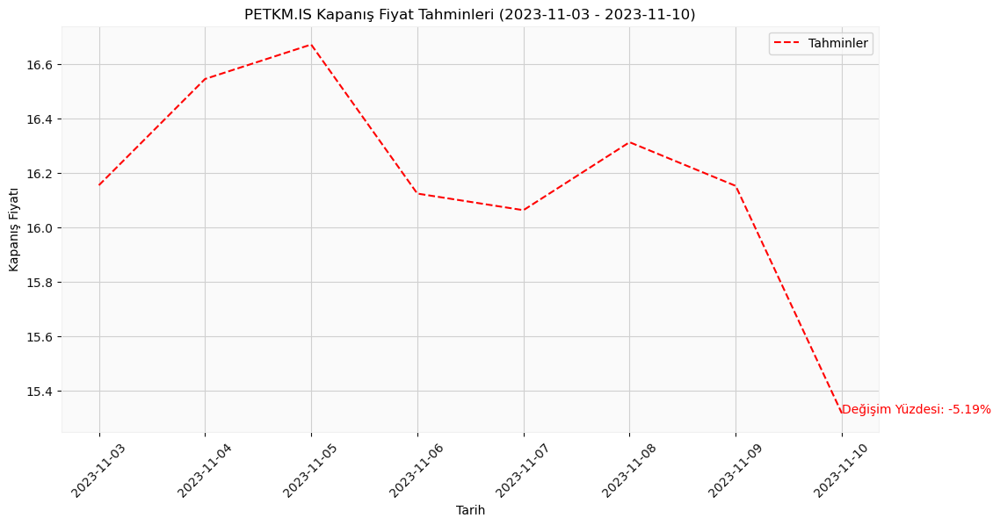

In [80]:

# Veri çekme
symbol = 'PETKM.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - PGSUS Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 308.717030
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


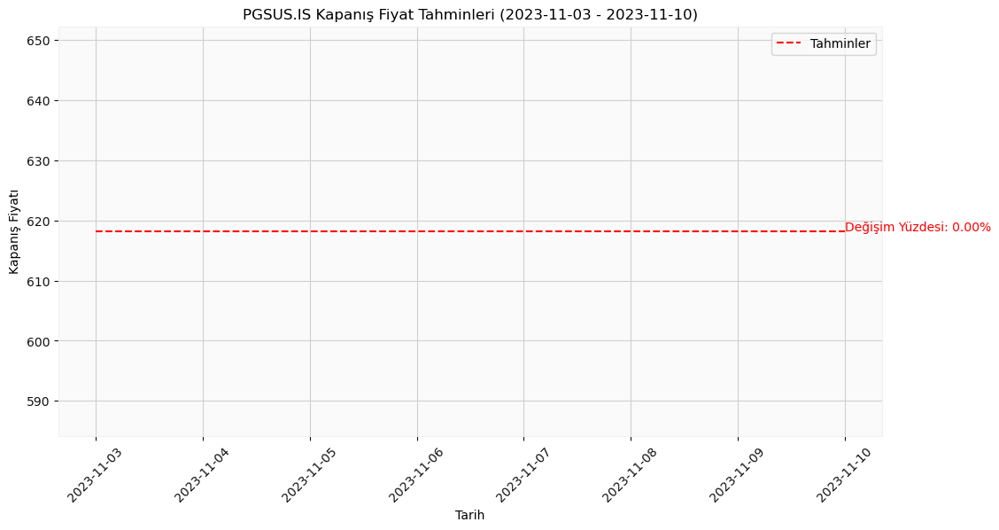

In [81]:

# Veri çekme
symbol = 'PGSUS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - SAHOL Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 30.170518
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


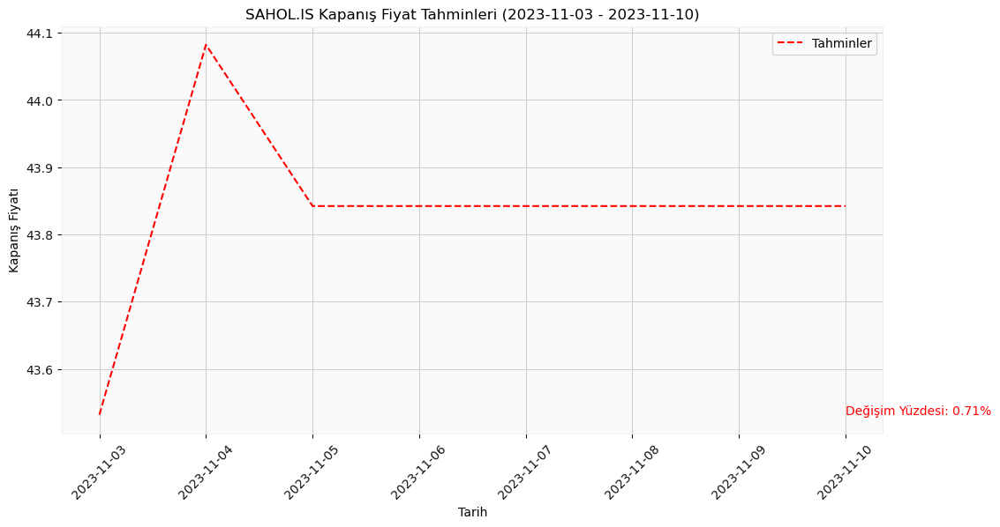

In [82]:

# Veri çekme
symbol = 'SAHOL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - SASA Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 33.400258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


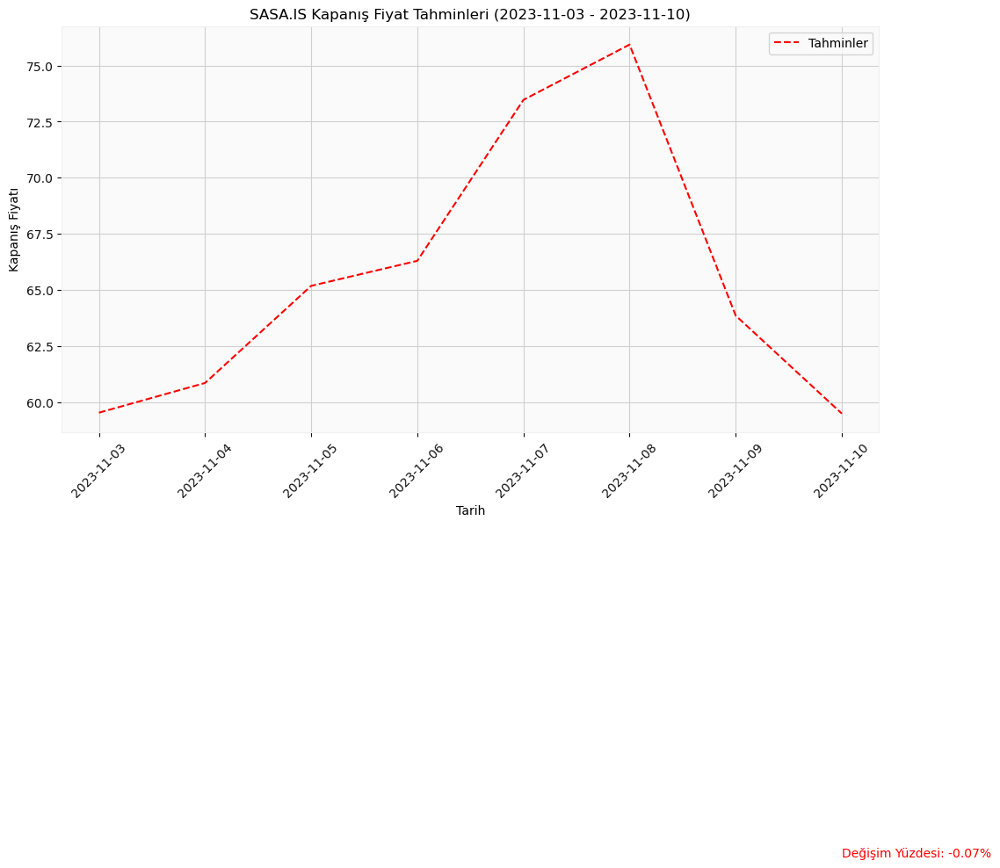

In [83]:

# Veri çekme
symbol = 'SASA.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - SISE Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 30.196758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


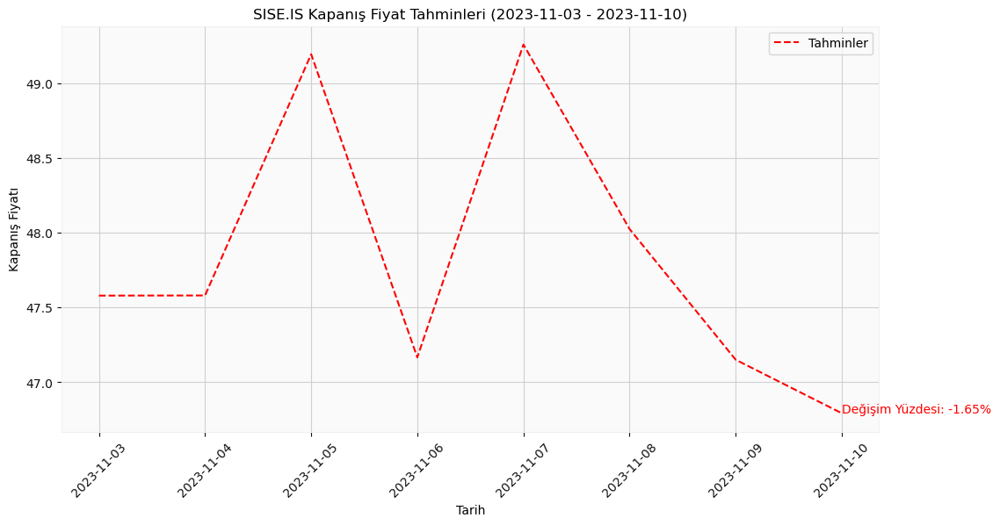

In [84]:

# Veri çekme
symbol = 'SISE.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - TCELL Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 26.855640
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


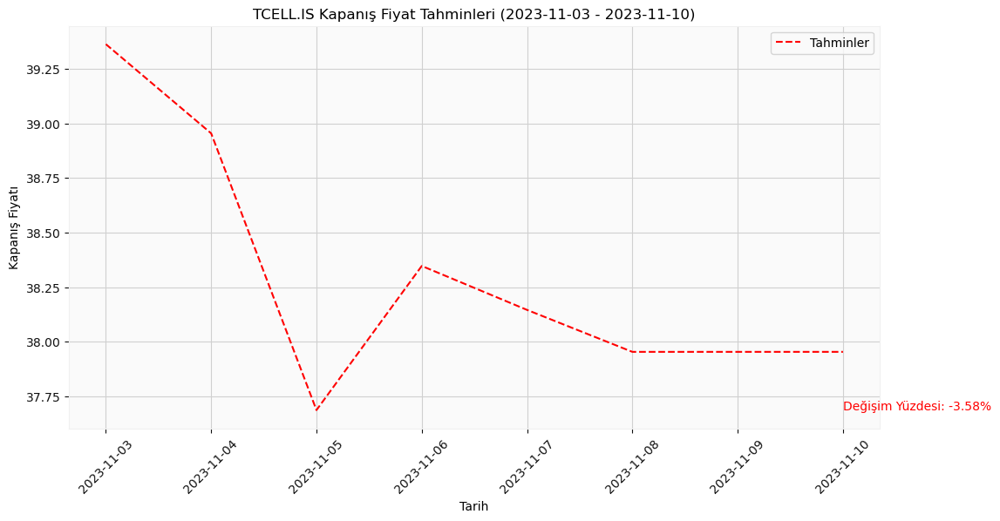

In [85]:

# Veri çekme
symbol = 'TCELL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - THYAO Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 91.350981
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


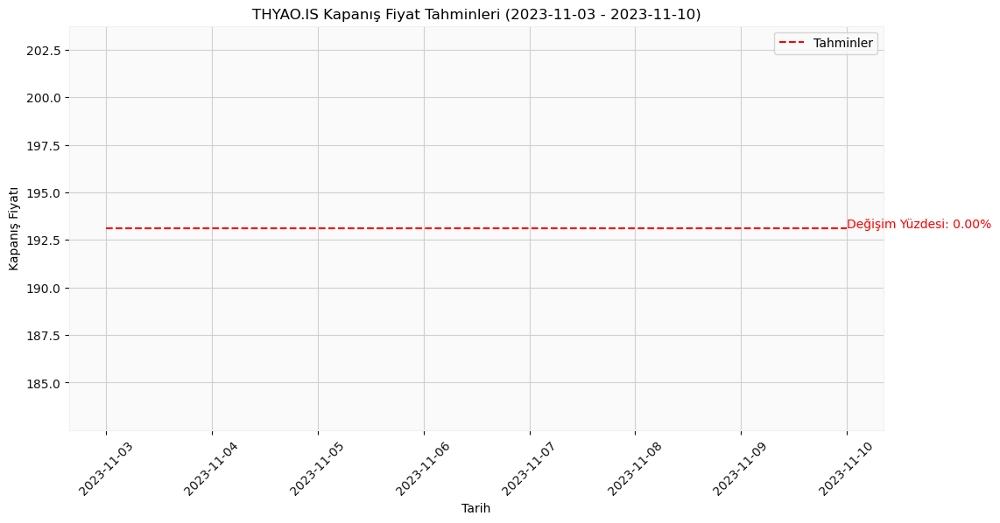

In [86]:

# Veri çekme
symbol = 'THYAO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - TOASO Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 124.461580
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


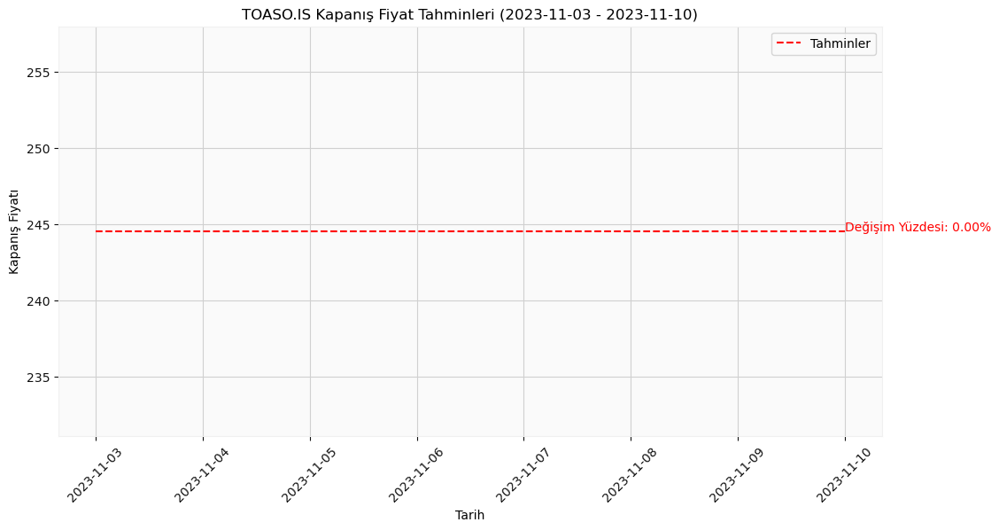

In [87]:

# Veri çekme
symbol = 'TOASO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - TUPRS Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 54.214519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furthe

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


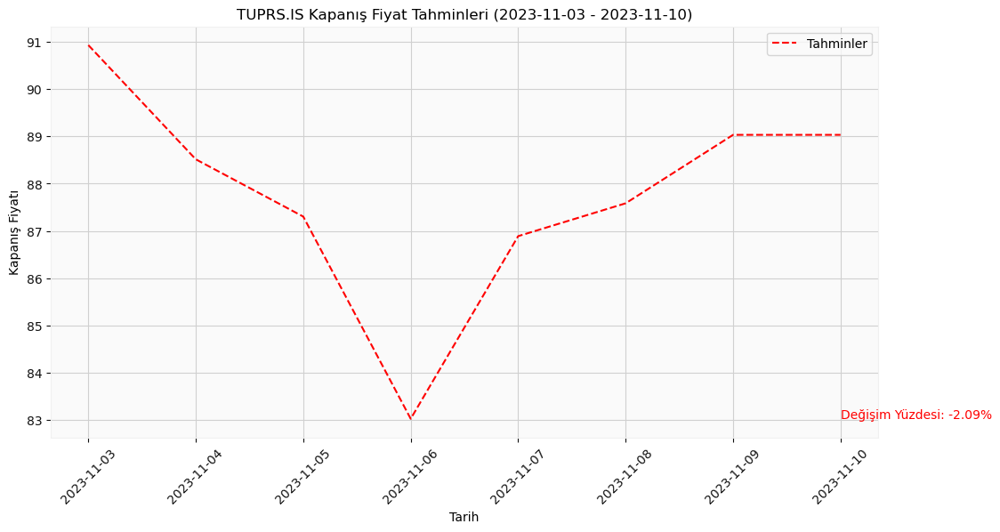

In [88]:

# Veri çekme
symbol = 'TUPRS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## LightGBM - YKBNK Hissesi

[*********************100%%**********************]  1 of 1 completed
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 367, number of used features: 10
[LightGBM] [Info] Start training from score 7.757139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

C:\Users\emres\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


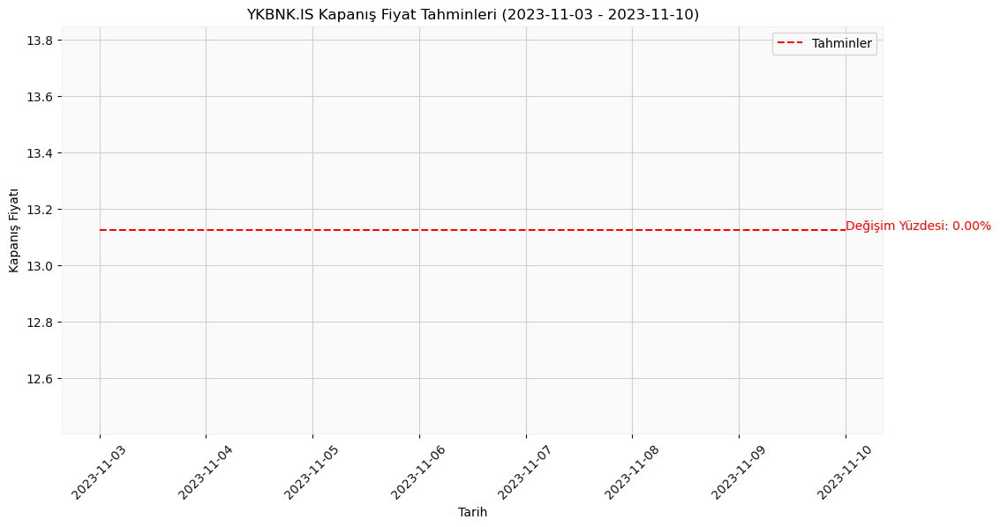

In [89]:

# Veri çekme
symbol = 'YKBNK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values.reshape(-1, 1)  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# CatBoost için veri çerçevesine dönüştürün
X_train = X_train.reshape(X_train.shape[0], -1)  # Veriyi 2D olarak düzenleyin
X_test = X_test.reshape(X_test.shape[0], -1)

# Modeli oluşturun ve eğitin
model = lgb.LGBMRegressor(n_estimators=1000, max_depth=6, learning_rate=0.1)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## Random Forest - AKBNK Hissesi

[*********************100%%**********************]  1 of 1 completed


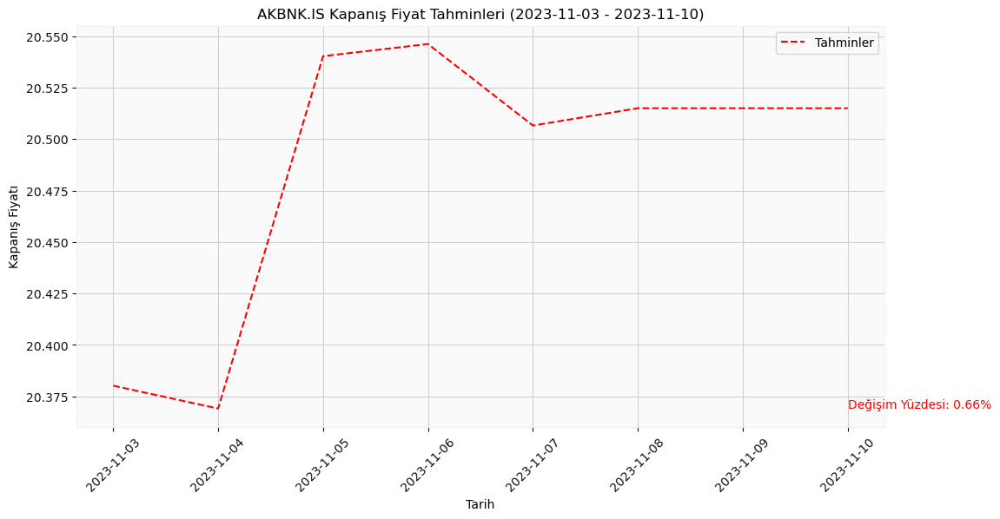

In [90]:


# Veri çekme
symbol = 'AKBNK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()


## Random Forest - ALARK Hissesi

[*********************100%%**********************]  1 of 1 completed


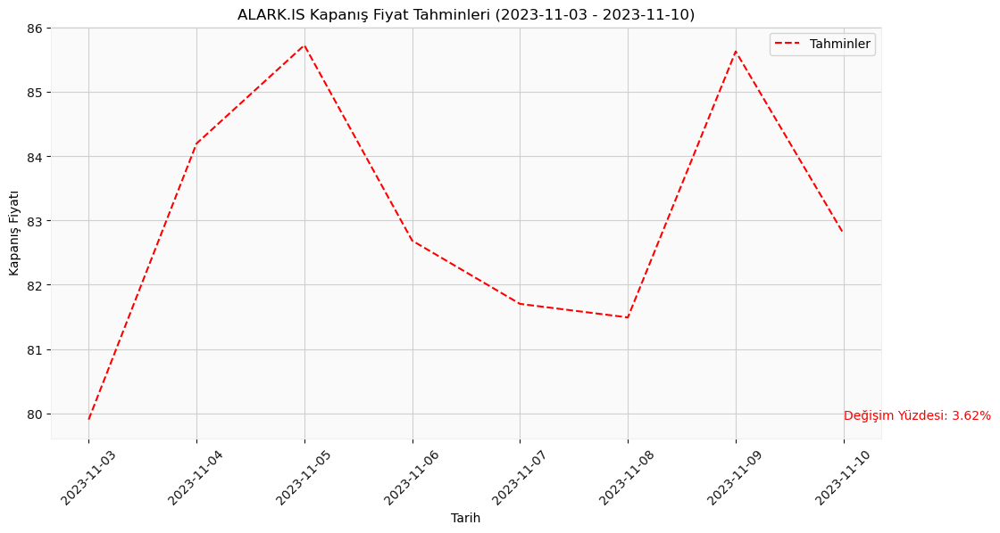

In [91]:


# Veri çekme
symbol = 'ALARK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - ARCLK Hissesi

[*********************100%%**********************]  1 of 1 completed


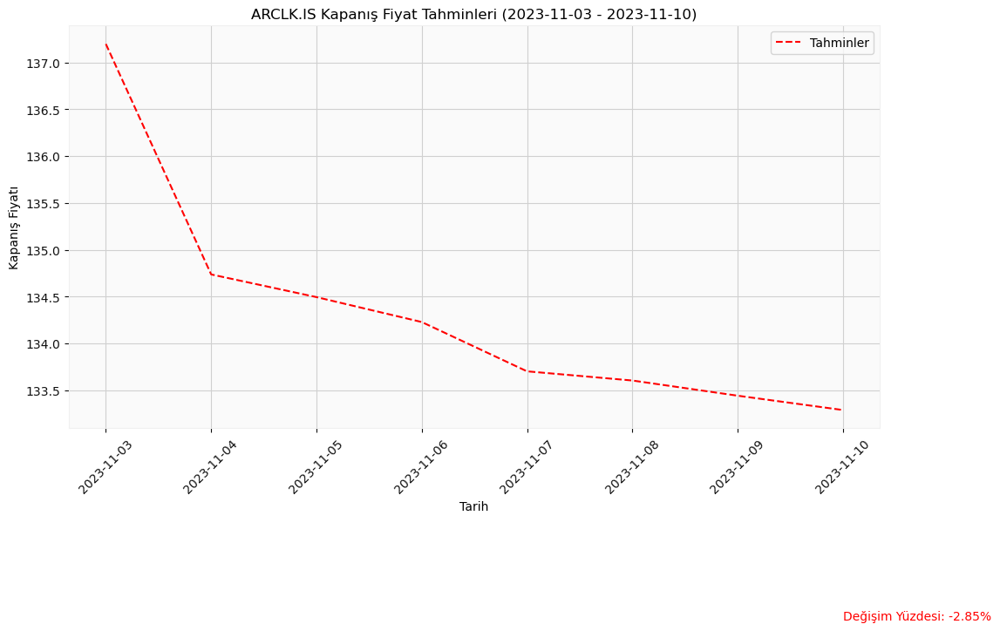

In [92]:


# Veri çekme
symbol = 'ARCLK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - ASELS Hissesi

[*********************100%%**********************]  1 of 1 completed


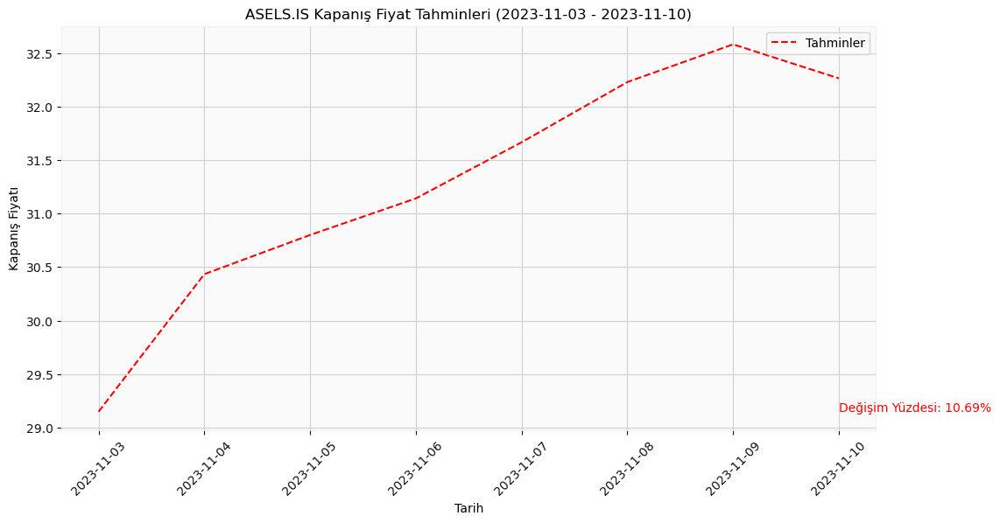

In [93]:


# Veri çekme
symbol = 'ASELS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - BIMAS Hissesi

[*********************100%%**********************]  1 of 1 completed


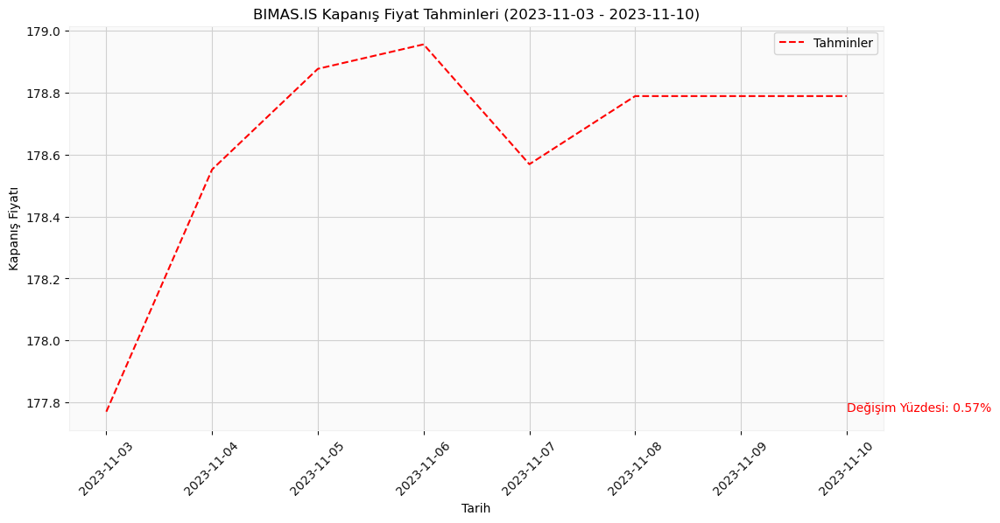

In [94]:


# Veri çekme
symbol = 'BIMAS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - EKGYO Hissesi

[*********************100%%**********************]  1 of 1 completed


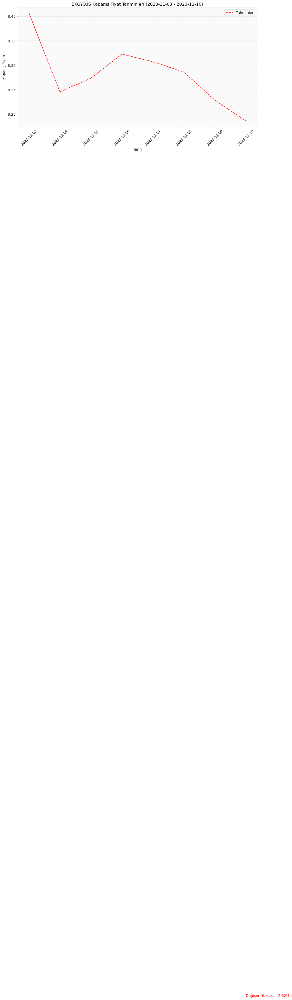

In [95]:


# Veri çekme
symbol = 'EKGYO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - ENKAI Hissesi

[*********************100%%**********************]  1 of 1 completed


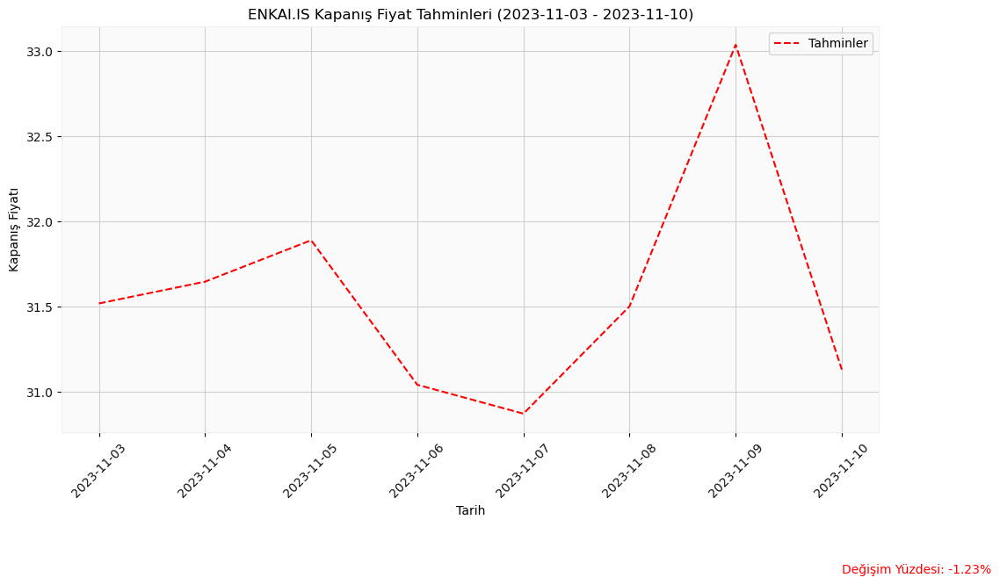

In [96]:


# Veri çekme
symbol = 'ENKAI.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - EREGL Hissesi

[*********************100%%**********************]  1 of 1 completed


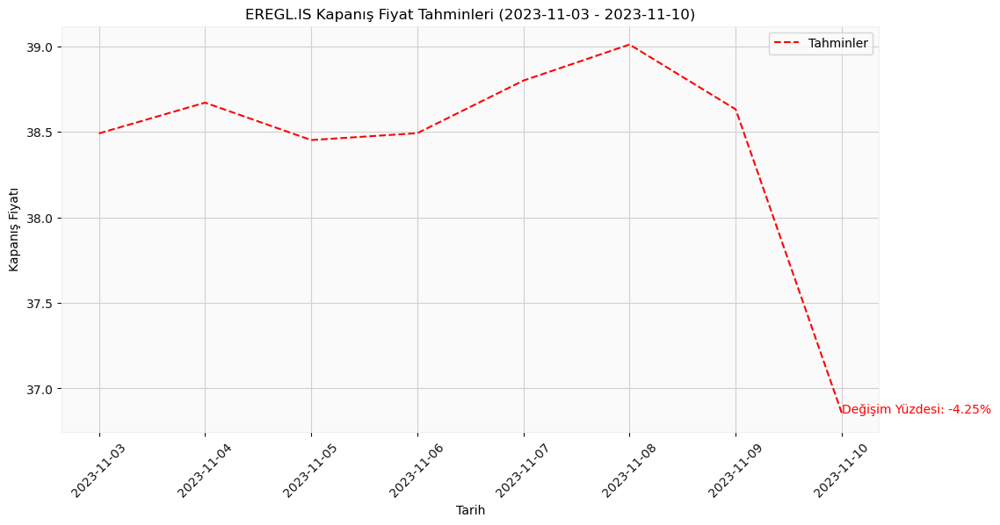

In [97]:


# Veri çekme
symbol = 'EREGL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - FROTO Hissesi

[*********************100%%**********************]  1 of 1 completed


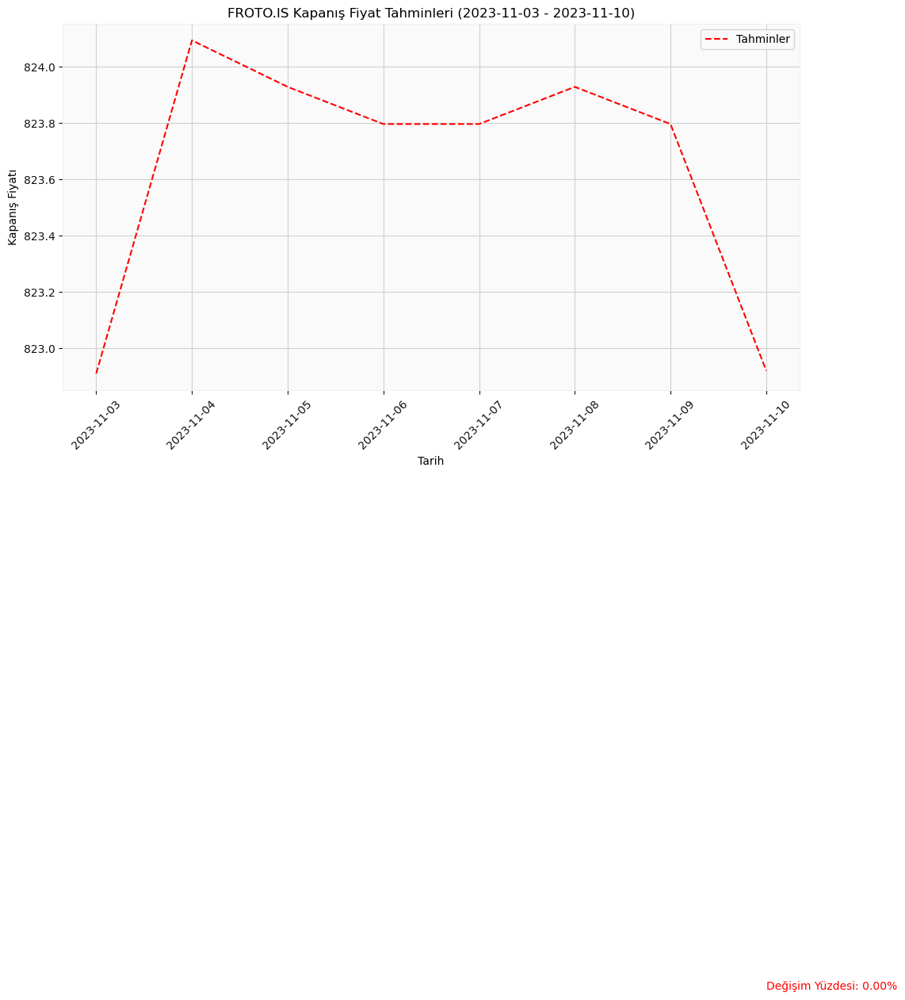

In [98]:


# Veri çekme
symbol = 'FROTO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - GARAN Hissesi

[*********************100%%**********************]  1 of 1 completed


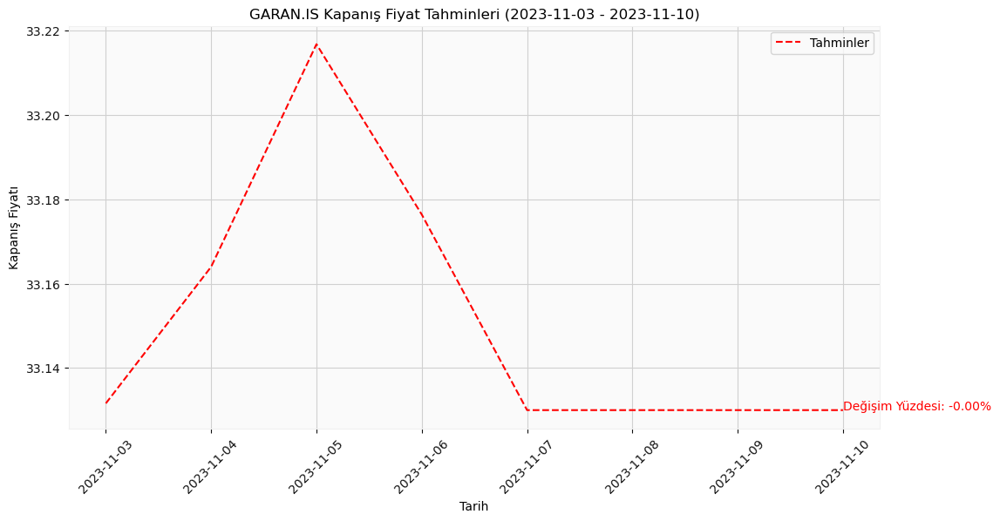

In [99]:


# Veri çekme
symbol = 'GARAN.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - GUBRF Hissesi

[*********************100%%**********************]  1 of 1 completed


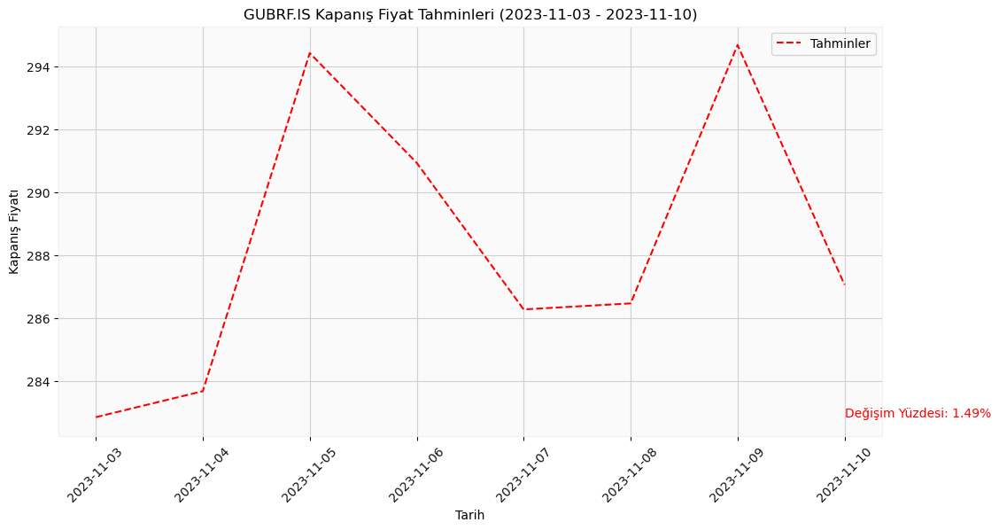

In [100]:


# Veri çekme
symbol = 'GUBRF.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - HEKTS Hissesi

[*********************100%%**********************]  1 of 1 completed


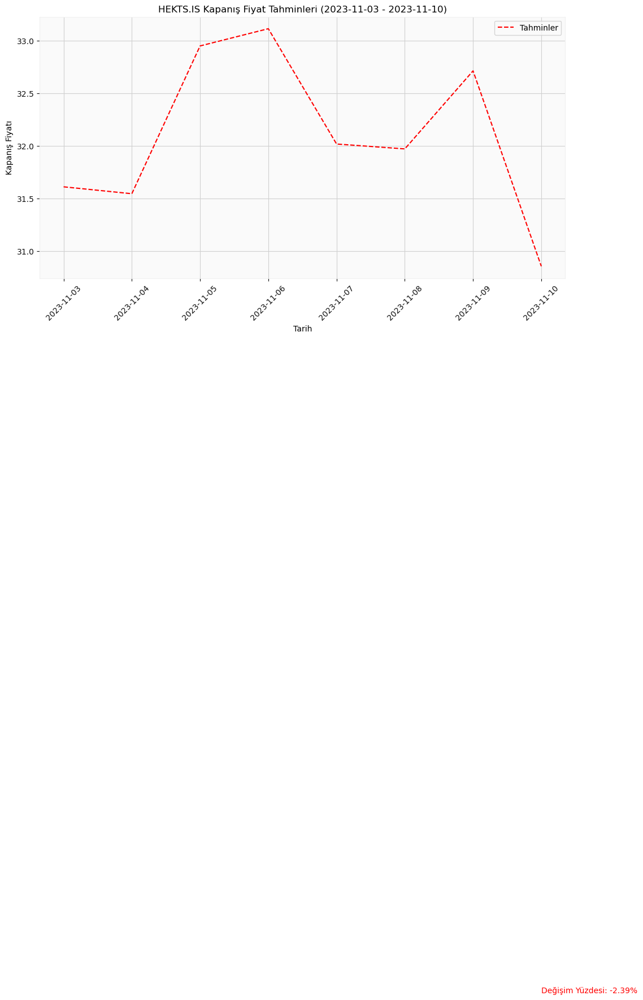

In [101]:


# Veri çekme
symbol = 'HEKTS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - ISCTR Hissesi

[*********************100%%**********************]  1 of 1 completed


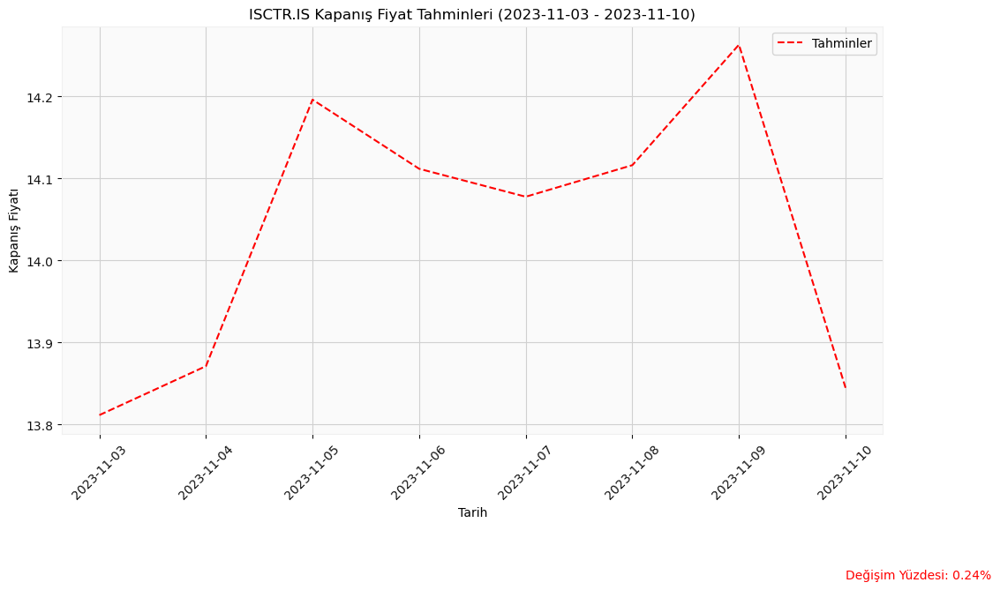

In [102]:


# Veri çekme
symbol = 'ISCTR.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - KCHOL Hissesi

[*********************100%%**********************]  1 of 1 completed


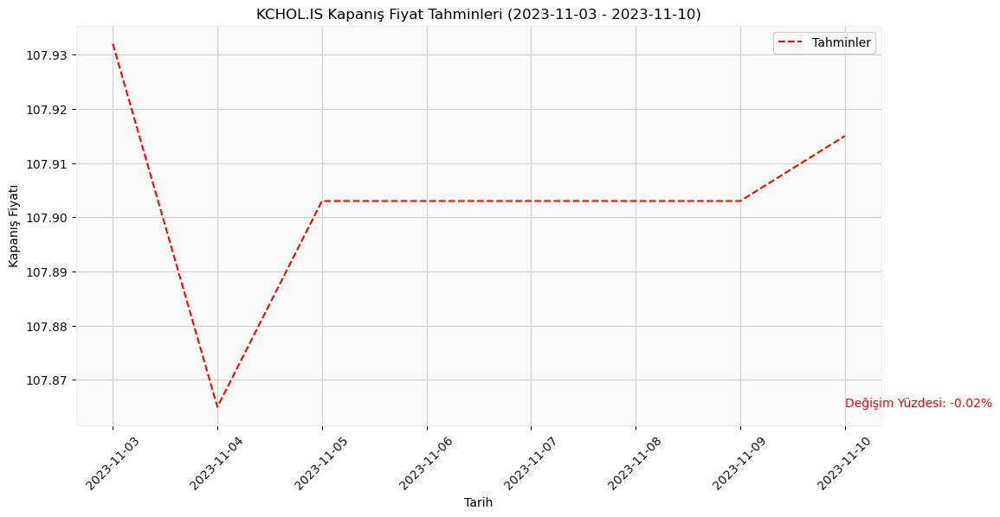

In [103]:


# Veri çekme
symbol = 'KCHOL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - KONTR Hissesi

[*********************100%%**********************]  1 of 1 completed


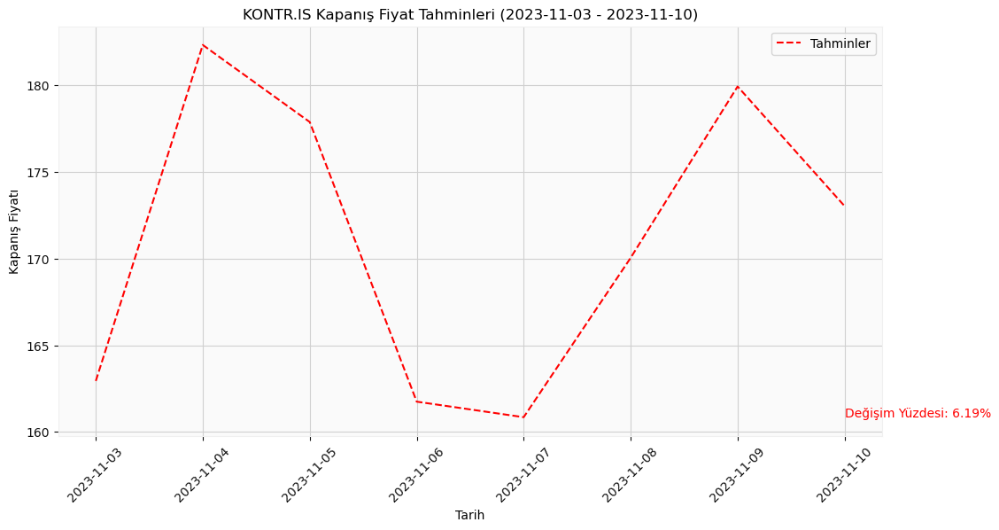

In [104]:


# Veri çekme
symbol = 'KONTR.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - KOZAL Hissesi

[*********************100%%**********************]  1 of 1 completed


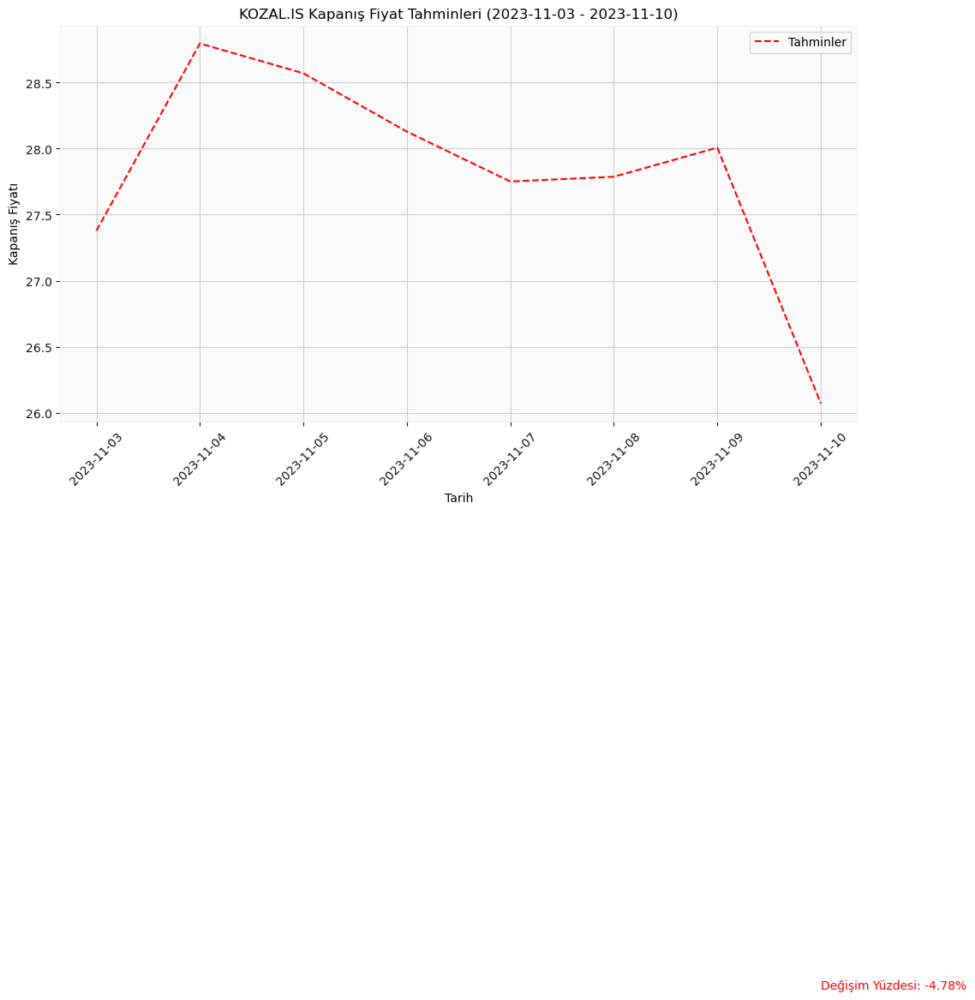

In [105]:


# Veri çekme
symbol = 'KOZAL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - KRDMD Hissesi

[*********************100%%**********************]  1 of 1 completed


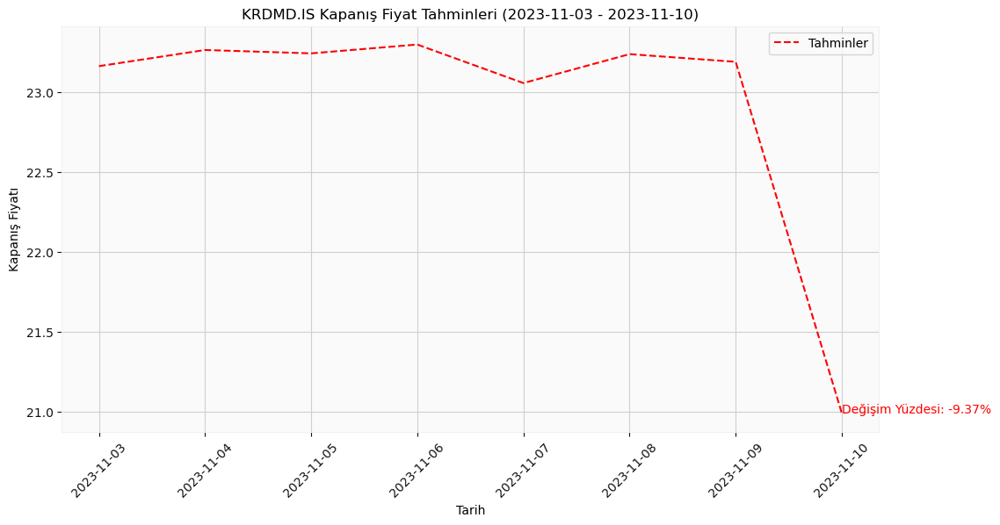

In [106]:


# Veri çekme
symbol = 'KRDMD.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - ODAS Hissesi

[*********************100%%**********************]  1 of 1 completed


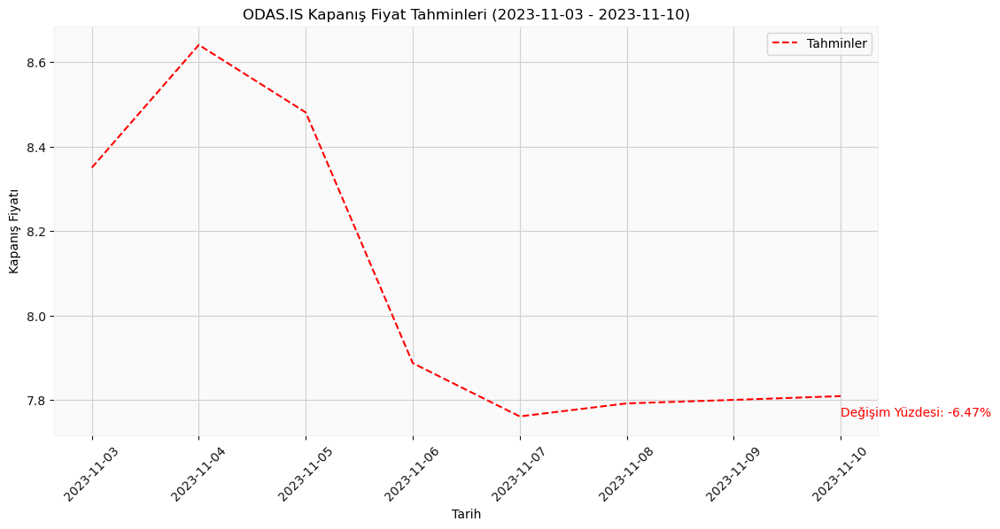

In [107]:


# Veri çekme
symbol = 'ODAS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - OYAKC Hissesi

[*********************100%%**********************]  1 of 1 completed


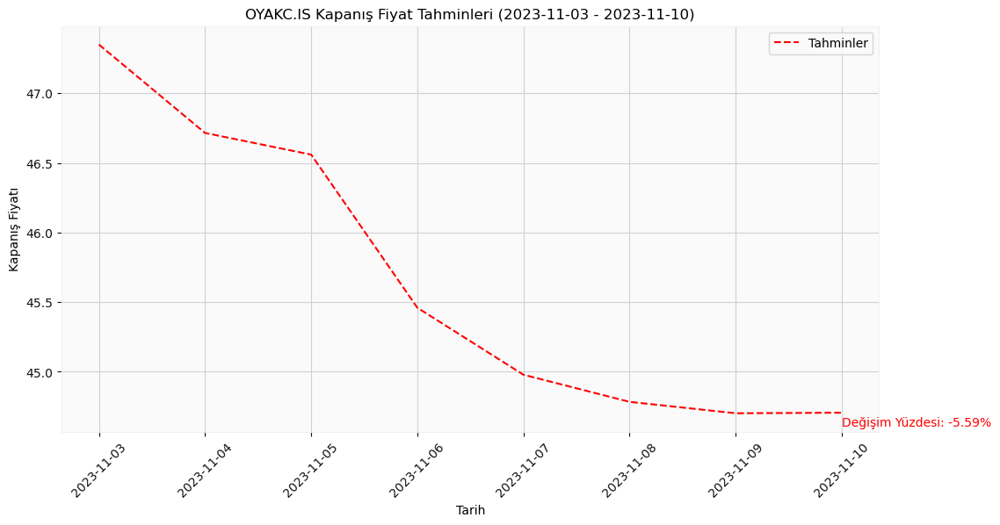

In [108]:


# Veri çekme
symbol = 'OYAKC.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - PETKM Hissesi

[*********************100%%**********************]  1 of 1 completed


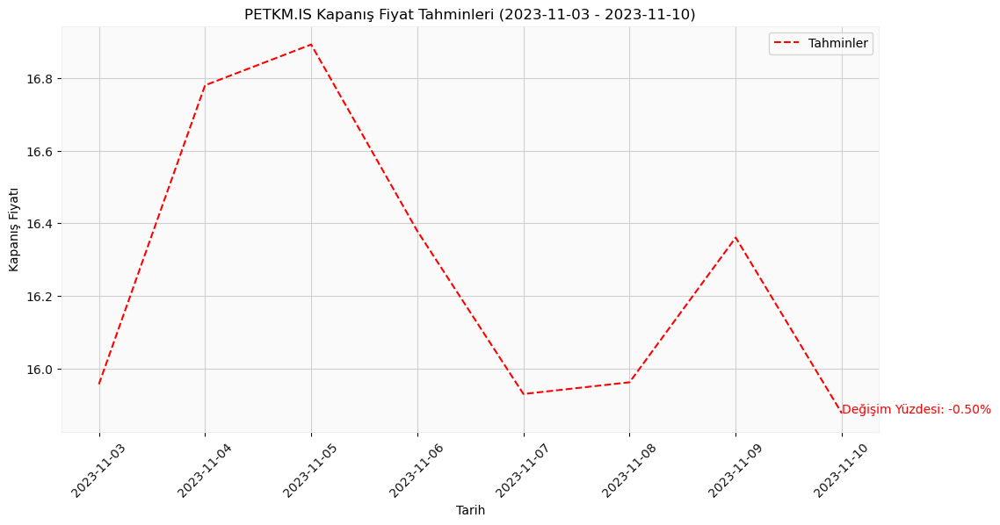

In [109]:


# Veri çekme
symbol = 'PETKM.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - PGSUS Hissesi

[*********************100%%**********************]  1 of 1 completed


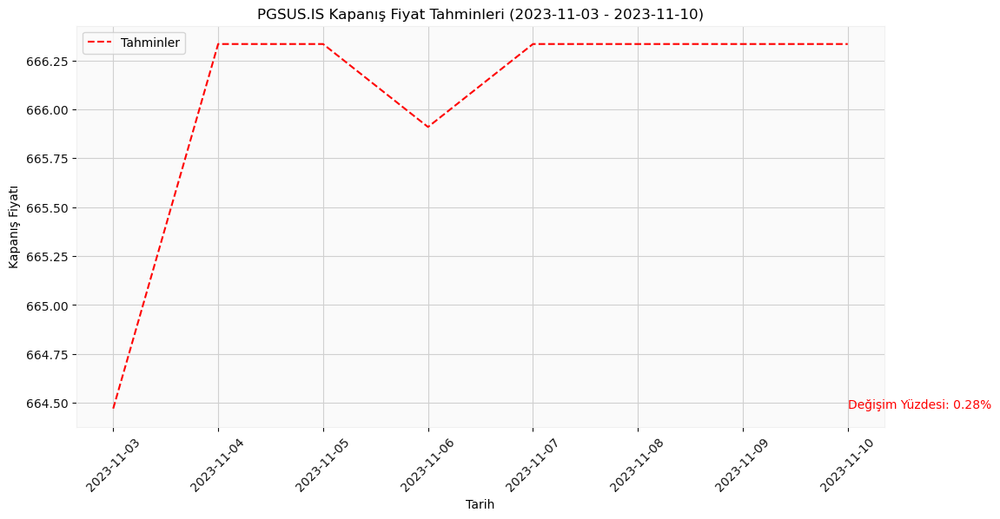

In [110]:


# Veri çekme
symbol = 'PGSUS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - SAHOL Hissesi

[*********************100%%**********************]  1 of 1 completed


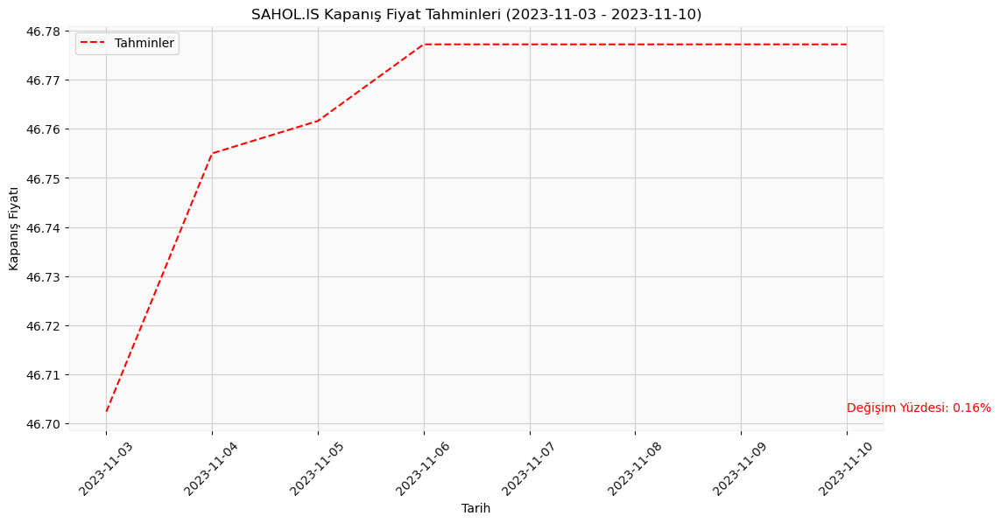

In [111]:


# Veri çekme
symbol = 'SAHOL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - SASA Hissesi

[*********************100%%**********************]  1 of 1 completed


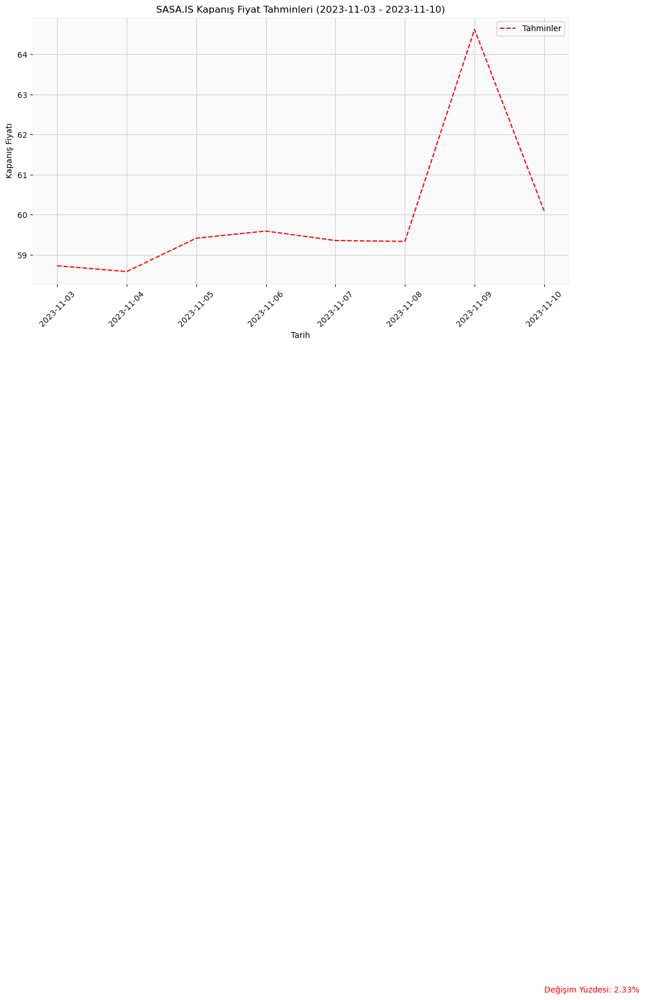

In [112]:


# Veri çekme
symbol = 'SASA.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - SISE Hissesi

[*********************100%%**********************]  1 of 1 completed


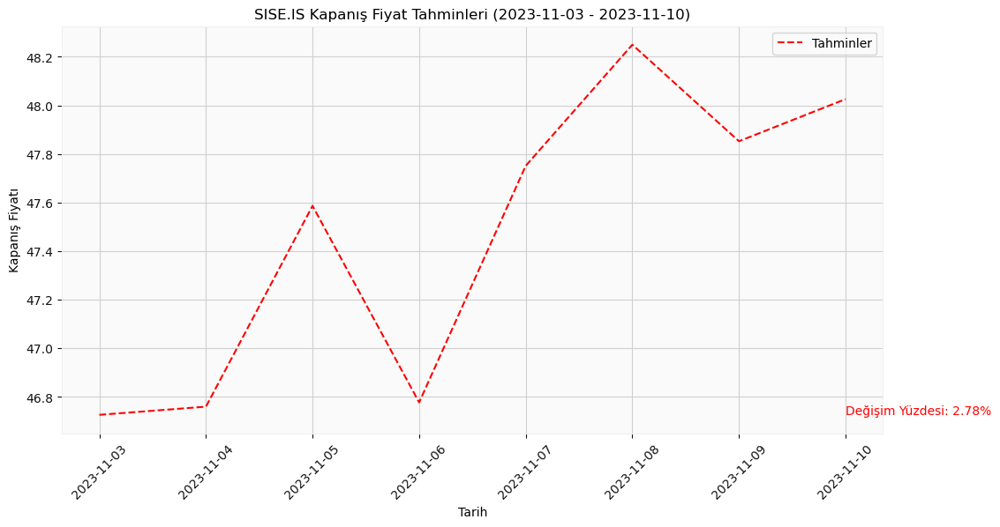

In [113]:


# Veri çekme
symbol = 'SISE.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - TCELL Hissesi

[*********************100%%**********************]  1 of 1 completed


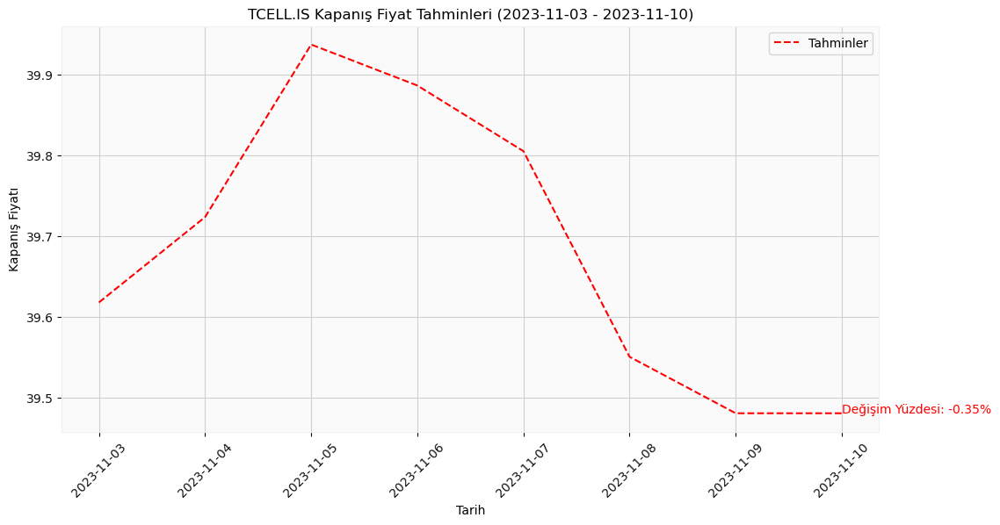

In [114]:


# Veri çekme
symbol = 'TCELL.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - THYAO Hissesi

[*********************100%%**********************]  1 of 1 completed


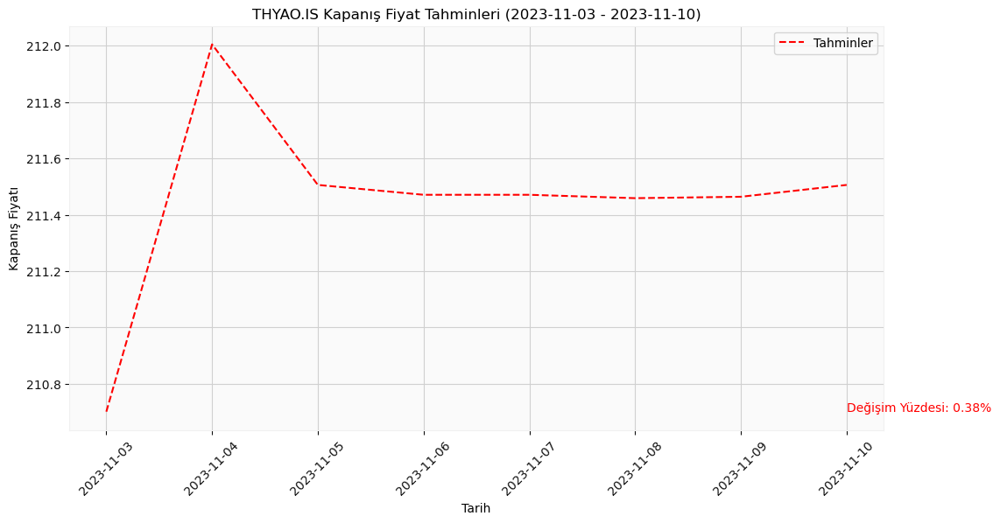

In [115]:


# Veri çekme
symbol = 'THYAO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - TOASO Hissesi

[*********************100%%**********************]  1 of 1 completed


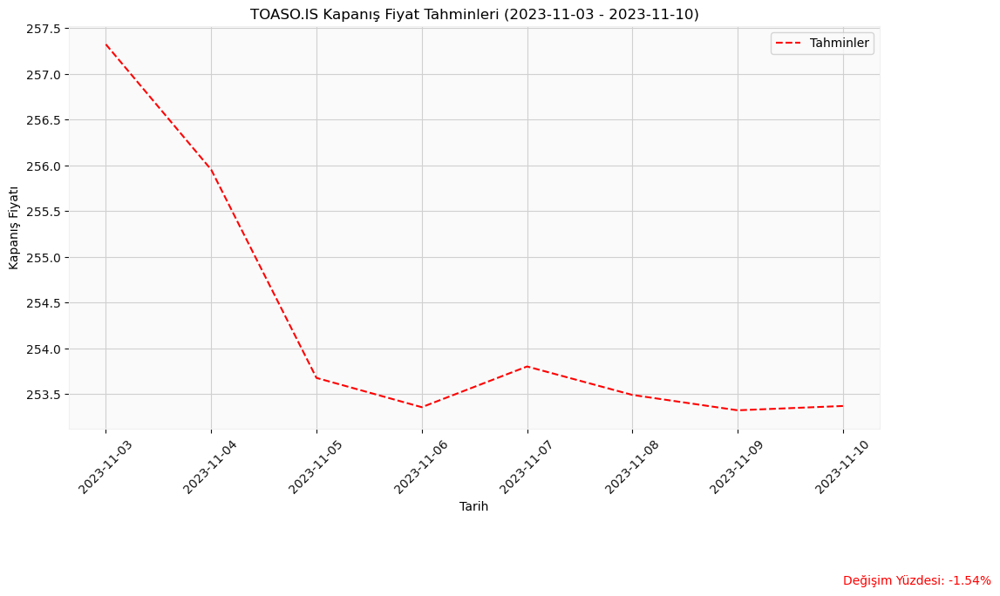

In [116]:


# Veri çekme
symbol = 'TOASO.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - TUPRS Hissesi

[*********************100%%**********************]  1 of 1 completed


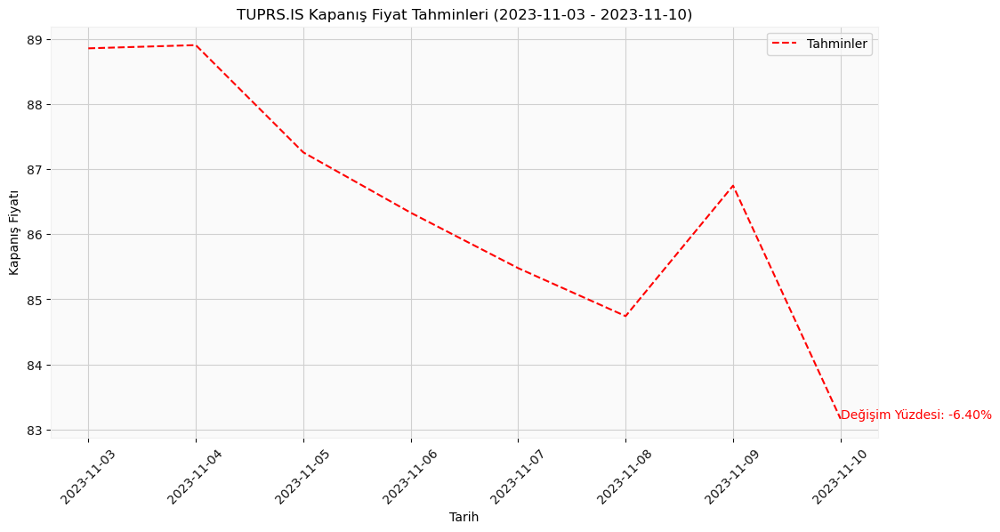

In [117]:


# Veri çekme
symbol = 'TUPRS.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

## Random Forest - YKBNK Hissesi

[*********************100%%**********************]  1 of 1 completed


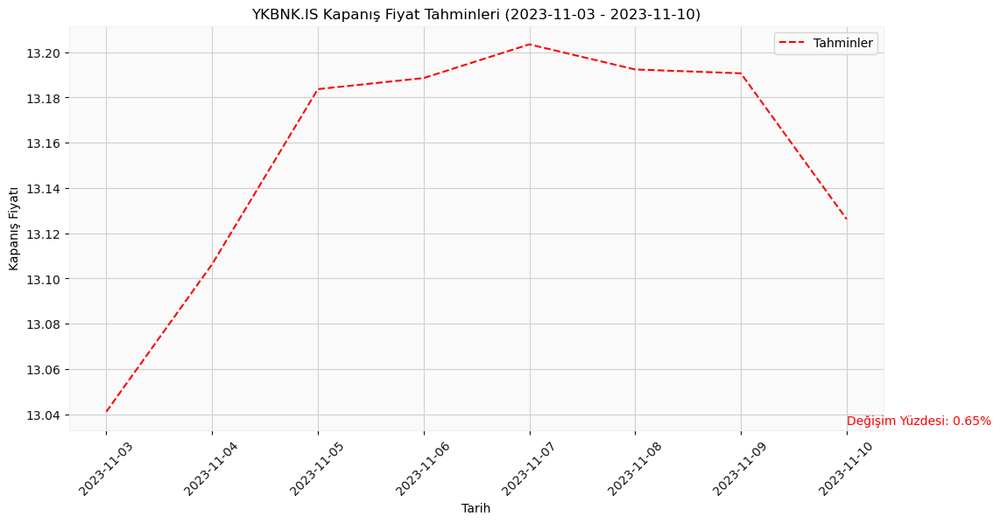

In [118]:


# Veri çekme
symbol = 'YKBNK.IS'  # İlgili hisse senedi sembolü
start_date = '2022-01-01'  # Verinin başlangıç tarihi
end_date = '2023-11-02'  # Verinin bitiş tarihi

data = yf.download(symbol, start=start_date, end=end_date)

# Tahminlerin başladığı tarih
prediction_start_date = '2023-11-03'
prediction_end_date = '2023-11-10'  # Tahmin aralığının son tarihi

# Verileri işleme
data = data['Close'].values  # Kapanış fiyatlarını bir NumPy dizisine dönüştürün

# Eğitim ve test verilerini oluşturun
seq_length = 10  # Zaman serisi uzunluğu
X, y = [], []

for i in range(len(data) - seq_length):
    X.append(data[i:i+seq_length])
    y.append(data[i+seq_length])

X = np.array(X)
y = np.array(y)

train_size = int(0.8 * len(data))
X_train, X_test, y_train, y_test = X[:train_size], X[train_size:], y[:train_size], y[train_size:]

# Verileri yeniden şekillendirin
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)
y_train = y_train.ravel()

# Modeli oluşturun ve eğitin (Random Forest kullanarak)
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Test verileri üzerinde tahminler yapın
y_pred = model.predict(X_test)

# Tahmin aralığını hesaplayın
prediction_start_date = datetime.datetime.strptime(prediction_start_date, '%Y-%m-%d')
prediction_end_date = datetime.datetime.strptime(prediction_end_date, '%Y-%m-%d')
prediction_days = (prediction_end_date - prediction_start_date).days

# Tahmin tarihlerini hesaplayın
formatted_dates = [date.strftime('%Y-%m-%d') for date in [prediction_start_date + datetime.timedelta(days=i) for i in range(prediction_days + 1)]]

# Yalnızca 3 Kasım'dan 10 Kasım'a kadar olan tahminleri alın
start_date_index = formatted_dates.index('2023-11-03')
end_date_index = formatted_dates.index('2023-11-10')

# Tahminleri çizin
plt.figure(figsize=(12, 6))
plt.title(f'{symbol} Kapanış Fiyat Tahminleri ({formatted_dates[start_date_index]} - {formatted_dates[end_date_index]})')
plt.xlabel('Tarih')
plt.ylabel('Kapanış Fiyatı')

# Tahminleri çizin
plt.plot(formatted_dates[start_date_index:end_date_index+1], y_pred[start_date_index:end_date_index+1], label='Tahminler', linestyle='--', color='red')

# Değişim yüzdesini hesaplayın
initial_price = y_pred[start_date_index]
final_price = y_pred[end_date_index]
price_change = (final_price - initial_price) / initial_price * 100
price_change = round(price_change, 2)

# Değişim yüzdesini yazdırın
plt.text(formatted_dates.index('2023-11-10'), min(y_pred), f'Değişim Yüzdesi: {price_change:.2f}%', fontsize=10, color='red')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()